In [1]:
from IPython.core.interactiveshell import InteractiveShell
import time

old_run_cell = InteractiveShell.run_cell

def timing_run_cell(self, raw_cell, *args, **kwargs):
    t0 = time.time()
    result = old_run_cell(self, raw_cell, *args, **kwargs)
    t1 = time.time()
    print(f"Execution time: {t1 - t0:.4f} seconds")
    return result

InteractiveShell.run_cell = timing_run_cell

In [2]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"
# os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=1"
os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=12"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

import jax
print("backend:", jax.default_backend())
print("devices:", jax.devices())


backend: cpu
devices: [CpuDevice(id=0)]
Execution time: 1.2647 seconds


# Import packages

In [3]:
import scipy.interpolate as spl
from matplotlib.pyplot import figure, show
import matplotlib.pyplot as plt
import numpy as np
#import sys
import emcee
from functools import partial
import corner
import os
#import pickle
import itertools
import jax
import jax.numpy as jnp
import jax.lax as lax
import jax.scipy as jsp
#import jax.extend
from multiprocessing import Pool
from jax import config
config.update("jax_enable_x64", True)
import pandas as pd
from decimal import Decimal, getcontext
import scipy.optimize as optimize
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation, PillowWriter
import scipy.integrate as spint
from scipy.integrate import solve_ivp
from scipy.special import gammainc, gamma
from scipy.optimize import brentq
from fractions import Fraction
import multiprocessing as mp
from concurrent.futures import ProcessPoolExecutor
from concurrent.futures import ThreadPoolExecutor

Execution time: 1.8720 seconds


In [4]:
# show JAX device that is being used
print(jax.devices())

[CpuDevice(id=0)]
Execution time: 0.0004 seconds


In [5]:
debug = False
if debug:
    print("Devices:", jax.devices())

    @jax.jit
    def heavy_matmul(x):
        for _ in range(10):
            x = x @ x
        return x

    x = jnp.ones((2000, 2000), dtype=jnp.float32)

    t0 = time.time()
    y = heavy_matmul(x).block_until_ready()
    t1 = time.time()
    print("Time:", t1 - t0, "s")
    print("Result device:", y.device)


Execution time: 0.0015 seconds


# Load Observational Data

In [6]:
BARY = pd.read_csv('../data/baryons.csv')
TOTAL = pd.read_csv('../data/galaxies_total_sample.csv')

BARY['Mass(Msun)'] =  pd.to_numeric(BARY['Mass(Msun)'], errors='coerce')
BARY['e_Mass(Msun)'] =  pd.to_numeric(BARY['e_Mass(Msun)'], errors='coerce')
BARY['j'] =  pd.to_numeric(BARY['j'], errors='coerce')
BARY['e_j'] =  pd.to_numeric(BARY['e_j'], errors='coerce')
BARY['fgas'] =  pd.to_numeric(BARY['fgas'], errors='coerce')
BARY['e_fgas'] =  pd.to_numeric(BARY['e_fgas'], errors='coerce')

TOTAL['Mstar'] =  pd.to_numeric(TOTAL['Mstar'], errors='coerce')
TOTAL['e_Mstar'] =  pd.to_numeric(TOTAL['e_Mstar'], errors='coerce')
TOTAL['Mgas'] =  pd.to_numeric(TOTAL['Mgas'], errors='coerce')
TOTAL['e_Mgas'] =  pd.to_numeric(TOTAL['e_Mgas'], errors='coerce')
TOTAL['jstar'] =  pd.to_numeric(TOTAL['jstar'], errors='coerce')
TOTAL['e_jstar'] =  pd.to_numeric(TOTAL['e_jstar'], errors='coerce')
TOTAL['jgas'] =  pd.to_numeric(TOTAL['jgas'], errors='coerce')
TOTAL['e_jgas'] =  pd.to_numeric(TOTAL['e_jgas'], errors='coerce')

obs_log_Mbar = np.log10(BARY['Mass(Msun)'])
obs_log_Mbar_errors = BARY['e_Mass(Msun)']/BARY['Mass(Msun)']
obs_log_Mgas = np.log10(TOTAL['Mgas'])
obs_log_Mgas_errors = TOTAL['e_Mgas']/TOTAL['Mgas']
obs_log_Mstar = np.log10(TOTAL['Mstar'])
obs_log_Mstar_errors = TOTAL['e_Mstar']/TOTAL['Mstar']
obs_log_jbar = np.log10(BARY['j'])
obs_log_jbar_errors = BARY['e_j']/BARY['j']
obs_log_jgas = np.log10(TOTAL['jgas'])
obs_log_jgas_errors = TOTAL['e_jgas']/TOTAL['jgas']
obs_log_jstar = np.log10(TOTAL['jstar'])
obs_log_jstar_errors = TOTAL['e_jstar']/TOTAL['jstar']
obs_fgas = BARY['fgas']
obs_fgas_errors = BARY['e_fgas']
obs_fgas_but_for_stars_and_gas = TOTAL['Mgas']/(TOTAL['Mgas'] + TOTAL['Mstar'])
obs_fgas_but_for_stars_and_gas_errors = np.sqrt( (TOTAL['e_Mgas']/(TOTAL['Mgas'] + TOTAL['Mstar']))**2 + (TOTAL['Mgas']*TOTAL['e_Mstar']/((TOTAL['Mgas'] + TOTAL['Mstar'])**2))**2 )

pavel_dir = '../data/compilation_AM_others/'

pavel_data = {}

for filename in os.listdir(pavel_dir):
    if filename.endswith('.csv'):
        filepath = os.path.join(pavel_dir, filename)
        
        df = pd.read_csv(filepath)
        
        df_name = os.path.splitext(filename)[0]
        #add to superthin: 9.04,2.95,9.85,0.55,9.912537485,2.088484546,0.8658895825
        pavel_data[df_name] = df

HIX_logMstar = np.array([10.5, 10.7, 10.5, 10.5, 10.3, 10.2,  9.8, 10.1, 10.1, 10.1, 10.6, 10.5])
HIX_logMHI = np.log10(1.4 * 10**np.array([10.6, 10.7, 10.5, 10.5, 10.4, 10.3,  9.9, 10.3, 10.4, 10.3, 10.9, 10.5]))
HIX_logMbar = np.log10(10**HIX_logMstar + 10**HIX_logMHI)
HIX_fgas = (10**HIX_logMHI)/(10**HIX_logMbar)
HIX_jbar = np.array([4125.6, 3523.8, 5453.1, 4092.4, 3522.7, 3749.8, 1993. , 3196.7, 3388.2, 6377.8, 9764. , 4117.7])

Execution time: 0.0222 seconds


In [7]:
CB_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

Execution time: 0.0004 seconds


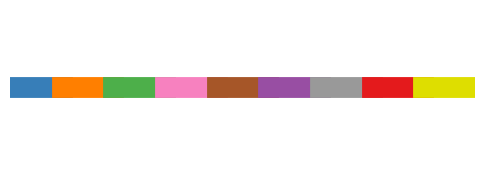

Execution time: 0.2574 seconds


In [8]:
# show CB_color_cycle on a plot
fig, ax = plt.subplots(figsize=(6, 2))
for i, color in enumerate(CB_color_cycle):
    ax.plot([i, i+1], [1, 1], color=color, linewidth=15)
ax.set_xlim(0, len(CB_color_cycle))
ax.set_ylim(0, 2)
ax.axis('off')
plt.show()

# Model definition

$j_{acc}(t) = 2v_{rot}(t)r_{acc}(t) \rightarrow r_{acc}(t) = \frac{j_{acc}(t)}{2 v_{rot}(t)}$ where $j_{acc}(t)=j_{min}+ k\cdot (j_{max}-j_{min}) \left( \frac{t}{t_0} \right)^n$ (start with n=1), and $v_{rot}(t) = \left( \frac{M_{bar}(t_0)}{A_G} \right)^{1/4}$

1) Determine $r_{acc}$ by determining $j_{acc}(t)$ and $v_{rot}(t)$:

   a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$.  This gives $v_{rot}(t)$.
   
   b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$ (as $j_{max}$ is when $f_{gas}=1 \rightarrow \log(f_{gas})=0$)
   
   c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$
   
2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from above

## 1) Determine $𝑟_{𝑎𝑐𝑐}$  by determining  $𝑗_{𝑎𝑐𝑐}(𝑡)$  and  $𝑣_{𝑟𝑜𝑡}(𝑡)$

### a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$

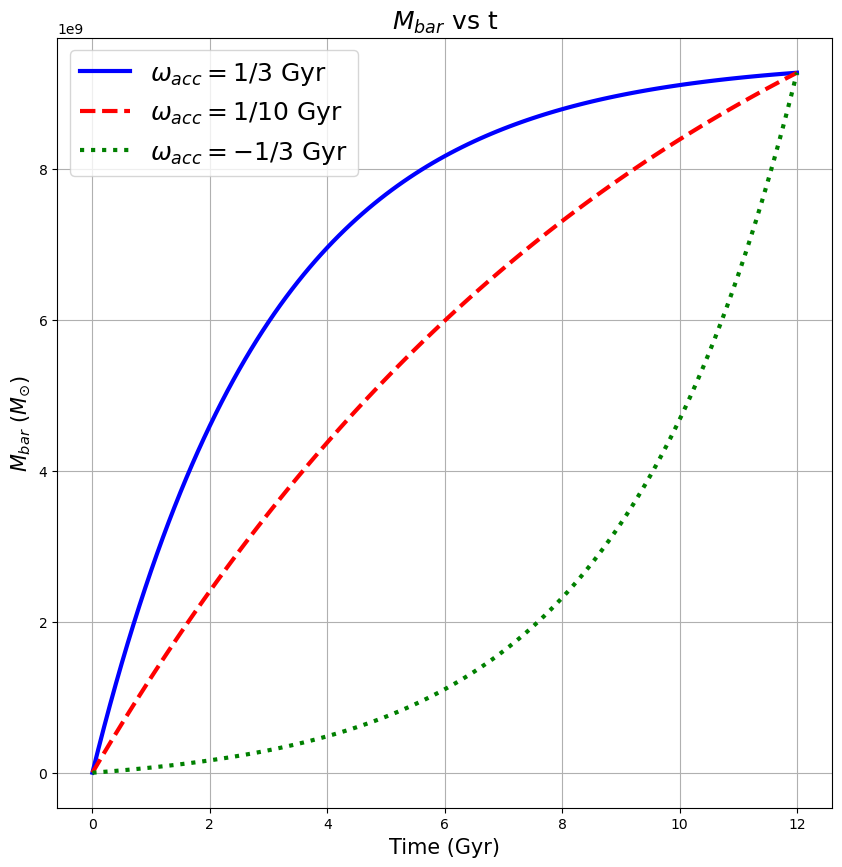

Execution time: 0.4187 seconds


In [9]:
dt=0.1
M_times = np.arange(0,12.1,dt)

def C_def(M_bar, t_acc, t0=12.):
    """Returns the normalization constant by imposing a value of the baryonic mass at a given
    time and accretion timescale. Default time is taken as today, t_0 = 12Gyr."""
    if (t_acc==np.inf):
        return M_bar/t0
    elif (t_acc<0):
        return M_bar/(abs(t_acc)*(np.exp(t0/abs(t_acc))-1))
    else:
        return M_bar/(t_acc*(1-np.exp(-t0/t_acc)))

def M_def(M_bar, t_acc, t=M_times, dt=dt):
    """Returns the baryonic mass predicted from the accreting mass having an exponential form in time."""
    C = C_def(M_bar, t_acc)
    if (t_acc==np.inf):
        return C*t
    elif (t_acc<0):
        return C*abs(t_acc)*(np.exp(t/abs(t_acc))-1)
    else:
        return C*t_acc*(1-np.exp(-t/t_acc))

t_acc = np.array([3.,10.,-3.]) #GYr
colors = ['b', 'r', 'g']
styles = ['solid', 'dashed', 'dotted']

M_bar_t0 = 9.27e9
M_bar_array = np.zeros((len(t_acc),len(M_times)))
for i, t_accr in enumerate(t_acc):
    M_bar_array[i] = M_def(M_bar_t0, t_accr)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    frame.plot(M_times, M_bar_array[i], label = fr"$\omega_{{acc}} = {Fraction(1,int(t_accr))}$ Gyr", color=col, linestyle=sty, lw=3)
frame.set_title(r"$M_{bar}$ vs t", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
pd.DataFrame(M_bar_array.T, columns=['t_acc=3Gyr', 't_acc=10Gyr', 't_acc=25Gyr']).to_csv('../data/data9_JAX_aKSL/M_bar_vs_'+f'{np.log10(M_bar_t0)}'+'.csv')
fig.savefig('../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation).png')

### a) i) Find $v_{BTFR}$ from $M_{bar}$ (constant in time)

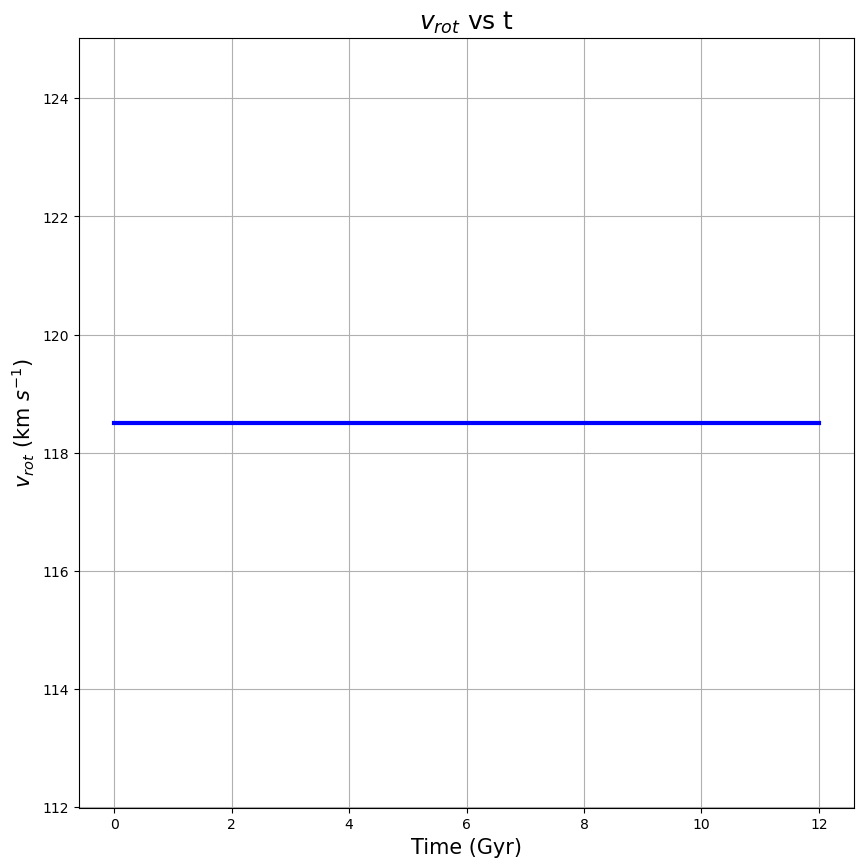

Execution time: 0.2074 seconds


In [10]:
def v_btfr_def(M_bar, Ag=47):
    """Returns the value of the velocity from the baryonic Tully-Fisher relation. The default constant
    value Ag is taken from McGaugh (2012)."""
    return (M_bar/Ag)**0.25

Ag = 47 #M_{\odot} km^{-4} s^{-4}
M_bar_allsame = np.full(M_bar_array[0].shape, M_bar_t0)
v_btfr_array = v_btfr_def(M_bar_allsame)
#print(v_rot_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, v_btfr_array, color="blue", lw=3)
frame.set_title(r"$v_{rot}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$v_{rot}$ (km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/v_rot_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', v_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/v_btfr vs time (t_acc variation).png')

### b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$

In [11]:
def j_maxer(Mbar):
    """Returns the maximum value of the accreting angular momentum. This is determined empirically, by 
    utilizing the fit found by Mancera-Piña et al. (2021), and setting f_gas = 1. This is because the
    theoretical maximum accreting angular momentum should fall where there is maximum gas, in the outer-most
    regions of the galaxy."""
    return (Mbar**0.73)*10**(-4.25)

j_max = (M_bar_t0**0.73)*10**(-4.25)
print(j_max)

1061.6178348386752
Execution time: 0.0008 seconds


### c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$


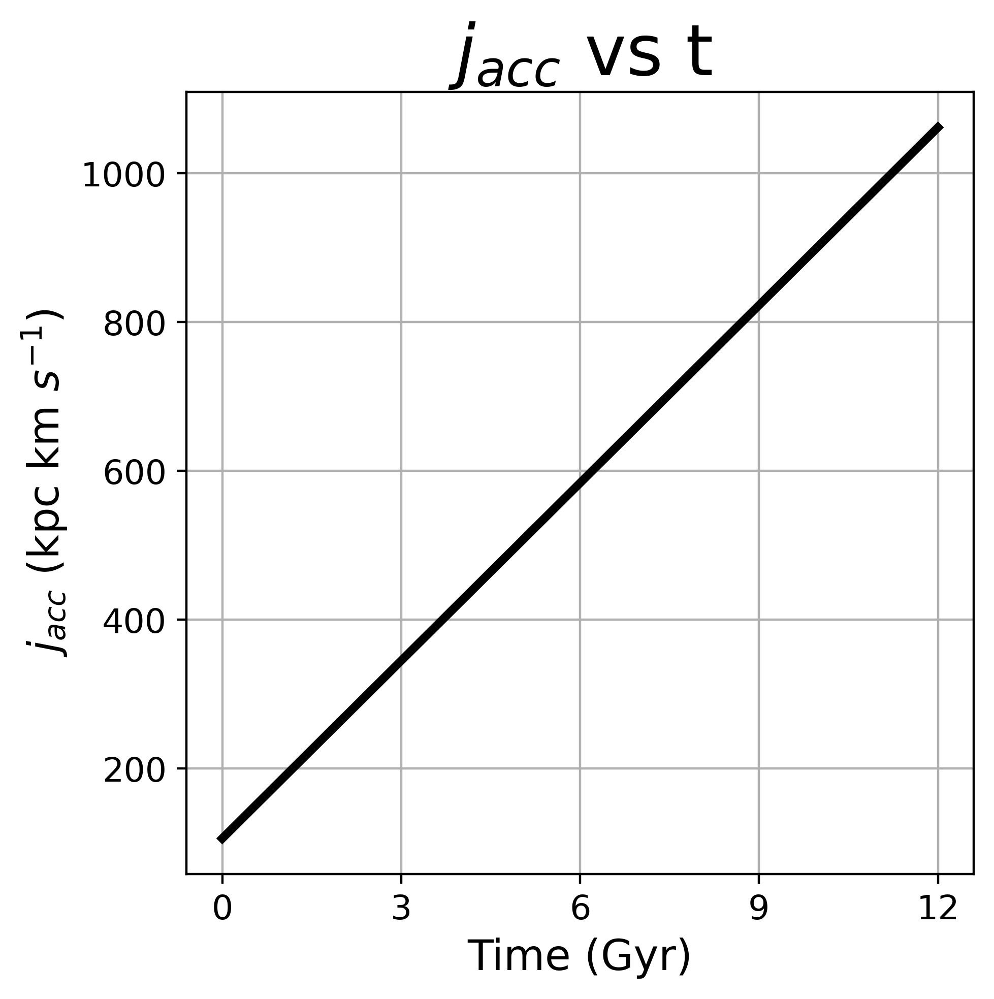

Execution time: 0.5519 seconds


In [ ]:
def j_acc_def(j_max, t, t0=12, n=1, con=1):
    """Determines the accreting specific angular momentum given j_max, the velocity from the BTFR, at any
    given time. The minimum angular momentum is determined by dividing j_max by 10."""
    #r_acc_min = (10**(0.385*(np.log10(Mbar)-10)+0.281))/5
    j_min = j_max/10.
    return j_min+(con*j_max-j_min)*(t/t0)**n

ki=1
j_acc_array = j_acc_def(j_max, M_times, con=ki)

fig = figure(figsize=(5,5), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, j_acc_array, color="k", lw=3)
frame.set_title(r"$j_{acc}$ vs t", fontsize = 25)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{acc}$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.tick_params(labelsize=12)
frame.set_xticks([0, 3, 6, 9, 12])
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/j_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', j_acc_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/j_acc vs time (t_acc variation).png')

### d) Determine $r_{BTFR}(t)$ from $j_{acc}(t) = 2v_{flat} \left( r_{acc} - \frac{R_v^3 r_{acc}}{(R_v+r_{acc})^3} \right)$

In [13]:

def rv_def(M_bar, kpc=True):
    if kpc:
        return -0.005034150233993362*v_btfr_def(M_bar)+2.6658196850679956
    else:
        return -5.034150233993362*v_btfr_def(M_bar)+2665.8196850679956

rv_def(10**10)

2.0578223054087963

Execution time: 0.0024 seconds


In [14]:
def interp1d_jax(x_grid, y_grid, x):
    """
    Simple linear interpolation in JAX, assuming x_grid is 1D and sorted.
    Extrapolation: clamp slope using the edge segments.
    """
    x_grid = jnp.asarray(x_grid)
    y_grid = jnp.asarray(y_grid)

    # Find index i so that x_grid[i] <= x < x_grid[i+1]
    idx = jnp.searchsorted(x_grid, x, side="right") - 1
    idx = jnp.clip(idx, 0, x_grid.size - 2)

    x0 = x_grid[idx]
    x1 = x_grid[idx + 1]
    y0 = y_grid[idx]
    y1 = y_grid[idx + 1]

    w = (x - x0) / (x1 - x0)
    return y0 + w * (y1 - y0)

Execution time: 0.0014 seconds


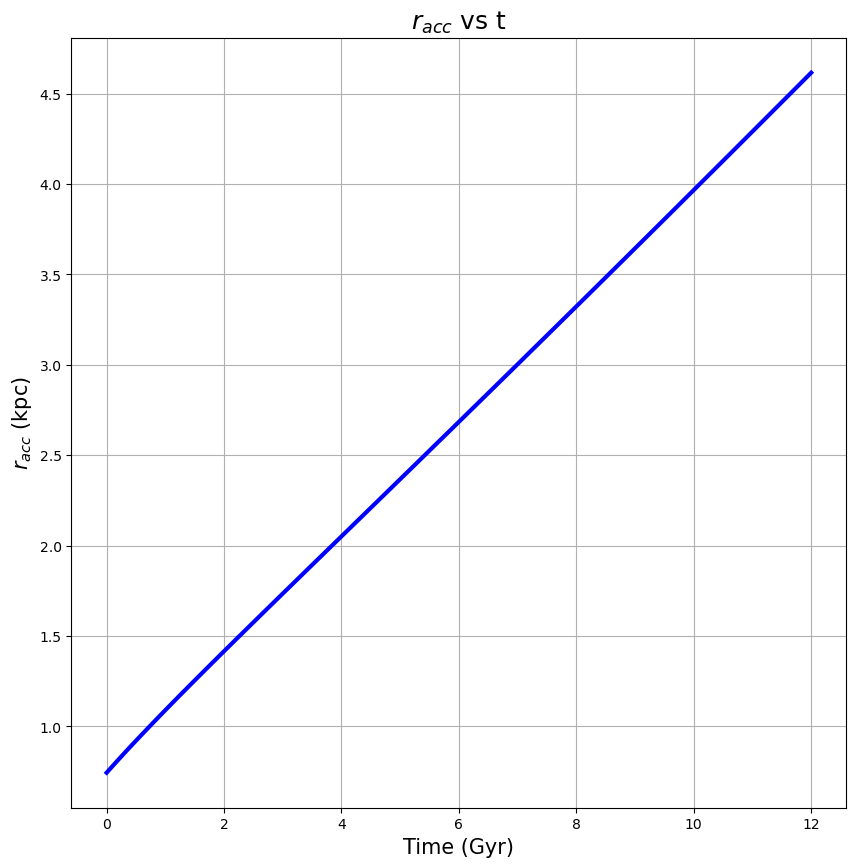

Execution time: 0.3830 seconds


In [15]:
def analytical_r(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def r_btfr_def(M_bar, j_acc, init=1.0):
    
    rv = rv_def(M_bar, kpc=True)
    yer = j_acc / (2*v_btfr_def(M_bar))
    if hasattr(yer, '__len__'):
        r_acc = []
        for i in range(len(j_acc)):
            r_acc.append(optimize.newton(analytical_r, init, args=(rv[i], yer[i])))
        return np.array(r_acc)
    else:
        return optimize.newton(analytical_r, init, args=(rv, yer))

r_btfr_array = r_btfr_def(M_bar_allsame, j_acc_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, r_btfr_array, color="blue", lw=3)
frame.set_title(r"$r_{acc}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{acc}$ (kpc)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/r_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', r_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/r_acc vs time (t_acc variation).png')

### e) Analytical $j_{bar}$

/tmp/ipykernel_894500/3087275908.py:5: RuntimeWarning: divide by zero encountered in divide
  return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass


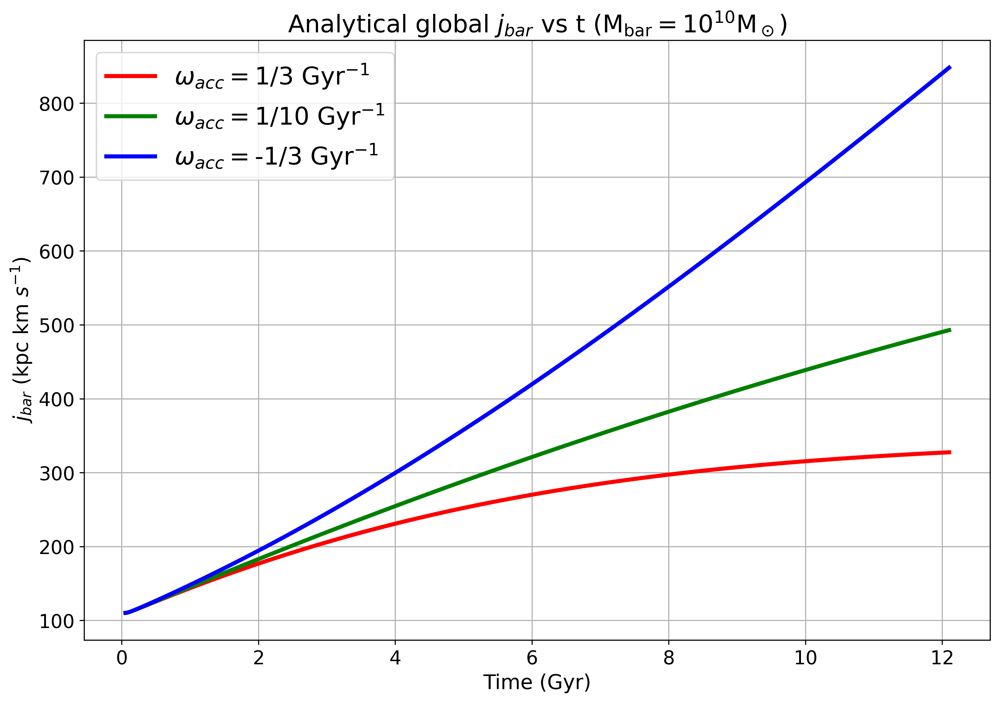

Execution time: 1.7751 seconds


In [16]:
def j_bar_analytical(t, Mbar, t_acc, dt=0.1):
    bar_mass = M_def(Mbar, t_acc, t)
    M_dot_bar = C_def(Mbar, t_acc)*np.exp(-t/t_acc)
    acc_j = j_acc_def(j_maxer(Mbar), t)
    return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass

colorz = ['r', 'g', 'b']
stylez = ['dashed', 'dotted', 'solid']

M_times1 = np.arange(0,12.2,0.1)
M_times2 = np.arange(0, 12.101, 0.001)
j_bar_array_analytical = np.zeros((len(t_acc),len(M_times2)))
for i, t_accr in enumerate(t_acc):
    j_bar_array_analytical[i] = j_bar_analytical(M_times2, M_bar_t0, t_accr, dt=0.001)
    
fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colorz, stylez):
    frame.plot(M_times2[53:], j_bar_array_analytical[i][53:], label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
frame.set_title(r"Analytical global $j_{bar}$ vs t ($\mathrm{M}_{\mathrm{bar}}=10^{10}\mathrm{M}_\odot$)", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/Analytical j_bar vs time (t_acc variation).png')

np.savetxt('data7/j_bar_analytical (-3)', j_bar_array_analytical[-1])

### f) $\Omega$

In [17]:
def exp_vrot(r, Mbar, kpc=False):
    rv = rv_def(Mbar, kpc=kpc)
    return v_btfr_def(Mbar)*(1-np.exp(-r/rv))

def exp_vrot_jax(r_pc, M_bar):
    rv = rv_def(M_bar, kpc=False)
    return v_btfr_def(M_bar) * (1.0 - jnp.exp(-r_pc / rv))

def omega(R, M_bar, rv):
    if hasattr(R, '__len__'):
        omega_list = []
        for r in R:
            if r == 0:
                omega_list.append(v_btfr_def(M_bar)/rv)
            else:
                omega_list.append((v_btfr_def(M_bar)*(1-np.exp(-r/rv)))/r)

        return np.array(omega_list)
    else:
        if R == 0:
            return v_btfr_def(M_bar)/rv
        else:
            return (v_btfr_def(M_bar)*(1-np.exp(-R/rv)))/R
        
@jax.jit
def omega_kms_per_pc_jax(R_pc, Mbar):
    """
    Units: (km/s)/pc
    """
    R_pc = jnp.asarray(R_pc)

    v0 = v_btfr_def(Mbar)
    rv_pc = rv_def(Mbar, kpc=False)

    vR = exp_vrot_jax(R_pc, Mbar)

    return jnp.where(R_pc == 0.0, v0/rv_pc, vR/R_pc)

r = np.arange(0,1000*100.1,120)
M_bar_allsame1 = np.full(M_times1.shape, M_bar_t0)
# omegas = omega(r, M_bar_t0, rv_def(M_bar_t0, kpc=False))
#print(omegas)

Execution time: 0.0033 seconds


In [18]:
def find_nearest(array, value):
    """
    Finds nearest element in an array with wanted value
    
    Inputs:
    array(np.array): array to extract closest element to wanted value
    value(int): wanted value to find closest element to
    
    Returns:
    array[idx](np.array): indexed array with index of closest value
    """
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

index_r1 = np.argwhere(r == find_nearest(r, 25000.))[0][0]
index_r2 = np.argwhere(r == find_nearest(r, 50000.))[0][0]
index_r3 = np.argwhere(r == find_nearest(r, 75000.))[0][0]
index_r4 = np.argwhere(r == find_nearest(r, 100000.))[0][0]
index_r5 = np.argwhere(r == find_nearest(r, 60000.))[0][0]

Execution time: 0.0023 seconds


### g) $r_{acc}$ Matrix

In [19]:
M_times1_jax = jnp.array(M_times1, dtype=jnp.float64)
log_M_bar_array = np.linspace(8.0, 11.5, 50)
t_end = float(M_times1[-1])
n_t = M_times1_jax.shape[0]
log_M_bar_array_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.0520 seconds


In [20]:
log_M_bar_array = np.linspace(8,11.5,50)
j_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))

for i, Mbar_value in enumerate(log_M_bar_array):
    j_acc_matrix[i] = j_acc_def(j_maxer(10**Mbar_value), M_times1)
    
print(j_acc_matrix)

[[3.89045145e+00 4.18223531e+00 4.47401917e+00 ... 3.86127306e+01
  3.89045145e+01 3.91962984e+01]
 [4.38674972e+00 4.71575595e+00 5.04476218e+00 ... 4.35384910e+01
  4.38674972e+01 4.41965034e+01]
 [4.94635992e+00 5.31733691e+00 5.68831391e+00 ... 4.90926222e+01
  4.94635992e+01 4.98345762e+01]
 ...
 [1.09828306e+03 1.18065429e+03 1.26302552e+03 ... 1.09004594e+04
  1.09828306e+04 1.10652018e+04]
 [1.23838916e+03 1.33126835e+03 1.42414754e+03 ... 1.22910124e+04
  1.23838916e+04 1.24767708e+04]
 [1.39636836e+03 1.50109599e+03 1.60582362e+03 ... 1.38589560e+04
  1.39636836e+04 1.40684112e+04]]
Execution time: 0.0018 seconds


r_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))
for i, Mbar_value in enumerate(log_M_bar_array):
    r_acc_matrix[i] = r_btfr_def(np.full(M_times1.shape, 10**Mbar_value), j_acc_matrix[i])

np.savetxt('../data/data9_JAX_aKSL/r_acc_matrix_'+f'{np.log10(M_bar_t0)}'+'.txt', r_acc_matrix)

print(r_acc_matrix.shape)
r_acc_matrix

r_acc_interpolators = np.array([
    spl.interp1d(M_times1, r_acc_matrix[Mbar_index, :], fill_value="extrapolate")
    for Mbar_index in range(r_acc_matrix.shape[0])
])

print(r_acc_interpolators.shape)

In [21]:
def build_r_acc_matrix_for_all_M(ns, ks):
    """
    Build r_acc(M_bar, t) on the same time grid M_times1 and mass grid log_M_bar_array
    using your existing j_acc_def and r_btfr_def.
    
    Returns: numpy array of shape (len(log_M_bar_array), len(M_times1)) in kpc.
    """
    n_M = len(log_M_bar_array)
    n_t = len(M_times1)
    r_acc_matrix = np.zeros((n_M, n_t), dtype=float)

    for i, logM in enumerate(log_M_bar_array):
        Mbar = 10.0**logM
        j_max = j_maxer(Mbar)
        j_acc = j_acc_def(j_max, M_times1, n=ns, con=ks)
        r_acc = r_btfr_def(np.full_like(j_acc, Mbar), j_acc)
        r_acc_matrix[i, :] = r_acc

    return r_acc_matrix

def r_acc_factory(t_grid_gyr, nl, kl):
    """
    Returns a function factory(Mbar, ns, ks) -> r_acc_interp(t) in *kpc*,
    implementing j_acc(t) = j_min + ks*(j_max - j_min) * (t/t0)**ns.
    Here j_min=0 (disc center), j_max computed from j(r) out to Rmax_kpc.
    """

    log_M_bar_array = np.linspace(8,11.5,50)
    j_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))

    for i, Mbar_value in enumerate(log_M_bar_array):
        j_acc_matrics[i] = j_acc_def(j_maxer(10**Mbar_value), t_grid_gyr, n=nl, con=kl)
        
    # def _solve_row(args):
    #     i, Mbar_value = args
    #     return r_btfr_def(np.full(t_grid_gyr.shape, 10.0**Mbar_value), j_acc_matrics[i])

    # with ProcessPoolExecutor() as ex:
    #     rows = list(ex.map(_solve_row, enumerate(log_M_bar_array)))
        
    # r_acc_matrics = np.vstack(rows)
        
    r_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))
    for i, Mbar_value in enumerate(log_M_bar_array):
        r_acc_matrics[i] = r_btfr_def(np.full(t_grid_gyr.shape, 10**Mbar_value), j_acc_matrics[i])
    
    return np.array([spl.interp1d(t_grid_gyr, r_acc_matrics[Mbar_index, :], fill_value="extrapolate") for Mbar_index in range(r_acc_matrics.shape[0])])

Execution time: 0.0021 seconds


In [ ]:
# JAX-ified r_acc utilities for vectorized/sharded MCMC
def analytical_r_jax(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def analytical_r_prime_jax(x, c):
    return 1.0 - (c**3 * (c - 2.0 * x)) / (c + x)**4

def newton_solve_r_jax(c, y, x0=1.0, n_iter=30):
    def body(_, x):
        f = analytical_r_jax(x, c, y)
        fp = analytical_r_prime_jax(x, c)
        fp = jnp.where(jnp.abs(fp) < 1e-12, jnp.sign(fp) * 1e-12, fp)
        x_new = x - f / fp
        return jnp.where(jnp.isfinite(x_new), x_new, x)
    return jax.lax.fori_loop(0, n_iter, body, jnp.asarray(x0, dtype=jnp.float64))

def r_btfr_def_jax(M_bar, j_acc, init=1.0, n_iter=30):
    rv = rv_def(M_bar, kpc=True)
    y = j_acc / (2.0 * v_btfr_def(M_bar))
    solve_one = lambda y_val: newton_solve_r_jax(rv, y_val, x0=init, n_iter=n_iter)
    return jax.vmap(solve_one)(y)

@jax.jit
def build_r_acc_matrix_for_all_M_jax(ns, ks):
    Mbar = 10.0 ** log_M_bar_array_jax
    def per_mass(Mbar_val):
        j_max = j_maxer(Mbar_val)
        j_acc = j_acc_def(j_max, M_times1_jax, n=ns, con=ks)
        r_acc = r_btfr_def_jax(Mbar_val, j_acc, init=1.0, n_iter=30)
        return r_acc
    return jax.vmap(per_mass)(Mbar)


In [22]:
# run r_acc_factory with different n and k values to generate different r_acc interpolators; construct matrix of r_acc_interpolators that is 3D, with shape (len(n_values), len(k_values), len(log_M_bar_array))

n_values = [0.5, 1.0, 1.5]
k_values = [0.5, 1.0, 1.5, 2.0]

# RUN THIS CELL ONLY ONCE TO SAVE THE r_acc_interpolators_matrix TO A FILE
run = False
if run:
    r_acc_interpolators_matrix = np.zeros((len(n_values), len(k_values), len(log_M_bar_array)), dtype=object)
    for i, n_val in enumerate(n_values):
        for j, k_val in enumerate(k_values):
            r_acc_interpolators_matrix[i, j] = r_acc_factory(n_val, k_val)
            
    r_acc_interpolator_lower_res = r_acc_interpolators_matrix[2, 1]

    np.save(f'../data/data9_JAX_aKSL/r_acc_interpolators_matrix_nk_values_{np.log10(M_bar_t0)}.npy', r_acc_interpolators_matrix)

Execution time: 0.0015 seconds


print(r_acc_interpolators_matrix.shape)
r_acc_interpolators_matrix

In [23]:
r_acc_matrix_np = build_r_acc_matrix_for_all_M(1., 1.) # numpy
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.6533 seconds


## 2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from (1)

In [24]:
Rf = 0.3

def SFL(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)

    # Enforce physical domain: negative gas is set 0
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFL_val = (1 - Rf) * A * (sigma_pos**N)

    elif sfl_type == "new_ksl":
        A_ksl = 1.58e-3
        N_ksl = 3.26
        SFL_val = (1 - Rf) * A_ksl * (sigma_pos**N_ksl)

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFL_val = ((1 - Rf)
                    * A_boissier
                    * (sigma_pos**N_boissier)
                    * omega(R, Mbar, rv_def(Mbar, kpc=False))
                    * 1022.0)  # km/s/pc → 1/Gyr

    elif sfl_type == "cutoff_ksl":
        thr = 0.9422535293578466

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg  = (1 - Rf) * 1.58e-3 * (sigma_pos**3.26)
        high_reg = (1 - Rf) * 6.68e-2 * (sigma_pos**1.54)

        SFL_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFL_val = np.where(np.isfinite(SFL_val), SFL_val, 0.0)

    if np.isscalar(sigma):
        return float(SFL_val)
    return SFL_val

def SFL_jax(sigma, sfl_type, R, Mbar):
    Rf = 0.3
    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        return (1.0 - Rf) * A * (sigma**N)
    elif sfl_type == "new_ksl":
        A_ksl = 1.58e-3
        N_ksl = 3.26
        return (1.0 - Rf) * A_ksl * (sigma**N_ksl)
    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        Omega_Gyr = omega_kms_per_pc_jax(R, Mbar) * 1022.712165
        return (1.0 - Rf) * A_boissier * (sigma**N_boissier) * Omega_Gyr
    elif sfl_type == "cutoff_ksl":
        # piecewise, same as your cutoff KSL
        log_sigma = jnp.log10(jnp.clip(sigma, a_min=1e-99))  # just to avoid log(0), not a floor on sigma itself
        A1, N1 = 1.58e-3, 3.26
        A2, N2 = 6.68e-2,  1.54
        cond = log_sigma < 0.9422535293578466
        sfl1 = (1.0 - Rf) * A1 * (sigma**N1)
        sfl2 = (1.0 - Rf) * A2 * (sigma**N2)
        return jnp.where(cond, sfl1, sfl2)
    else:
        raise ValueError(f"Unknown sfl_type '{sfl_type}' in SFL_jax")

def SFE(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFE_val = A * (sigma_pos**(N - 1.0))

    elif sfl_type == "new_ksl":
        A_ksl = 1.58e-3
        N_ksl = 3.26
        SFE_val = A_ksl * (sigma_pos**(N_ksl - 1.0))

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFE_val = (A_boissier
                   * (sigma_pos**(N_boissier - 1.0))
                   * omega(R, Mbar, rv_def(Mbar, kpc=False))
                   * 1022.0)

    elif sfl_type == "cutoff_ksl":
        thr = 0.9422535293578466

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg = 1.58e-3 * (sigma_pos**(3.26 - 1.0))
        high_reg = 6.68e-2 * (sigma_pos**(1.54 - 1.0))

        SFE_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFE_val = np.where(np.isfinite(SFE_val), SFE_val, 0.0)

    if np.isscalar(sigma):
        return float(SFE_val)
    return SFE_val

Execution time: 0.0058 seconds


In [25]:
def sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec):
    r_acc = 1000.0 * interp1d_jax(M_times1_jax, r_acc_vec, t)   # kpc -> pc like your code
    return (C / (2.0 * jnp.pi * r_acc**2.0)) * jnp.exp(-t / t_acc) * jnp.exp(-r_value / r_acc)

def choose_dt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec,
                  base_dt=0.1, dt_min=1e-3, safety=2.0):
    S = jnp.asarray(S)

    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)

    t_sup = jnp.where((S > 0.0) & (Sigma_acc > 0.0), S / Sigma_acc, jnp.inf)
    t_dep = jnp.where((S > 0.0) & (Sigma_sfr > 0.0), S / Sigma_sfr, jnp.inf)

    t_char = jnp.minimum(t_sup, t_dep)
    dt_raw = jnp.minimum(base_dt, t_char/safety)
    dt_raw = jnp.maximum(dt_raw, dt_min)

    # if Sigma == 0, just use base_dt (like your “both timescales inf” case)
    dt = jnp.where(S <= 0.0, base_dt, dt_raw)
    return dt

def dydt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)
    return Sigma_acc - Sigma_sfr

def RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    k1 = dydt_jax(t,            S,             r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k2 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k1, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k3 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k2, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k4 = dydt_jax(t + dt,       S + dt*k3,     r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

    S_new = S + (dt/6.0)*(k1 + 2.0*k2 + 2.0*k3 + k4)
    t_new = t + dt
    S_new = jnp.maximum(S_new, 0.0)  # just clip tiny negatives
    return t_new, S_new

@partial(jax.jit, static_argnames=("sfl_type",))
def compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc, sfl_type,
                    r_acc_matrix_for_all_M):
    """
    JAX version of compute_row that matches your adaptive RK logic:
    - row[0] = 0 at t=0
    - adaptive dt
    - linear interpolation onto M_times1_jax grid
    """
    r_acc_vec = r_acc_matrix_for_all_M[Mbar_index]  # shape (n_t,)

    # initial state
    t0 = 0.0
    S0 = 0.0
    row0 = jnp.zeros(n_t, dtype=jnp.float64).at[0].set(S0)
    save_idx0 = 1  # we already set index 0

    state0 = (t0, S0, save_idx0, row0)

    def cond_fun(state):
        t, S, save_idx, row = state
        return jnp.logical_and(t < t_end, save_idx < n_t)

    def body_fun(state):
        t, S, save_idx, row = state

        dt = choose_dt_jax(t, S, r_value, C, t_acc, M_bar,
                           sfl_type, r_acc_vec,
                           base_dt=0.1, dt_min=1e-3, safety=2.0)

        t_new, S_new = RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

        # pack everything to pass into lax.cond
        carry = (t, S, t_new, S_new, save_idx, row)

        def save_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            t_grid = M_times1_jax[idx]
            denom = jnp.maximum(t_n - t_old, 1e-12)
            theta = (t_grid - t_old) / denom
            S_grid = S_old + theta * (S_n - S_old)
            row_i = row_i.at[idx].set(S_grid)
            return (t_n, S_n, t_n, S_n, idx + 1, row_i)

        def nosave_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            return (t_n, S_n, t_n, S_n, idx, row_i)

        cond_save = jnp.logical_and(
            save_idx < n_t,
            t_new >= M_times1_jax[save_idx]
        )

        t2, S2, _t2, _S2, save_idx2, row2 = lax.cond(cond_save, save_branch, nosave_branch, carry)
        return (t2, S2, save_idx2, row2)

    t_f, S_f, save_idx_f, row_f = lax.while_loop(cond_fun, body_fun, state0)

    # If for some reason we stopped before filling all times, copy last value forward
    def fill_rest(row):
        last_val = row[save_idx_f-1]
        idxs = jnp.arange(n_t)
        mask = idxs >= save_idx_f
        return jnp.where(mask, last_val, row)

    row_f = lax.cond(save_idx_f < n_t, fill_rest, lambda x: x, row_f)

    return row_f

@partial(jax.jit, static_argnames=("sfl_type",))
def Sigma_definer_jax(r, t_acc, M_bar, C, sfl_type,
                      r_acc_matrix_for_all_M, log_M_bar_array):
    """
    JAX equivalent of Sigma_definer:
    returns Σ_gas(R_i, t_j) as a JAX array of shape (len(r), n_t).
    """
    r = jnp.asarray(r, dtype=jnp.float64)
    logM = jnp.log10(M_bar)
    Mbar_index = jnp.argmin(jnp.abs(log_M_bar_array - logM))

    def solve_at_radius(r_value):
        return compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc,
                               sfl_type, r_acc_matrix_for_all_M)

    Sigma = jax.vmap(solve_at_radius)(r)  # (len(r), n_t)
    return Sigma

Execution time: 0.0082 seconds


In [26]:
Sigma_gas_cutoff_ksl1 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
print(Sigma_gas_cutoff_ksl1)
Sigma_gas_cutoff_ksl2 = Sigma_definer_jax(r, t_acc[1], M_bar_t0, C_def(M_bar_t0, t_acc[1]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
Sigma_gas_cutoff_ksl3 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl3)

[[0.00000000e+00 7.95813383e+01 1.43144256e+02 ... 1.58833974e+01
  1.55985543e+01 1.53207302e+01]
 [0.00000000e+00 6.83275118e+01 1.23726029e+02 ... 1.56602425e+01
  1.53813696e+01 1.51093177e+01]
 [0.00000000e+00 5.86576811e+01 1.06904863e+02 ... 1.54373377e+01
  1.51643999e+01 1.48980871e+01]
 ...
 [0.00000000e+00 7.00551834e-54 1.49840040e-51 ... 2.52971797e-10
  2.84855132e-10 3.20110232e-10]
 [0.00000000e+00 6.02344532e-54 1.29555487e-51 ... 2.46314891e-10
  2.77406796e-10 3.11792828e-10]
 [0.00000000e+00 5.17905498e-54 1.12013945e-51 ... 2.39713697e-10
  2.70023491e-10 3.03550908e-10]]
Execution time: 1.1543 seconds


/tmp/ipykernel_894500/2416228387.py:9: RuntimeWarning: divide by zero encountered in log10
  im = frame.imshow(np.log10(np.abs(np.array(Sigma1) - np.array(Sigma2))), aspect='auto', origin='lower', cmap='viridis', vmin=-20)


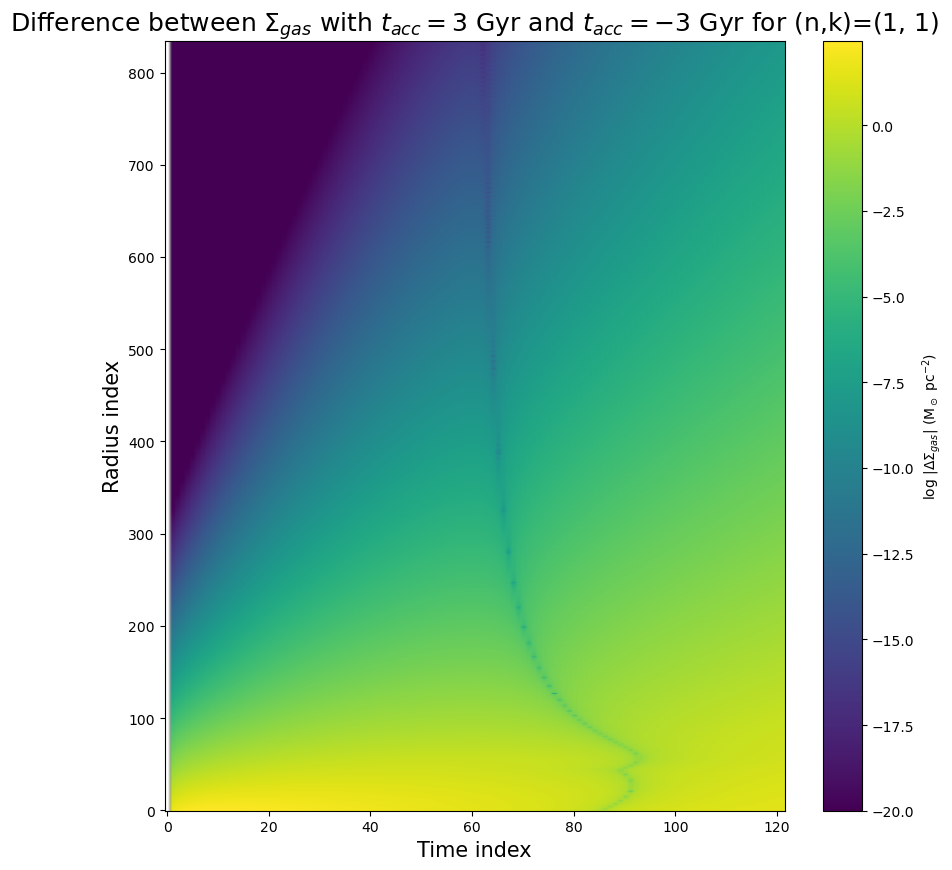

Execution time: 1.6872 seconds


In [27]:
debug = True
if debug:
    #Sigma_gas_cutoff_ksl1_np = np.loadtxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt')
    Sigma1 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
    Sigma2 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.log10(np.abs(np.array(Sigma1) - np.array(Sigma2))), aspect='auto', origin='lower', cmap='viridis', vmin=-20)
    fig.colorbar(im, ax=frame, label=r"log $|\Delta \Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Difference between $\Sigma_{gas}$ with $t_{acc}=3$ Gyr and $t_{acc}=-3$ Gyr for (n,k)=(1, 1)", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    # frame.tick_params(labelsize=12)
    # frame.set_xticks(np.arange(0, len(M_times1), 20))
    # frame.set_yticks(np.arange(0, len(r), 5))
    show()

/tmp/ipykernel_894500/1758316611.py:7: RuntimeWarning: divide by zero encountered in log10
  im = frame.imshow(np.log10(np.abs(np.array(Sigma1[:, :-1]) - np.array(Sigma2[:, :-1]))), aspect='auto', origin='lower', cmap='viridis')


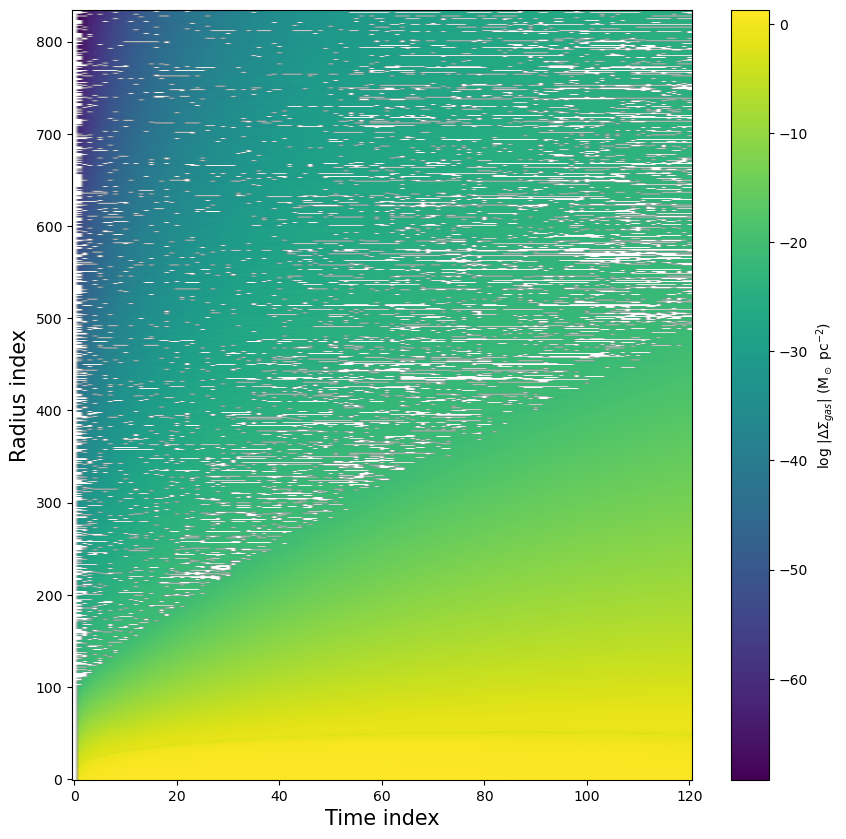

Execution time: 1.0645 seconds


In [28]:
Sigma1 = np.loadtxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt')
Sigma2 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
#Sigma2 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
im = frame.imshow(np.log10(np.abs(np.array(Sigma1[:, :-1]) - np.array(Sigma2[:, :-1]))), aspect='auto', origin='lower', cmap='viridis')
fig.colorbar(im, ax=frame, label=r"log $|\Delta \Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
# frame.set_title(r"Difference between $\Sigma_{gas}$ with $t_{acc}=3$ Gyr and $t_{acc}=-3$ Gyr for (n,k)=(1, 1)", fontsize = 18)
frame.set_xlabel("Time index", fontsize = 15)
frame.set_ylabel("Radius index", fontsize = 15)
# frame.tick_params(labelsize=12)
# frame.set_xticks(np.arange(0, len(M_times1), 20))
# frame.set_yticks(np.arange(0, len(r), 5))
show()

/tmp/ipykernel_894500/2272267007.py:16: RuntimeWarning: divide by zero encountered in log10
  diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))


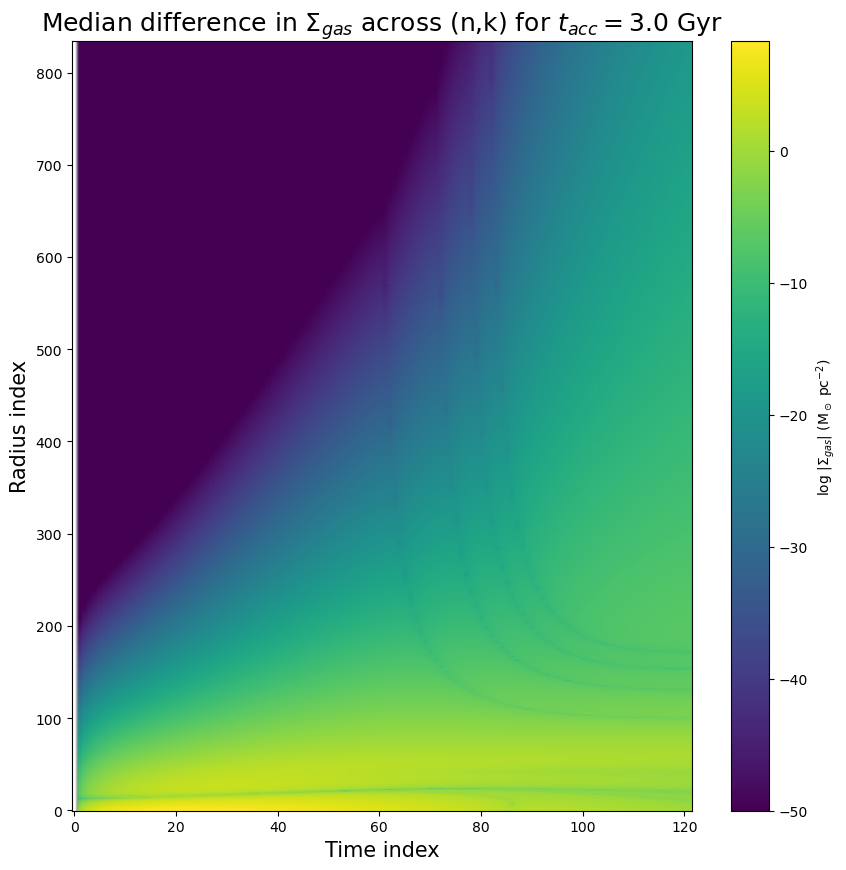

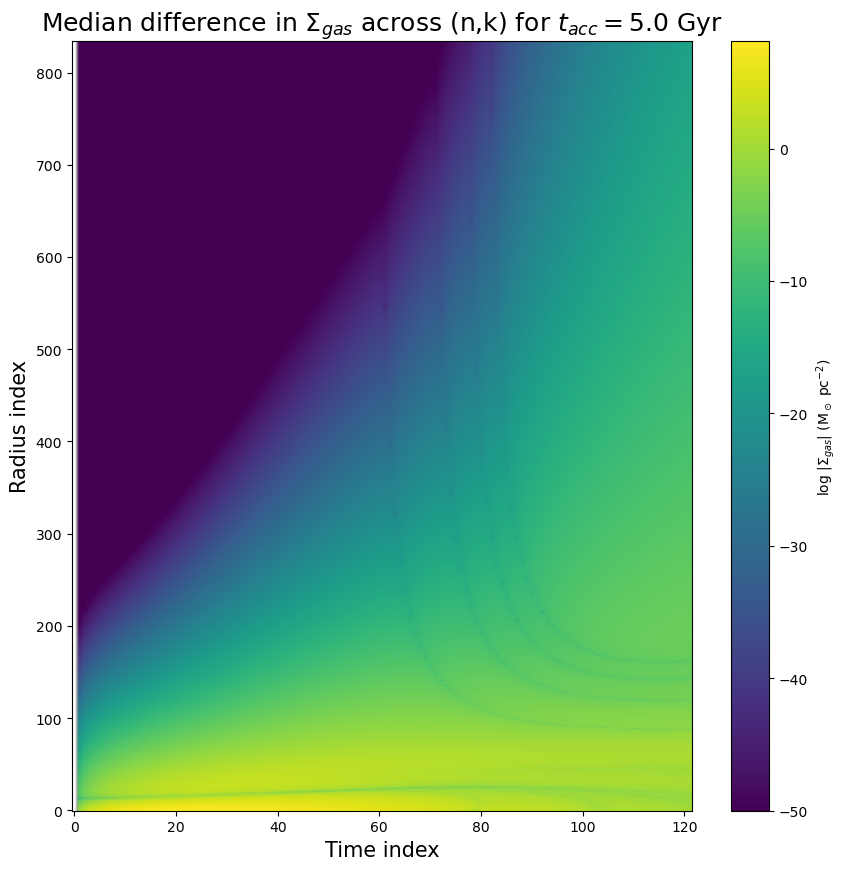

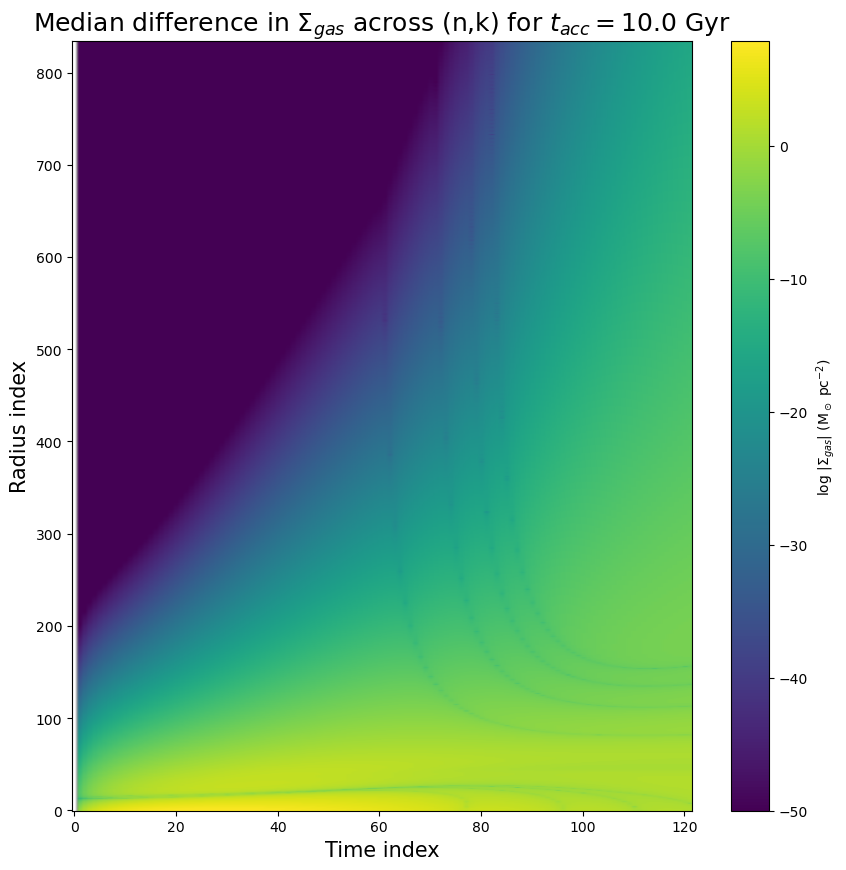

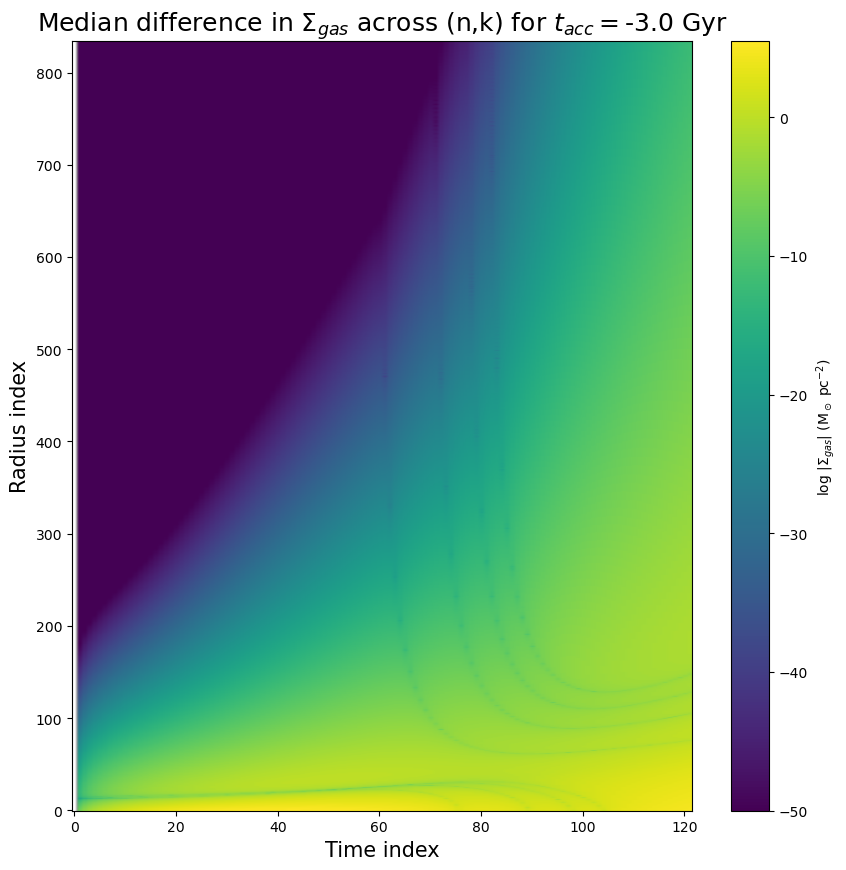

Execution time: 24.3230 seconds


In [29]:
# in a grid of (n,k) and omega_acc values, compute Sigma_gas for each combination, plot difference in log scale in a mosaic
# then for each omega_acc, take median across (n,k) and sum all them images to get overall difference as a function of omega_acc
# then build a gif with those overall difference images

#keep n and k equal so the grid is 2D with omega_acc
n_k_values = [0.5, 1.0, 1.5, 2.0]
t_acc_values = [3., 5., 10., -3.]

# the difference is not between the numpy and JAX versions, but between different (n,k) combinations
for t_acc_val in t_acc_values:
    diff_images = []
    for n_k in n_k_values:
        Sigma_gas_jax = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(3., 3.), dtype=jnp.float64), logM_grid_jax)
        Sigma_gas_ref = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(n_k, n_k), dtype=jnp.float64), logM_grid_jax)
        
        diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))
        diff_images.append(diff_image)
    
    #median_diff_image = np.median(np.array(diff_images), axis=0)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.sum(diff_images, axis=0), aspect='auto', origin='lower', cmap='viridis', vmin=-50)
    fig.colorbar(im, ax=frame, label=r"log $|\Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Median difference in $\Sigma_{gas}$ across (n,k) for $t_{acc}=$"+f"{t_acc_val} Gyr", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    show()
    #fig.savefig(f'../outputs/graphs10_JAX_aKSL/Median_diff_Sigma_gas_tacc_{t_acc_val}_{np.log10(M_bar_t0)}.png')

/tmp/ipykernel_894500/1857554652.py:8: RuntimeWarning: divide by zero encountered in log10
  diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))


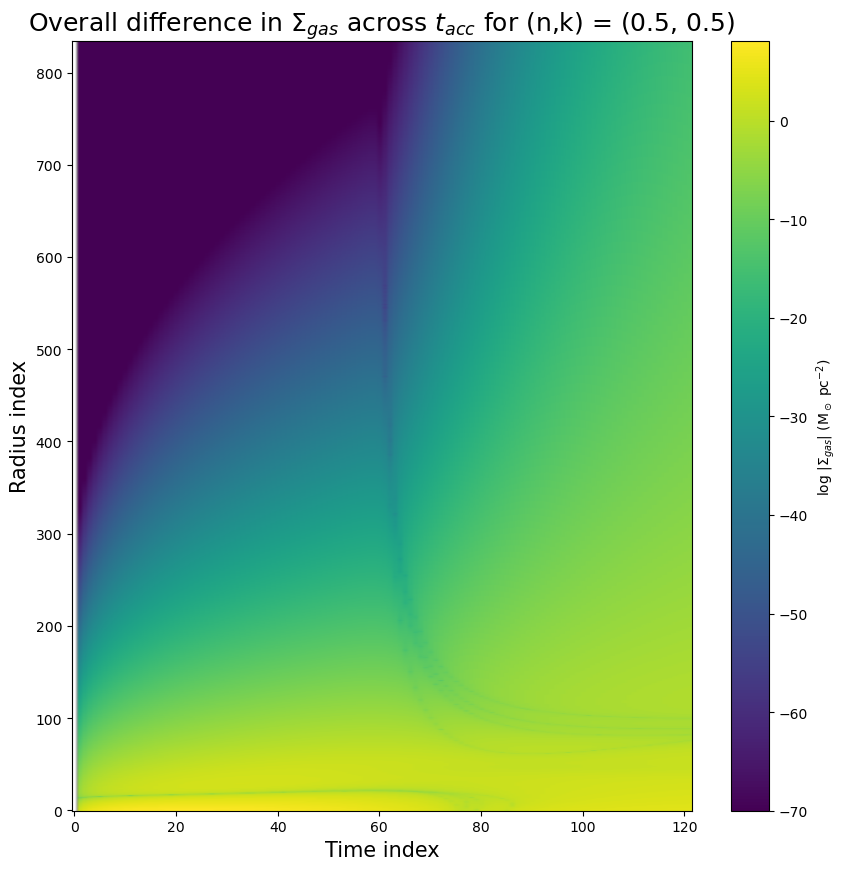

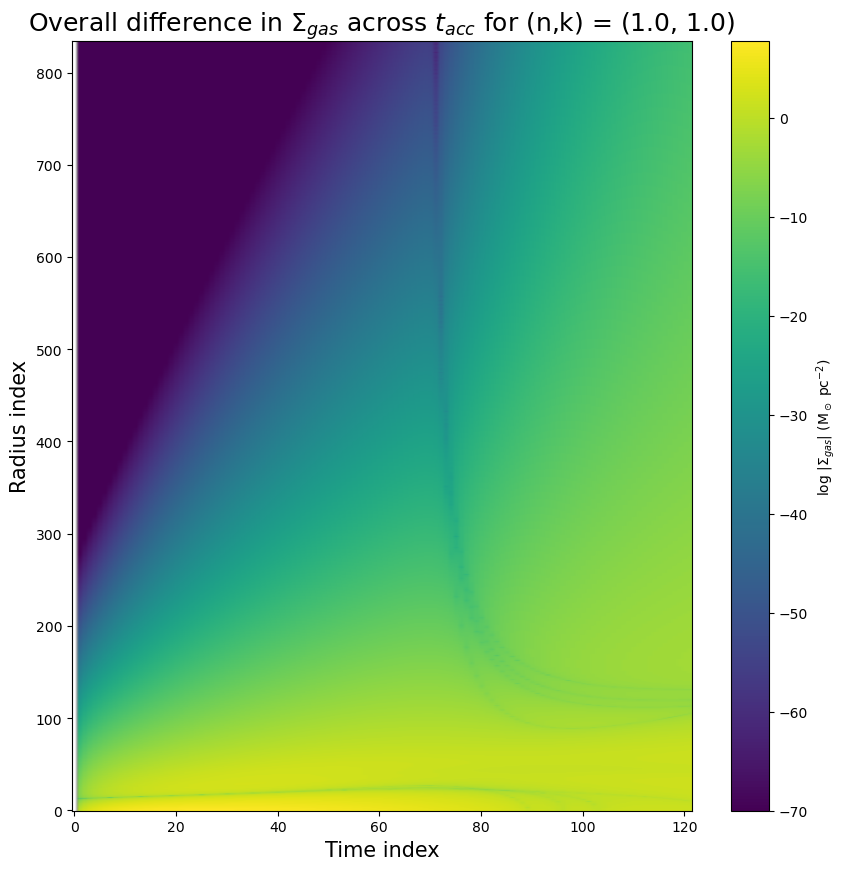

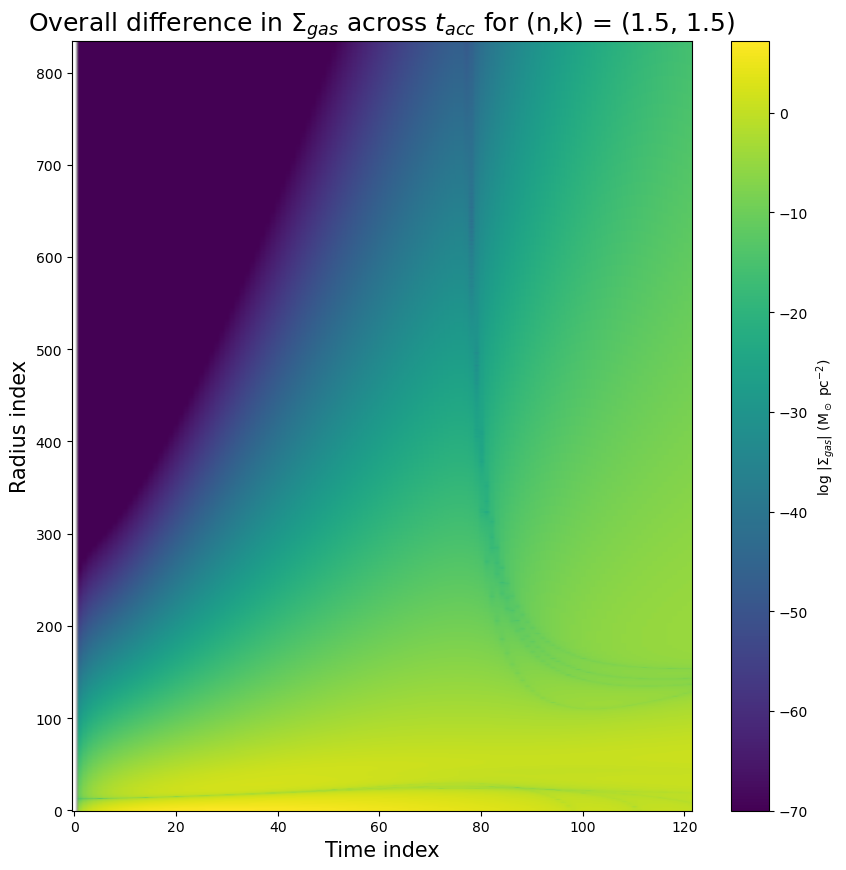

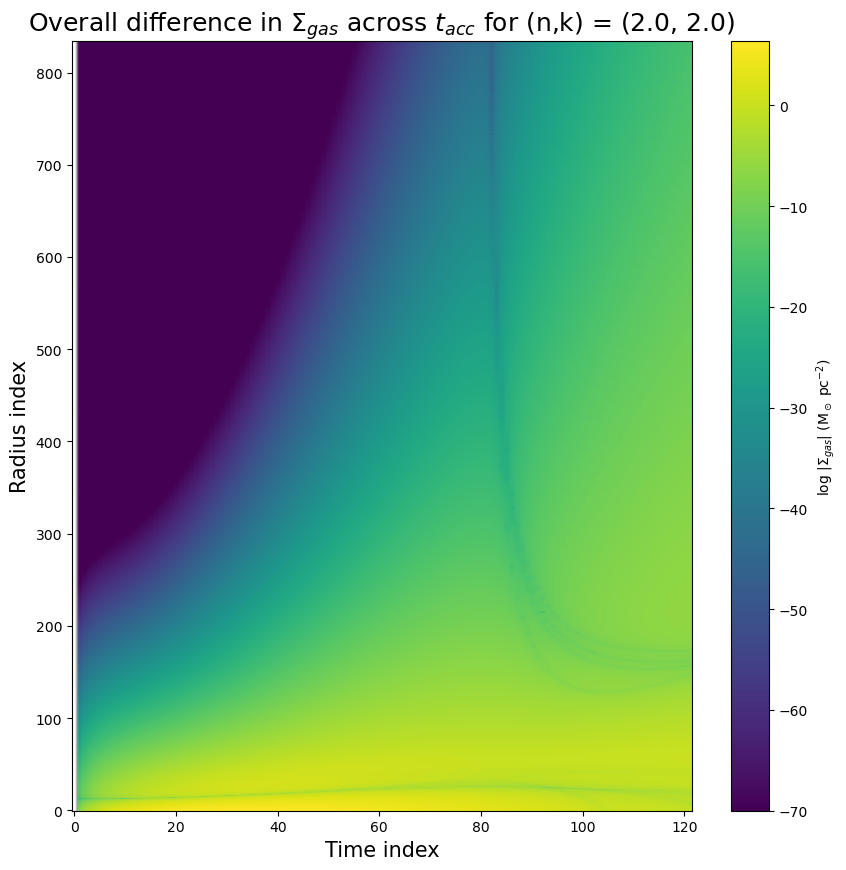

Execution time: 24.3652 seconds


In [30]:
# now do the same but by summing over t_acc instead of (n,k) and get overall difference as a function of (n,k)
for n_k in n_k_values:
    diff_images = []
    for t_acc_val in t_acc_values:
        Sigma_gas_jax = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(3., 3.), dtype=jnp.float64), logM_grid_jax)
        Sigma_gas_ref = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(n_k, n_k), dtype=jnp.float64), logM_grid_jax)
        
        diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))
        diff_images.append(diff_image)
    
    #median_diff_image = np.median(np.array(diff_images), axis=0)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.sum(diff_images, axis=0), aspect='auto', origin='lower', cmap='viridis', vmin=-70)
    fig.colorbar(im, ax=frame, label=r"log $|\Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Overall difference in $\Sigma_{gas}$ across $t_{acc}$ for (n,k) = "+f"({n_k}, {n_k})", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    show()
    #fig.savefig(f'../outputs/graphs10_JAX_aKSL/Overall_diff_Sigma_gas_nk_{n_k}_{np.log10(M_bar_t0)}.png')

# print minimum and index of Sigma_gas_cutoff_ksl1

print("min Sigma_gas:", Sigma_gas_cutoff_ksl1.min())
print("min Sigma_gas where Sigma < 0:", Sigma_gas_cutoff_ksl1[Sigma_gas_cutoff_ksl1 < 0].min())
print("number of negative entries:", np.sum(Sigma_gas_cutoff_ksl1 < 0))

### $log(\dot{\Sigma}_{acc})$ vs r for different t and $t_{acc}$

In [31]:
def Sigma_acc_def(R, t, t_acc, M_bar):
    """
    Defines Sigma_acc rate (dotted), the accretion rate surface density, as a function of r and t
    
    Inputs:
    R(np.array): Radius array
    t(np.array): Time array
    t_acc(float): Accretion timescale value
    M_bar(float): Total baryonic mass value
    
    Returns:
    Sigma_acc_dot(np.array): 2D array of the accretion rate SD, with t in the x-axis and r in the y-axis
    """
    C = M_bar/(t_acc*(1-np.exp(-12./t_acc)))
    jmax = (M_bar**0.73)*10**(-4.25)
    r_acc = np.zeros(len(t))
    for j,ti in enumerate(t):
        r_acc[j] = 1000*r_btfr_def(M_bar, j_acc_def(jmax, ti))
    Sigma_acc_dot = np.zeros((len(R),len(t)))
    for i,r_value in enumerate(R):
        Sigma_acc_dot[i,:] = ((C)/(2*np.pi*r_acc**2))*np.exp((-t)/(t_acc))*np.exp((-r_value)/(r_acc))
    return Sigma_acc_dot

M_sigma_acc_dot1 = Sigma_acc_def(r, M_times1, t_acc[0], M_bar_t0)
M_sigma_acc_dot2 = Sigma_acc_def(r, M_times1, t_acc[1], M_bar_t0)
M_sigma_acc_dot3 = Sigma_acc_def(r, M_times1, t_acc[2], M_bar_t0)
index_t1 = np.argwhere(M_times1 == find_nearest(M_times1, 3.))[0][0]
index_t2 = np.argwhere(M_times1 == find_nearest(M_times1, 6.))[0][0]
index_t3 = np.argwhere(M_times1 == find_nearest(M_times1, 9.))[0][0]
index_t4 = np.argwhere(M_times1 == find_nearest(M_times1, 12.))[0][0]
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc1_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot1)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc2_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot2)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc3_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot3)
print(M_sigma_acc_dot1)

[[9.05091191e+02 7.95810964e+02 7.03646408e+02 ... 4.51565342e-01
  4.30622595e-01 4.10690143e-01]
 [7.70268793e+02 6.82371452e+02 6.07430210e+02 ... 4.39896258e-01
  4.19572164e-01 4.00224088e-01]
 [6.55529541e+02 5.85102267e+02 5.24370559e+02 ... 4.28528721e-01
  4.08805304e-01 3.90024750e-01]
 ...
 [4.73220074e-56 2.14933777e-53 5.21705705e-51 ... 1.56531933e-10
  1.74058538e-10 1.93159222e-10]
 [4.02729205e-56 1.84295870e-53 4.50367972e-51 ... 1.52486928e-10
  1.69591931e-10 1.88236740e-10]
 [3.42738656e-56 1.58025267e-53 3.88784919e-51 ... 1.48546451e-10
  1.65239944e-10 1.83439702e-10]]
Execution time: 0.3454 seconds


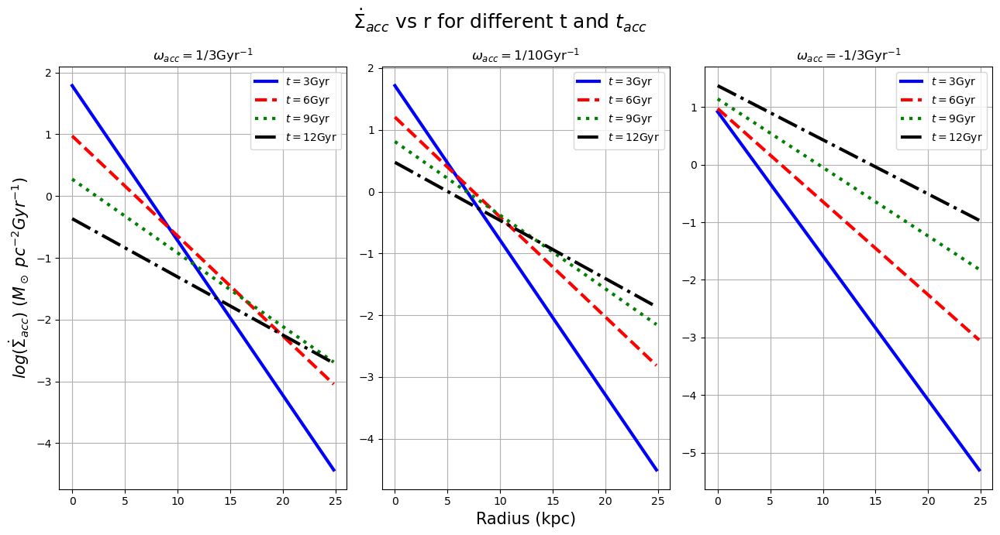

Execution time: 1.0362 seconds


In [32]:
M_sigma_accs = np.array([M_sigma_acc_dot1, M_sigma_acc_dot2, M_sigma_acc_dot3])

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\dot{\Sigma}_{acc}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\dot{\Sigma}_{acc})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sigma_accs, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/dotSigma_acc vs r (t_acc variation, k={ki}).png')

### $\tau_\mathrm{dep}$ and $\tau_\mathrm{sup}$

In [33]:
# Compute SFRs for cutoff_ksl without altering SFL: evaluate per-galaxy and per-radius elementwise
# Compute SFR surface density for cutoff_ksl in a vectorized way (handles array sigma)
def sfl_cutoff_array(sigma):
    Rf = 0.3
    sigma = np.asarray(sigma, dtype=float)

    # enforce physical domain for SFR: if Σ<=0, SFR=0
    sigma_pos = np.where(sigma > 0.0, sigma, 0.0)

    low_reg = (1 - Rf)*1.58e-3*(sigma_pos**3.26)
    high_reg = (1 - Rf)*6.68e-2*(sigma_pos**1.54)

    with np.errstate(divide='ignore', invalid='ignore'):
        log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

    mask = log_sigma < 1.0
    sfr = np.where(mask, low_reg, high_reg)

    sfr[~np.isfinite(sfr)] = 0.0
    return sfr

# define functions for supply and depletion timescales

def t_supply(Sigma_gas, r, t_acc, M_bar):
    """Returns the supply timescale, defined as the ratio of the gas surface density to the accretion rate surface density."""
    Sigma_acc = Sigma_acc_def(r, M_times1, t_acc, M_bar)
    t_supply_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]): #loop over radius
        for j in range(Sigma_gas.shape[1]): #loop over time
            if Sigma_acc[i,j] > 0:
                t_supply_matrix[i,j] = Sigma_gas[i,j]/Sigma_acc[i,j]
            else:
                t_supply_matrix[i,j] = np.inf
    return t_supply_matrix

def t_depletion(Sigma_gas, r, t_acc, M_bar, sfl_type="cutoff_ksl"):
    """Returns the depletion timescale, defined as the ratio of the gas surface density to the star formation rate surface density."""
    if sfl_type == "cutoff_ksl":
        Sigma_sfr = sfl_cutoff_array(Sigma_gas)
    else:
        Sigma_sfr = SFL(Sigma_gas, sfl_type, r[:, np.newaxis], M_bar)
    t_depletion_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]):
        for j in range(Sigma_gas.shape[1]):
            if Sigma_sfr[i,j] > 0:
                t_depletion_matrix[i,j] = Sigma_gas[i,j]/Sigma_sfr[i,j]
            else:
                t_depletion_matrix[i,j] = np.inf
    return t_depletion_matrix


Execution time: 0.0028 seconds


### $log(\Sigma_{gas})$ vs r for different t and $t_{acc}$

warnings.filterwarnings('ignore')

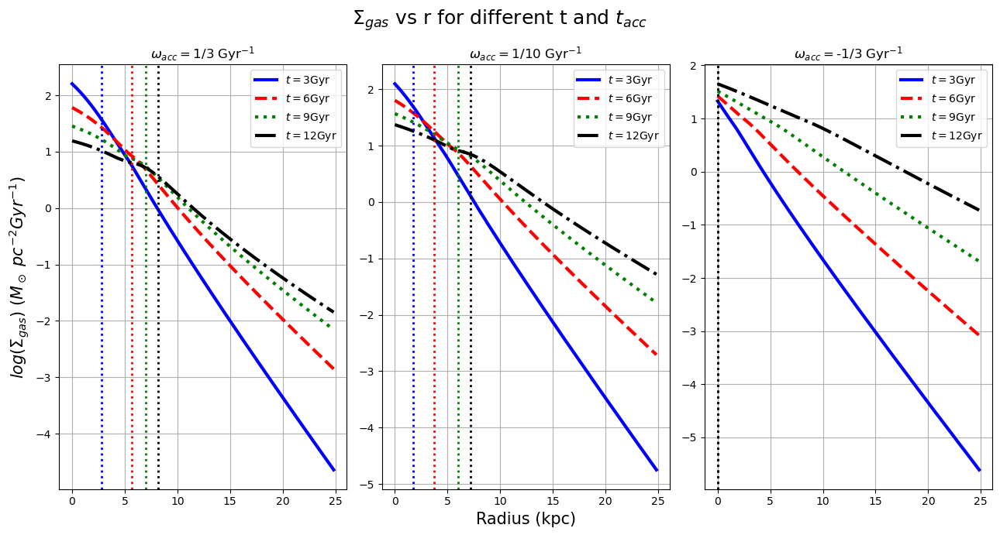

Execution time: 1.2009 seconds


In [34]:
Sigma_gas_cutoff_ksl = np.array([Sigma_gas_cutoff_ksl1, Sigma_gas_cutoff_ksl2, Sigma_gas_cutoff_ksl3])

#find radius where t_dep = t_sup for each t_acc and time
r_eq_list = []
for i, t_accr in enumerate(t_acc):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

    r_eq = np.full(t_sup.shape[1], 0) # 0 = no crossing at that time
    for j in range(t_sup.shape[1]):
        D = (t_sup[:, j] - t_dep[:, j]).astype(float)
        mask = np.isfinite(D) & np.isfinite(r)
        rr, DD = r[mask], D[mask]

        sign = np.sign(DD)
        cross_idx = np.where(np.diff(sign) != 0)[0] # indices k where DD[k]*DD[k+1] < 0
        if cross_idx.size:
            k = cross_idx[0]
            r0, r1 = rr[k], rr[k+1]
            y0, y1 = DD[k], DD[k+1]
            # linear interpolation to Delta=0
            r_eq[j] = r0 - y0 * (r1 - r0) / (y1 - y0)
        else:
            r_eq[j] = 0  # no supply-limited/KS transition at this time

    r_eq_list.append(r_eq)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].axvline(x=r_eq_list[i][index_t1]/1000, color='blue', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t2]/1000, color='red', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t3]/1000, color='green', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t4]/1000, color='black', linestyle=':', lw=2)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))} Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_gas_cutoff_ksl vs r (t_acc variation, k={ki}).png')

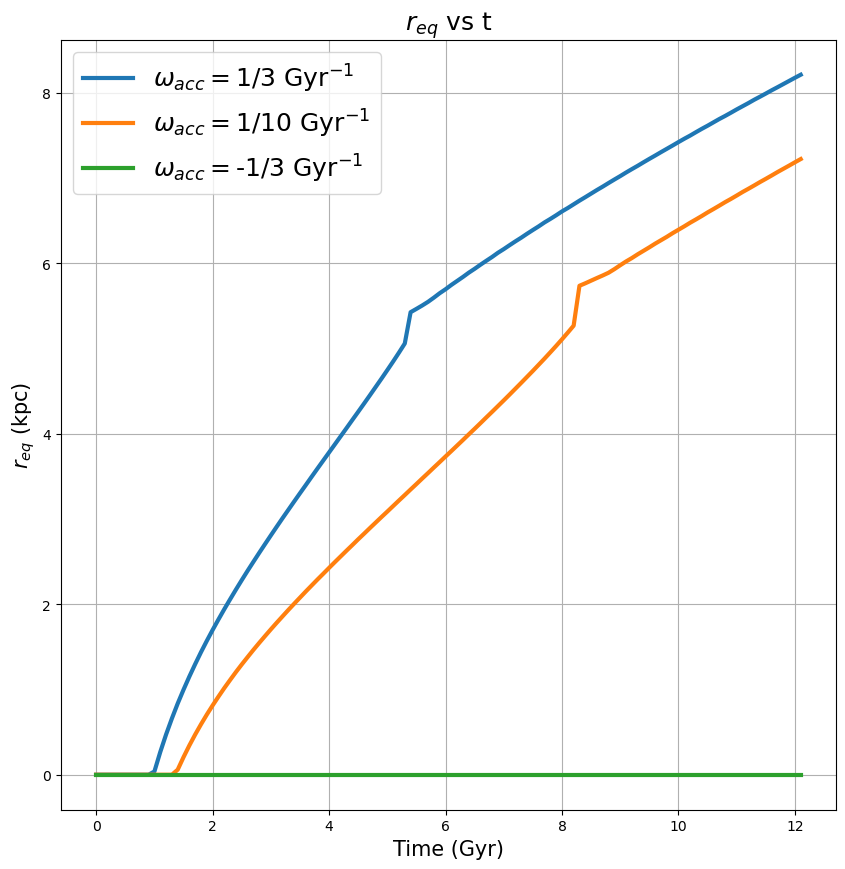

Execution time: 0.3105 seconds


In [35]:
# plot r_eq vs time for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, r_eq, t_accr in zip(range(3), r_eq_list, t_acc):
    frame.plot(M_times1, r_eq/1000, label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", lw=3)
frame.set_title(r"$r_{eq}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{eq}$ (kpc)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/r_eq vs time (t_acc variation, k={ki}).png')

/tmp/ipykernel_894500/3749383311.py:7: RuntimeWarning: divide by zero encountered in log10
  frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)


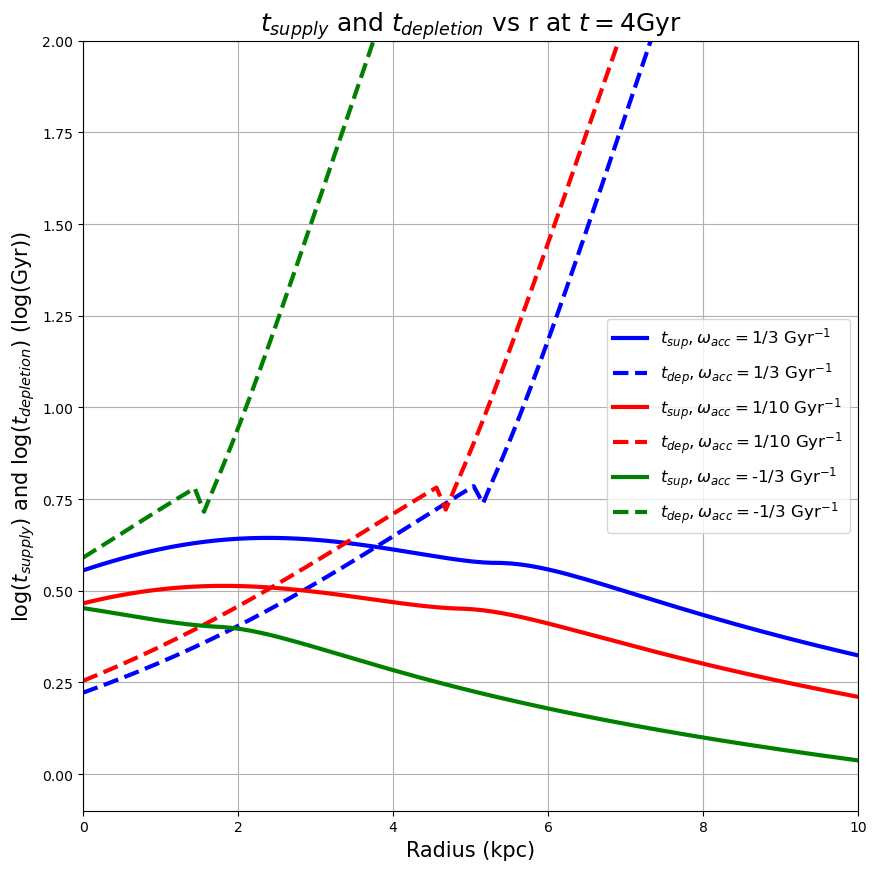

Execution time: 0.8866 seconds


In [36]:
# plot t_supply and t_depletion for cutoff_ksl at t=12Gyr for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")
    frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
    frame.plot(r[:index_r1]/1000, np.log10(t_dep)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{dep}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='dashed', lw=3)
frame.set_title(r"$t_{supply}$ and $t_{depletion}$ vs r at $t=4$Gyr", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$\log(t_{supply})$ and $\log(t_{depletion})$ (log(Gyr))", fontsize = 15)
frame.set_xlim(0, 10)
frame.set_ylim(-0.1, 2)
frame.legend(prop={'size': 12})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/t_supply and t_depletion vs r at t=4Gyr (t_acc variation, k={ki}).png')

In [ ]:
# ==== precompute full t_sup and t_dep grids for all t ====

# Sigma_gas_cutoff_ksl has shape (3, Nr, Nt) for the three t_acc values
n_acc, n_r, n_t = Sigma_gas_cutoff_ksl.shape

t_sup_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)
t_dep_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)

for i, t_accr in enumerate(t_acc):
    t_sup_all[i] = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep_all[i] = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

# choose how many radii and times to show
r_kpc = r[:index_r1]/1000.0
time_indices = np.arange(n_t)   # or e.g. np.arange(0, n_t, 2) to skip every other step

# precompute log10 safely (avoid warnings on inf)
with np.errstate(divide="ignore", invalid="ignore"):
    log_t_sup_all = np.log10(t_sup_all)
    log_t_dep_all = np.log10(t_dep_all)

Execution time: 0.7051 seconds


In [ ]:
fig = figure(figsize=(10, 10), dpi=150, facecolor='w')
ax = fig.add_subplot(1,1,1)

# set up lines: one solid + one dashed per t_acc
sup_lines = []
dep_lines = []
for col, sty in zip(colors, styles):
    (l_sup,) = ax.plot([], [], color=col, linestyle='solid', lw=3)
    (l_dep,) = ax.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines.append(l_sup)
    dep_lines.append(l_dep)

# axis labels etc.
ax.set_xlabel("Radius (kpc)", fontsize=15)
ax.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax.set_xlim(0, r_kpc[-1])
ax.set_ylim(-0.1, 12.1)
ax.grid()

# legend (static; only labels once)
labels = []
for t_accr, col in zip(t_acc, colors):
    labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
ax.legend(sup_lines + dep_lines, labels, prop={'size': 9})

# time annotation in the corner
time_text = ax.text(0.02, 0.95, "", transform=ax.transAxes, fontsize=14)

def init():
    for l_sup, l_dep in zip(sup_lines, dep_lines):
        l_sup.set_data([], [])
        l_dep.set_data([], [])
    time_text.set_text("")
    return sup_lines + dep_lines + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i, (l_sup, l_dep) in enumerate(zip(sup_lines, dep_lines)):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]
        l_sup.set_data(r_kpc, y_sup)
        l_dep.set_data(r_kpc, y_dep)

    time_text.set_text(f"t = {t_now:.1f} Gyr")
    return sup_lines + dep_lines + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

# save as GIF (needs pillow installed)
gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved GIF to:", gif_path)

Saved GIF to: ../outputs/graphs9_alternative_KSL/t_supply_t_depletion_evolution.gif
Execution time: 60.0491 seconds


In [ ]:
time_indices = np.arange(n_t)  # or e.g. np.arange(0, n_t, 2)

# global y-limits for the left panel
with np.errstate(invalid="ignore"):
    y_full_min = np.nanmin(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))
    y_full_max = np.nanmax(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))

# zoom limits for the right panel (tweak these)
x_zoom_min, x_zoom_max = -0.05, 10.0   # kpc
y_zoom_min, y_zoom_max = -0.1, 2.0   # log(Gyr)

fig, (ax_full, ax_zoom) = plt.subplots(
    1, 2, figsize=(14, 6), dpi=150, facecolor='w', sharey=False
)

fig.suptitle(r"Animation of $t_{supply}$ and $t_{depletion}$ vs $r$ at different $t$",
             fontsize=18, y=0.98)

# ---------- set up lines ----------
sup_lines_full, dep_lines_full = [], []
sup_lines_zoom, dep_lines_zoom = [], []

for col, sty in zip(colors, styles):
    # full panel
    (lf_sup,) = ax_full.plot([], [], color=col, linestyle='solid', lw=3)
    (lf_dep,) = ax_full.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_full.append(lf_sup)
    dep_lines_full.append(lf_dep)

    # zoom panel
    (lz_sup,) = ax_zoom.plot([], [], color=col, linestyle='solid', lw=3)
    (lz_dep,) = ax_zoom.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_zoom.append(lz_sup)
    dep_lines_zoom.append(lz_dep)

# ---------- formatting ----------
ax_full.set_title(r"Full view", fontsize=16)
ax_full.set_xlabel("Radius (kpc)", fontsize=15)
ax_full.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax_full.set_xlim(r_kpc[0], r_kpc[-1])
ax_full.set_ylim(-0.1, 12.1)
ax_full.grid()

ax_zoom.set_title(r"Zoomed view", fontsize=16)
ax_zoom.set_xlabel("Radius (kpc)", fontsize=15)
ax_zoom.set_xlim(x_zoom_min, x_zoom_max)
ax_zoom.set_ylim(y_zoom_min, y_zoom_max)
ax_zoom.grid()

# legend only on the full panel
legend_lines = []
legend_labels = []
for t_accr, col in zip(t_acc, colors):
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='solid', lw=3))
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='dashed', lw=3))
    legend_labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    legend_labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")

ax_full.legend(legend_lines, legend_labels, prop={'size': 9}, loc='upper right')

# time annotation at top center
time_text = ax_full.text(
    0.15, 0.91, "",
    transform=ax_full.transAxes,
    ha="center", va="bottom",
    fontsize=16
)

def init():
    for l in (sup_lines_full + dep_lines_full +
              sup_lines_zoom + dep_lines_zoom):
        l.set_data([], [])
    time_text.set_text("")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i in range(n_acc):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]

        # full panel
        sup_lines_full[i].set_data(r_kpc, y_sup)
        dep_lines_full[i].set_data(r_kpc, y_dep)

        # zoom panel (same data, different axes limits)
        sup_lines_zoom[i].set_data(r_kpc, y_sup)
        dep_lines_zoom[i].set_data(r_kpc, y_dep)

    time_text.set_text(rf"$t = {t_now:.1f}\,{{\rm Gyr}}$")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution_dual_with_zoom.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved dual-panel GIF to:", gif_path)

Saved dual-panel GIF to: ../outputs/graphs9_alternative_KSL/t_supply_t_depletion_evolution_dual_with_zoom.gif
Execution time: 66.4718 seconds


### $log(\Sigma_{SFR})$ vs r for different t and $t_{acc}$

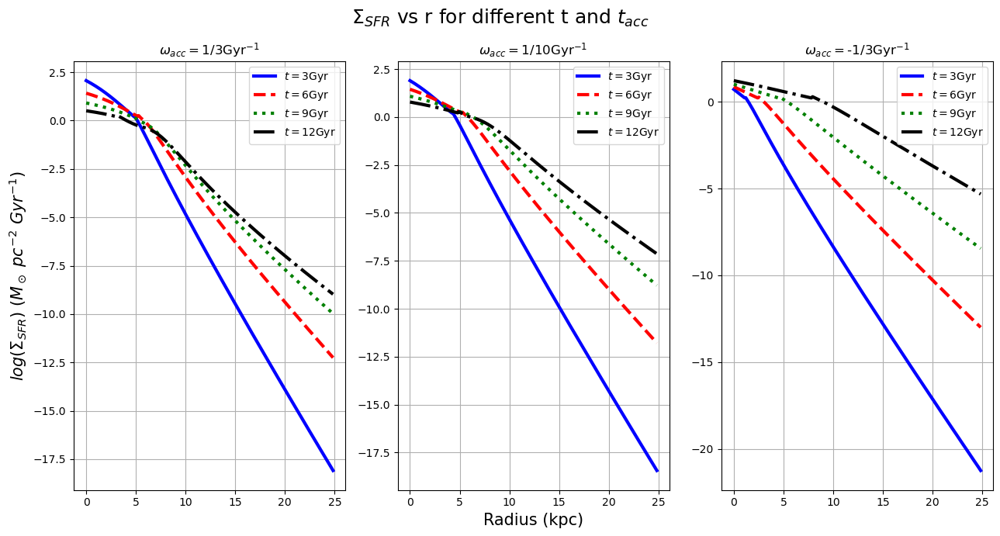

Execution time: 1.1324 seconds


In [37]:
M_sfrs_cutoff_ksl1 = sfl_cutoff_array(Sigma_gas_cutoff_ksl1)
M_sfrs_cutoff_ksl2 = sfl_cutoff_array(Sigma_gas_cutoff_ksl2)
M_sfrs_cutoff_ksl3 = sfl_cutoff_array(Sigma_gas_cutoff_ksl3)
M_sfrs_cutoff_ksl = np.array([M_sfrs_cutoff_ksl1, M_sfrs_cutoff_ksl2, M_sfrs_cutoff_ksl3])

np.savetxt('../data/data9_JAX_aKSL/M_sfr1_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/M_sfr2_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/M_sfr3_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7), facecolor='w')

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{SFR}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{SFR})$ $(M_\odot\ pc^{-2}\ Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sfrs_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()

# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_sfr vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{\star})$ vs r for different t and $t_{acc}$

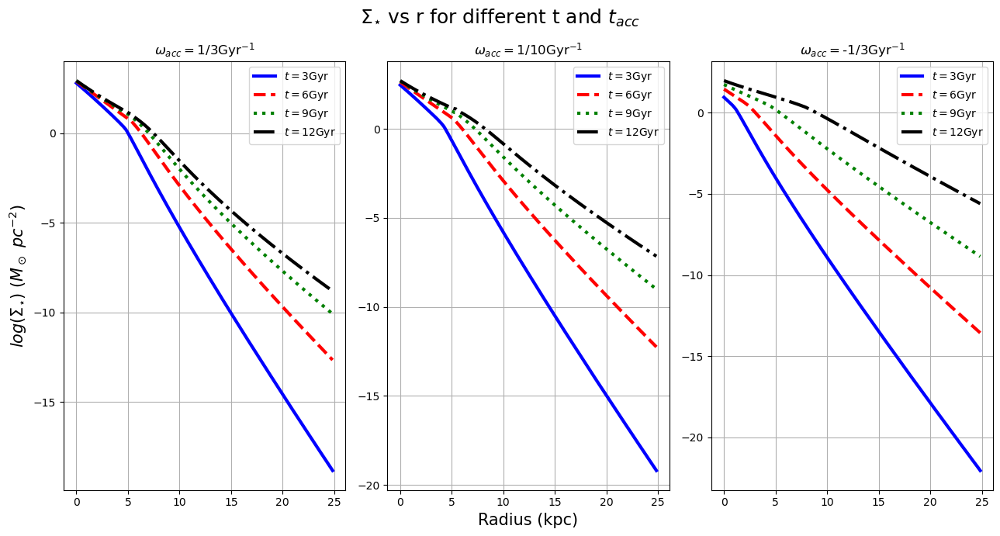

Execution time: 1.0374 seconds


In [38]:
# #if SFL_type == "old_ksl":
# Sigma_star_old_ksl1 = dt*np.cumsum(M_sfrs[0], axis=1)
# Sigma_star_old_ksl2 = dt*np.cumsum(M_sfrs[1], axis=1)
# Sigma_star_old_ksl3 = dt*np.cumsum(M_sfrs[2], axis=1)
# #elif SFL_type == "new_ksl":
# Sigma_star_new_ksl1 = dt*np.cumsum(M_sfrs_ksl[0], axis=1)
# Sigma_star_new_ksl2 = dt*np.cumsum(M_sfrs_ksl[1], axis=1)
# Sigma_star_new_ksl3 = dt*np.cumsum(M_sfrs_ksl[2], axis=1)
# #elif SFL_type == "boissier":
# Sigma_star_boissier1 = dt*np.cumsum(M_sfrs_boissier[0], axis=1)
# Sigma_star_boissier2 = dt*np.cumsum(M_sfrs_boissier[1], axis=1)
# Sigma_star_boissier3 = dt*np.cumsum(M_sfrs_boissier[2], axis=1)

# Sigma_stars_old_ksl = np.array([Sigma_star_old_ksl1, Sigma_star_old_ksl2, Sigma_star_old_ksl3])
# Sigma_stars_new_ksl = np.array([Sigma_star_new_ksl1, Sigma_star_new_ksl2, Sigma_star_new_ksl3])
# Sigma_stars_boissier = np.array([Sigma_star_boissier1, Sigma_star_boissier2, Sigma_star_boissier3])
# np.savetxt('../data7/M_star1_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl1)
# np.savetxt('../data7/M_star2_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl2)
# np.savetxt('../data7/M_star3_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl3)

# np.savetxt(f'../data7/M_star1_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl1)
# np.savetxt(f'../data7/M_star2_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl2)
# np.savetxt(f'../data7/M_star3_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl3)

# np.savetxt(f'../data7/M_star1_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier1)
# np.savetxt(f'../data7/M_star2_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier2)
# np.savetxt(f'../data7/M_star3_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier3)

Sigma_star_cutoff_ksl1 = dt*np.cumsum(M_sfrs_cutoff_ksl[0], axis=1)
Sigma_star_cutoff_ksl2 = dt*np.cumsum(M_sfrs_cutoff_ksl[1], axis=1)
Sigma_star_cutoff_ksl3 = dt*np.cumsum(M_sfrs_cutoff_ksl[2], axis=1)
Sigma_stars_cutoff_ksl = np.array([Sigma_star_cutoff_ksl1, Sigma_star_cutoff_ksl2, Sigma_star_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_star1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_star2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_star3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{\star}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_stars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_star vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{bar})$ vs r for different t and $t_{acc}$

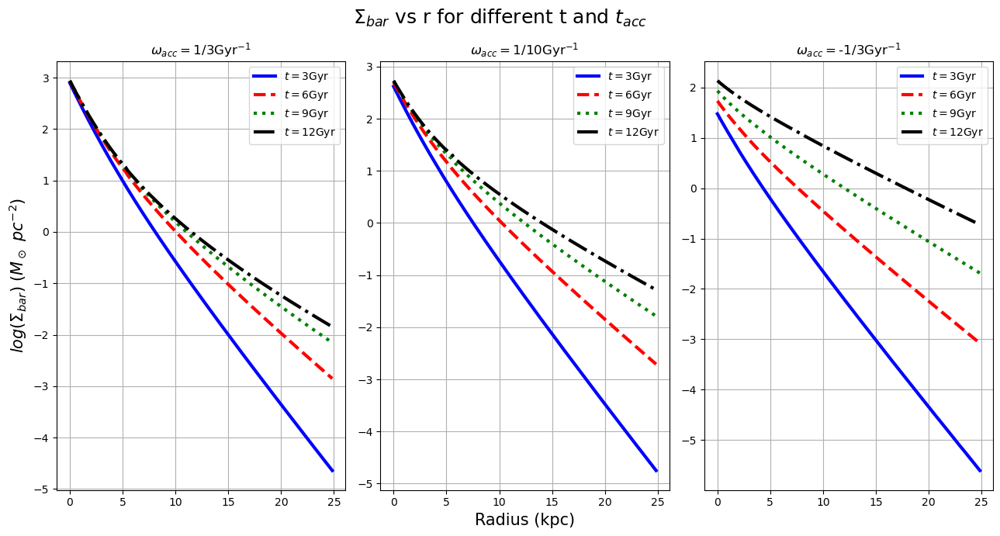

Execution time: 7.8409 seconds


In [39]:
# #if SFL_type == "old_ksl":
# Sigma_bar_old_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl1.ravel(), Sigma_star_old_ksl1.ravel())]).reshape(Sigma_gas_old_ksl1.shape)
# Sigma_bar_old_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl2.ravel(), Sigma_star_old_ksl2.ravel())]).reshape(Sigma_gas_old_ksl2.shape)
# Sigma_bar_old_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl3.ravel(), Sigma_star_old_ksl3.ravel())]).reshape(Sigma_gas_old_ksl3.shape)
# #elif SFL_type == "new_ksl":
# Sigma_bar_new_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl1.ravel(), Sigma_star_new_ksl1.ravel())]).reshape(Sigma_gas_new_ksl1.shape)
# Sigma_bar_new_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl2.ravel(), Sigma_star_new_ksl2.ravel())]).reshape(Sigma_gas_new_ksl2.shape)
# Sigma_bar_new_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl3.ravel(), Sigma_star_new_ksl3.ravel())]).reshape(Sigma_gas_new_ksl3.shape)
# #elif SFL_type == "boissier":
# Sigma_bar_boissier1 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier1.ravel(), Sigma_star_boissier1.ravel())]).reshape(Sigma_gas_boissier1.shape)
# Sigma_bar_boissier2 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier2.ravel(), Sigma_star_boissier2.ravel())]).reshape(Sigma_gas_boissier2.shape)
# Sigma_bar_boissier3 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier3.ravel(), Sigma_star_boissier3.ravel())]).reshape(Sigma_gas_boissier3.shape)

# Sigma_bars_old_ksl = np.array([Sigma_bar_old_ksl1, Sigma_bar_old_ksl2, Sigma_bar_old_ksl3])
# Sigma_bars_new_ksl = np.array([Sigma_bar_new_ksl1, Sigma_bar_new_ksl2, Sigma_bar_new_ksl3])
# Sigma_bars_boissier = np.array([Sigma_bar_boissier1, Sigma_bar_boissier2, Sigma_bar_boissier3])

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl3)

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl3)

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier3)

Sigma_bar_cutoff_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl1.ravel(), Sigma_star_cutoff_ksl1.ravel())]).reshape(Sigma_gas_cutoff_ksl1.shape)
Sigma_bar_cutoff_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl2.ravel(), Sigma_star_cutoff_ksl2.ravel())]).reshape(Sigma_gas_cutoff_ksl2.shape)
Sigma_bar_cutoff_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl3.ravel(), Sigma_star_cutoff_ksl3.ravel())]).reshape(Sigma_gas_cutoff_ksl3.shape)
Sigma_bars_cutoff_ksl = np.array([Sigma_bar_cutoff_ksl1, Sigma_bar_cutoff_ksl2, Sigma_bar_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_bar1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{bar}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{bar})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_bars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_bar vs r (t_acc variation, k={ki}).png')

In [40]:
NGC3198_HI = pd.read_table("../data/allHIprofs/NGC3198_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC3198_star = pd.read_table("../data/allSTARSprofs/NGC3198_fullstars_2.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC3198_HI['r[kpc]'] =  pd.to_numeric(NGC3198_HI['r[kpc]'], errors='coerce')
NGC3198_HI['vrot[km/s]'] =  pd.to_numeric(NGC3198_HI['vrot[km/s]'], errors='coerce')
NGC3198_HI['Sigma_HI[Msun/pc2]'] =  pd.to_numeric(NGC3198_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC3198_HI['jHI[kpckm/s]'] =  pd.to_numeric(NGC3198_HI['jHI[kpckm/s]'], errors='coerce')

NGC3198_star['r[kpc]'] =  pd.to_numeric(NGC3198_star['r[kpc]'], errors='coerce')
NGC3198_star['vrot[km/s]'] =  pd.to_numeric(NGC3198_star['vrot[km/s]'], errors='coerce')
NGC3198_star['Sigma_star[Msun/pc2]'] =  pd.to_numeric(NGC3198_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC3198_star['jstar[kpckm/s]'] =  pd.to_numeric(NGC3198_star['jstar[kpckm/s]'], errors='coerce')

NGC3198_r_obs_HI = NGC3198_HI['r[kpc]']
NGC3198_r_obs_star = NGC3198_star['r[kpc]']
NGC3198_v_obs = NGC3198_HI['vrot[km/s]']
NGC3198_Sigma_gas_obs = 1.4*NGC3198_HI['Sigma_HI[Msun/pc2]']
NGC3198_Sigma_star_obs = NGC3198_star['Sigma_star[Msun/pc2]']

NGC2403_HI = pd.read_table("../data/allHIprofs/NGC2403_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC2403_star = pd.read_table("../data/allSTARSprofs/NGC2403_fullstars.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC2403_HI['r[kpc]'] = pd.to_numeric(NGC2403_HI['r[kpc]'], errors='coerce')
NGC2403_HI['vrot[km/s]'] = pd.to_numeric(NGC2403_HI['vrot[km/s]'], errors='coerce')
NGC2403_HI['Sigma_HI[Msun/pc2]'] = pd.to_numeric(NGC2403_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC2403_HI['jHI[kpckm/s]'] = pd.to_numeric(NGC2403_HI['jHI[kpckm/s]'], errors='coerce')

NGC2403_star['r[kpc]'] = pd.to_numeric(NGC2403_star['r[kpc]'], errors='coerce')
NGC2403_star['vrot[km/s]'] = pd.to_numeric(NGC2403_star['vrot[km/s]'], errors='coerce')
NGC2403_star['Sigma_star[Msun/pc2]'] = pd.to_numeric(NGC2403_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC2403_star['jstar[kpckm/s]'] = pd.to_numeric(NGC2403_star['jstar[kpckm/s]'], errors='coerce')

NGC2403_r_obs_HI = NGC2403_HI['r[kpc]']
NGC2403_r_obs_star = NGC2403_star['r[kpc]']
NGC2403_v_obs = NGC2403_HI['vrot[km/s]']
NGC2403_Sigma_gas_obs = 1.4*NGC2403_HI['Sigma_HI[Msun/pc2]']
NGC2403_Sigma_star_obs = NGC2403_star['Sigma_star[Msun/pc2]']

Execution time: 0.0158 seconds


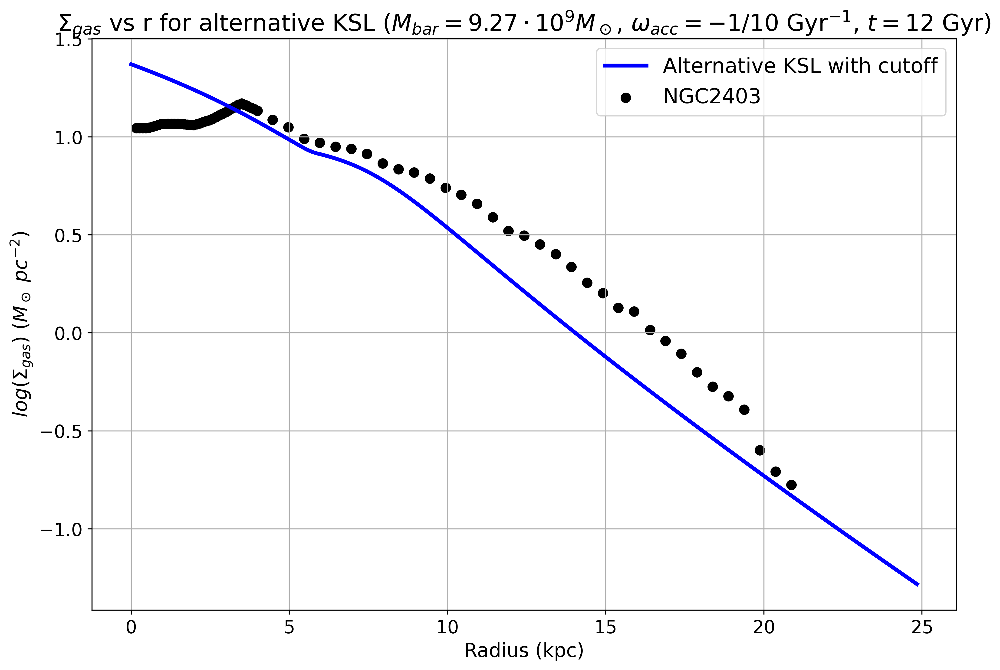

Execution time: 0.8467 seconds


In [41]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for alternative KSL ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

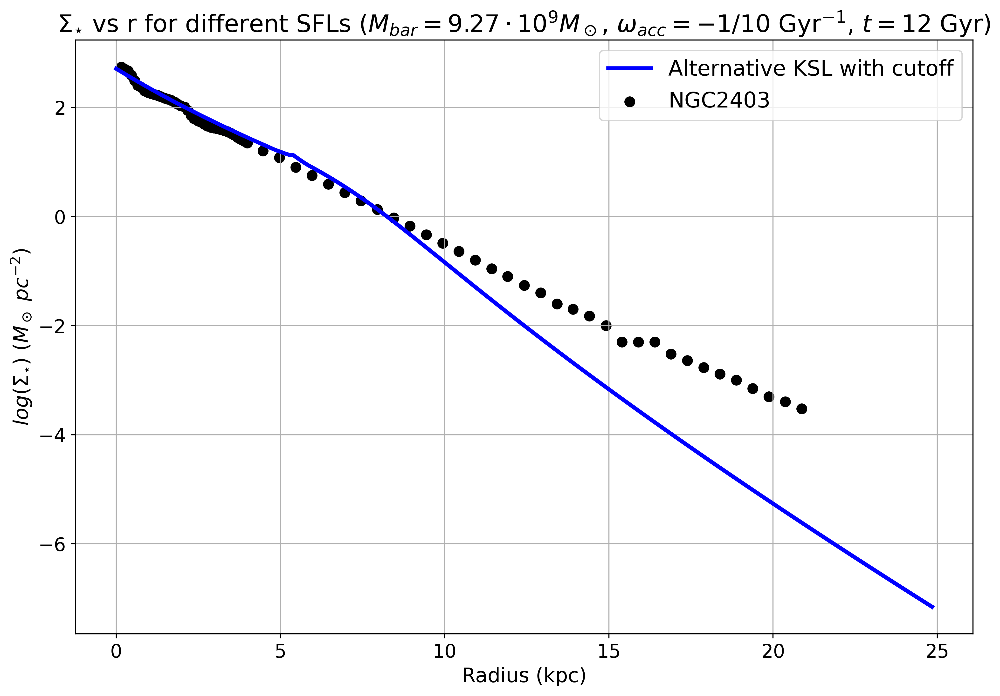

Execution time: 0.8011 seconds


In [42]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_stars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_star = np.array([Sigma_stars_old_ksl[1], Sigma_stars_new_ksl[1], Sigma_stars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_star, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

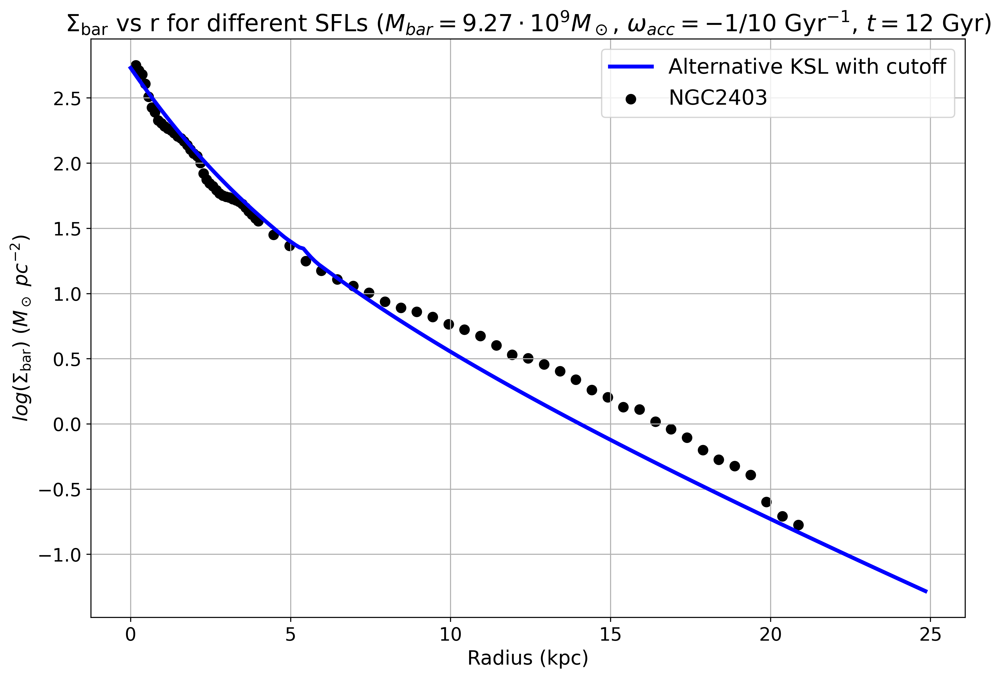

Execution time: 0.8450 seconds


In [43]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_bars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs+NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_bar = np.array([Sigma_bars_old_ksl[1], Sigma_bars_new_ksl[1], Sigma_bars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_bar, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs+NGC3198_Sigma_gas_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

warnings.filterwarnings('default')

## $f_{gas}$ vs r

/tmp/ipykernel_894500/3489038925.py:30: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
/tmp/ipykernel_894500/3489038925.py:31: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
/tmp/ipykernel_894500/3489038925.py:32: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)


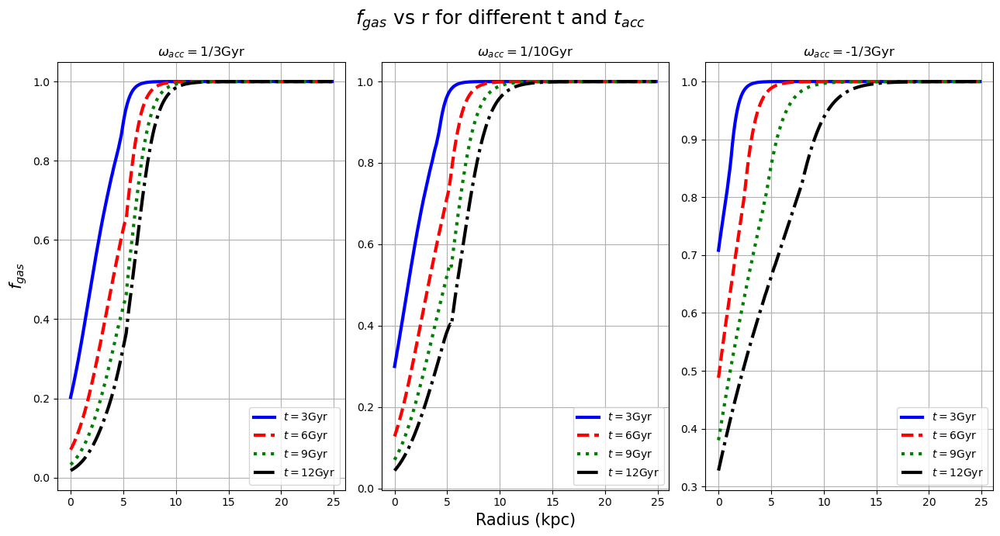

Execution time: 0.9782 seconds


In [44]:
# #if SFL_type == "old_ksl":
# f_gas_old_ksl1 = np.divide(Sigma_gas_old_ksl1, Sigma_bar_old_ksl1)
# f_gas_old_ksl2 = np.divide(Sigma_gas_old_ksl2, Sigma_bar_old_ksl2)
# f_gas_old_ksl3 = np.divide(Sigma_gas_old_ksl3, Sigma_bar_old_ksl3)
# #elif SFL_type == "new_ksl":
# f_gas_new_ksl1 = np.divide(Sigma_gas_new_ksl1, Sigma_bar_new_ksl1)
# f_gas_new_ksl2 = np.divide(Sigma_gas_new_ksl2, Sigma_bar_new_ksl2)
# f_gas_new_ksl3 = np.divide(Sigma_gas_new_ksl3, Sigma_bar_new_ksl3)
# #elif SFL_type == "boissier":
# f_gas_boissier1 = np.divide(Sigma_gas_boissier1, Sigma_bar_boissier1)
# f_gas_boissier2 = np.divide(Sigma_gas_boissier2, Sigma_bar_boissier2)
# f_gas_boissier3 = np.divide(Sigma_gas_boissier3, Sigma_bar_boissier3)

# f_gass_old_ksl = np.array([f_gas_old_ksl1, f_gas_old_ksl2, f_gas_old_ksl3])
# f_gass_new_ksl = np.array([f_gas_new_ksl1, f_gas_new_ksl2, f_gas_new_ksl3])
# f_gass_boissier = np.array([f_gas_boissier1, f_gas_boissier2, f_gas_boissier3])

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl3)

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl3)

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier3)

f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)
f_gas_cutoff_ksl = np.array([f_gas_cutoff_ksl1, f_gas_cutoff_ksl2, f_gas_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$f_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$f_{gas}$", fontsize = 15)

for i, f_gas, t_accr in zip(range(3), f_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t1][:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t2][:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t3][:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t4][:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))}Gyr")
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/f_gas vs r (t_acc variation, k={ki}).png')

## $M_{gas}$ vs t

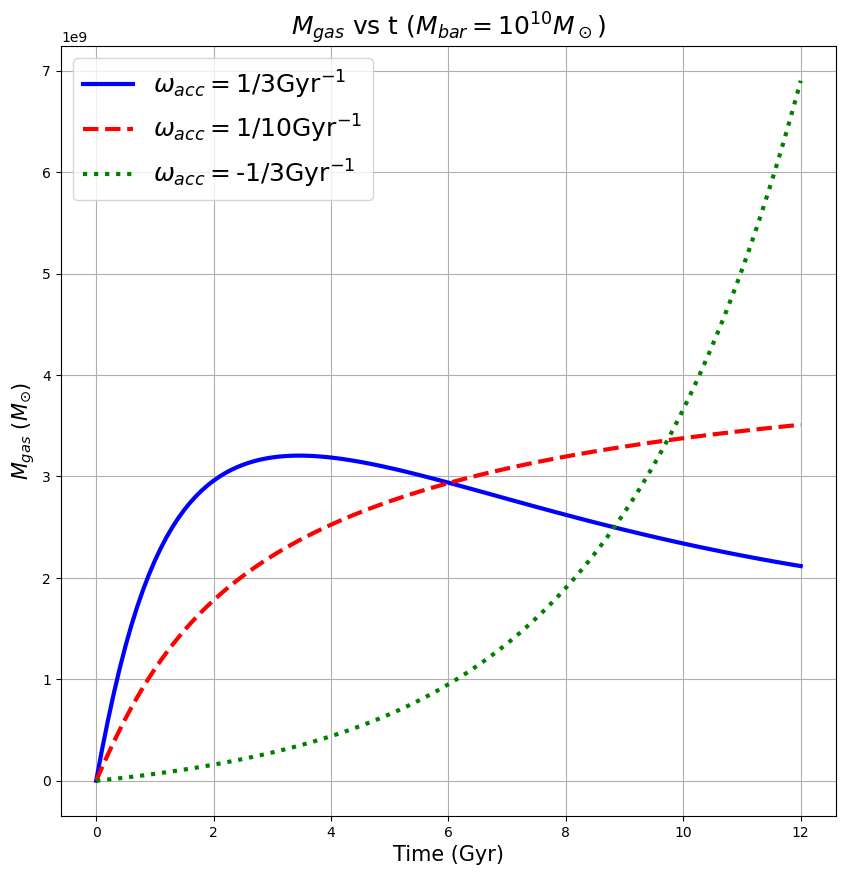

Execution time: 0.3978 seconds


In [45]:
dr = 120
integral_r = r.reshape(835,1)

# #if SFL_type == "old_ksl":
# Mass_gas_summed_old_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl1, dx=dr, axis=0)
# Mass_gas_summed_old_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl2, dx=dr, axis=0)
# Mass_gas_summed_old_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl3, dx=dr, axis=0)
# #elif SFL_type == "new_ksl":
# Mass_gas_summed_new_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl1, dx=dr, axis=0)
# Mass_gas_summed_new_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl2, dx=dr, axis=0)
# Mass_gas_summed_new_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl3, dx=dr, axis=0)
# #elif SFL_type == "boissier":
# Mass_gas_summed_boissier1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier1, dx=dr, axis=0)
# Mass_gas_summed_boissier2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier2, dx=dr, axis=0)
# Mass_gas_summed_boissier3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier3, dx=dr, axis=0)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl3)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl3)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier3)

Mass_gas_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl1, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl2, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl3, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl = np.array([Mass_gas_summed_cutoff_ksl1, Mass_gas_summed_cutoff_ksl2, Mass_gas_summed_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(M_times1[:-1], Mass_gas_summed_old_ksl1[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_new_ksl1[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_boissier1[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{gas}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{gas}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_gas vs time (SFL variation, k={ki}).png')

## $M_{\star}$ vs t

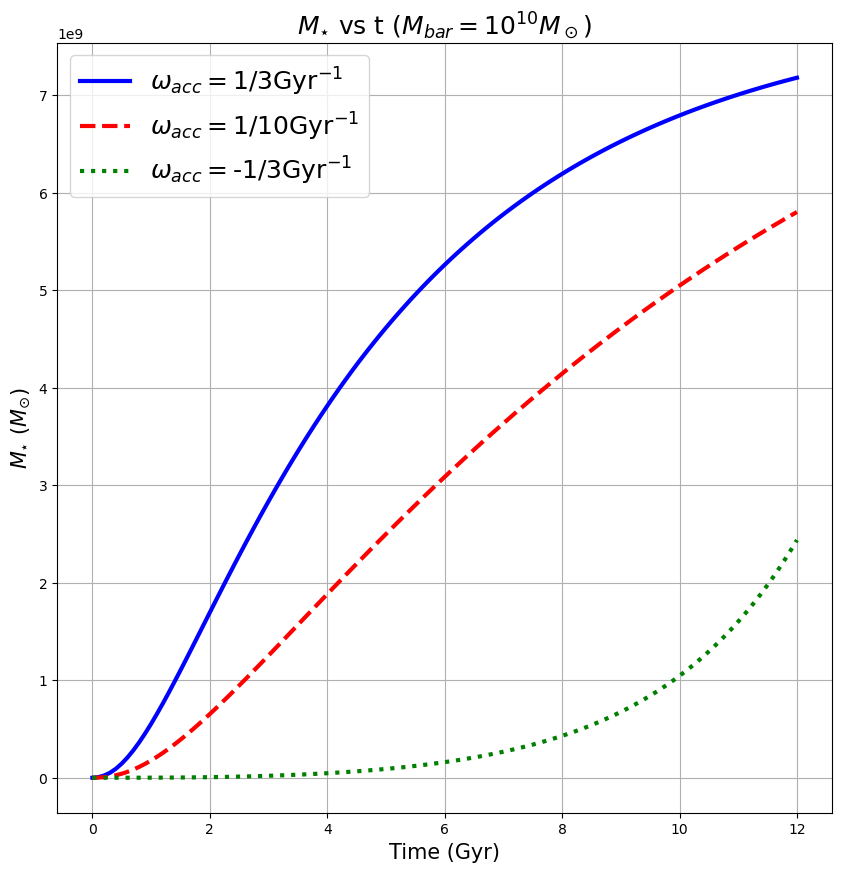

Execution time: 0.3640 seconds


In [46]:
# #if SFL_type == "old_ksl":
# Mass_sfr_summed_old_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs[0], dx=dr, axis=0)
# Mass_sfr_summed_old_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs[1], dx=dr, axis=0)
# Mass_sfr_summed_old_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs[2], dx=dr, axis=0)
# #elif SFL_type == "new_ksl":
# Mass_sfr_summed_new_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[0], dx=dr, axis=0)
# Mass_sfr_summed_new_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[1], dx=dr, axis=0)
# Mass_sfr_summed_new_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[2], dx=dr, axis=0)
# #elif SFL_type == "boissier":
# Mass_sfr_summed_boissier1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[0], dx=dr, axis=0)
# Mass_sfr_summed_boissier2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[1], dx=dr, axis=0)
# Mass_sfr_summed_boissier3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[2], dx=dr, axis=0)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl3)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl3)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier3)

# Mass_time_star_old_ksl_1 = dt*np.cumsum(Mass_sfr_summed_old_ksl1)
# Mass_time_star_old_ksl_2 = dt*np.cumsum(Mass_sfr_summed_old_ksl2)
# Mass_time_star_old_ksl_3 = dt*np.cumsum(Mass_sfr_summed_old_ksl3)

# Mass_time_star_new_ksl_1 = dt*np.cumsum(Mass_sfr_summed_new_ksl1)
# Mass_time_star_new_ksl_2 = dt*np.cumsum(Mass_sfr_summed_new_ksl2)
# Mass_time_star_new_ksl_3 = dt*np.cumsum(Mass_sfr_summed_new_ksl3)

# Mass_time_star_boissier_1 = dt*np.cumsum(Mass_sfr_summed_boissier1)
# Mass_time_star_boissier_2 = dt*np.cumsum(Mass_sfr_summed_boissier2)
# Mass_time_star_boissier_3 = dt*np.cumsum(Mass_sfr_summed_boissier3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_3)

Mass_sfr_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[0], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[1], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[2], dx=dr, axis=0)
Mass_time_star_cutoff_ksl_1 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl1)
Mass_time_star_cutoff_ksl_2 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl2)
Mass_time_star_cutoff_ksl_3 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl3)

np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl3)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{\star}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{\star}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_star vs time (SFL variation, k={ki}).png')

## $M_{bar}$ vs t

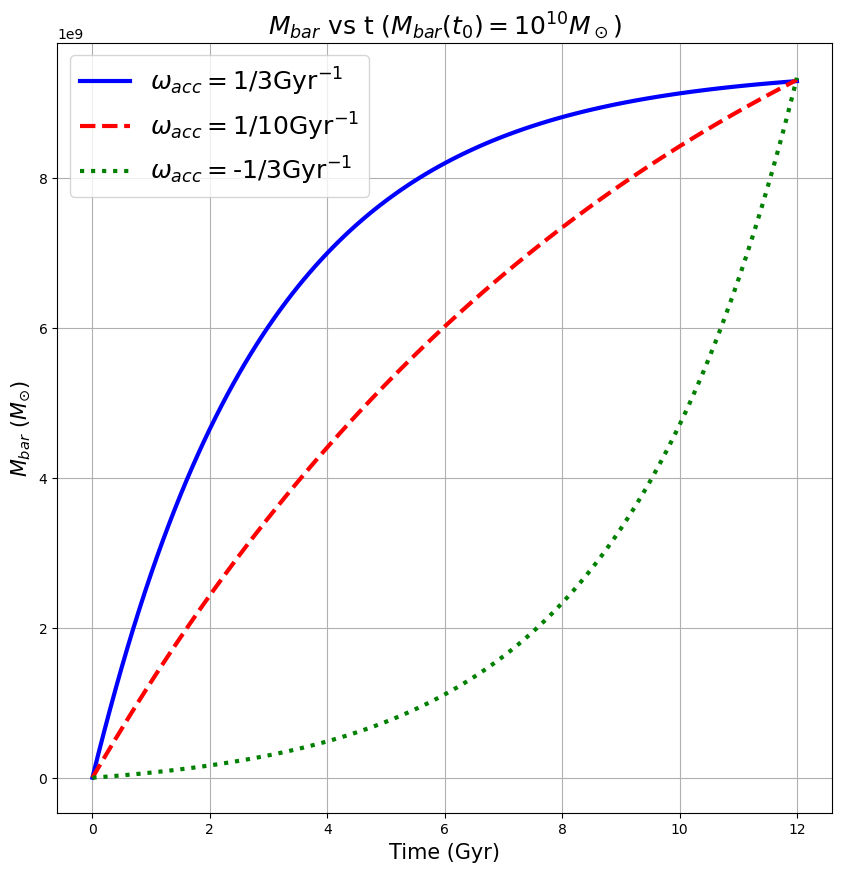

Execution time: 0.3481 seconds


In [47]:
# Mass_time_bar_old_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_1, Mass_gas_summed_old_ksl1)]
# Mass_time_bar_old_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_2, Mass_gas_summed_old_ksl2)]
# Mass_time_bar_old_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_3, Mass_gas_summed_old_ksl3)]

# Mass_time_bar_new_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_1, Mass_gas_summed_new_ksl1)]
# Mass_time_bar_new_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_2, Mass_gas_summed_new_ksl2)]
# Mass_time_bar_new_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_3, Mass_gas_summed_new_ksl3)]

# Mass_time_bar_boissier_1 = [np.sum(x) for x in zip(Mass_time_star_boissier_1, Mass_gas_summed_boissier1)]
# Mass_time_bar_boissier_2 = [np.sum(x) for x in zip(Mass_time_star_boissier_2, Mass_gas_summed_boissier2)]
# Mass_time_bar_boissier_3 = [np.sum(x) for x in zip(Mass_time_star_boissier_3, Mass_gas_summed_boissier3)]

# np.savetxt('../data/data7/Mass_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_1)
# np.savetxt('../data/data7/Mass_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_2)
# np.savetxt('../data/data7/Mass_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_3)

Mass_time_bar_cutoff_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_1, Mass_gas_summed_cutoff_ksl1)]
Mass_time_bar_cutoff_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_2, Mass_gas_summed_cutoff_ksl2)]
Mass_time_bar_cutoff_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_3, Mass_gas_summed_cutoff_ksl3)]

np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_old_ksl_2[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_new_ksl_2[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_boissier_2[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{bar}}$ vs t ($M_{{bar}}(t_0)=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation, k={ki}).png')

#  Global $f_{gas}$ vs t

/tmp/ipykernel_894500/2773086158.py:25: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
/tmp/ipykernel_894500/2773086158.py:26: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
/tmp/ipykernel_894500/2773086158.py:27: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)


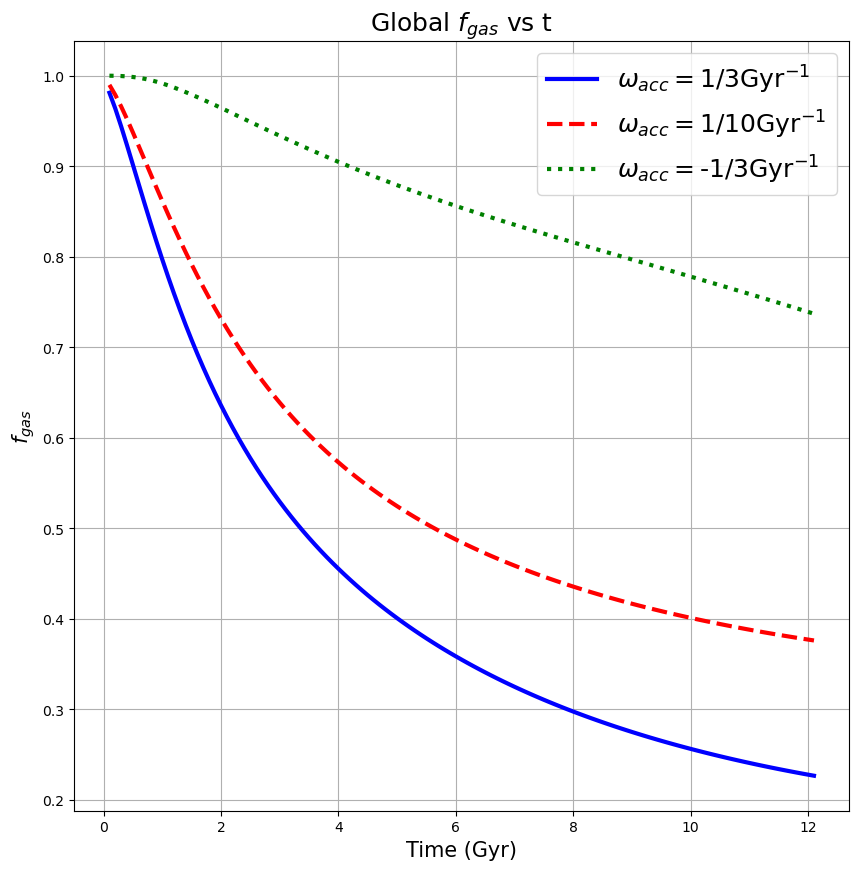

Execution time: 0.3210 seconds


In [48]:
# f_global_gas_old_ksl1 = np.divide(Mass_gas_summed_old_ksl1, Mass_time_bar_old_ksl_1)
# f_global_gas_old_ksl2 = np.divide(Mass_gas_summed_old_ksl2, Mass_time_bar_old_ksl_2)
# f_global_gas_old_ksl3 = np.divide(Mass_gas_summed_old_ksl3, Mass_time_bar_old_ksl_3)

# f_global_gas_new_ksl1 = np.divide(Mass_gas_summed_new_ksl1, Mass_time_bar_new_ksl_1)
# f_global_gas_new_ksl2 = np.divide(Mass_gas_summed_new_ksl2, Mass_time_bar_new_ksl_2)
# f_global_gas_new_ksl3 = np.divide(Mass_gas_summed_new_ksl3, Mass_time_bar_new_ksl_3)

# f_global_gas_boissier1 = np.divide(Mass_gas_summed_boissier1, Mass_time_bar_boissier_1)
# f_global_gas_boissier2 = np.divide(Mass_gas_summed_boissier2, Mass_time_bar_boissier_2)
# f_global_gas_boissier3 = np.divide(Mass_gas_summed_boissier3, Mass_time_bar_boissier_3)

# np.savetxt('../data/data7/f_gas1_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl1)
# np.savetxt('../data/data7/f_gas2_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl2)
# np.savetxt('../data/data7/f_gas3_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl3)

# np.savetxt(f'../data/data7/f_gas1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl1)
# np.savetxt(f'../data/data7/f_gas2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl2)
# np.savetxt(f'../data/data7/f_gas3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl3)

# np.savetxt(f'../data/data7/f_gas1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier1)
# np.savetxt(f'../data/data7/f_gas2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier2)
# np.savetxt(f'../data/data7/f_gas3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier3)

f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, f_global_gas_cutoff_ksl1, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl2, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl3, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $f_{gas}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$f_{gas}$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global f_gas vs time (t_acc variation, k={ki}).png')

# Specific Angular Momentum $j_{bar}$

/tmp/ipykernel_894500/4088965567.py:44: RuntimeWarning: invalid value encountered in divide
  j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
/tmp/ipykernel_894500/4088965567.py:45: RuntimeWarning: invalid value encountered in divide
  j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
/tmp/ipykernel_894500/4088965567.py:46: RuntimeWarning: invalid value encountered in divide
  j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)


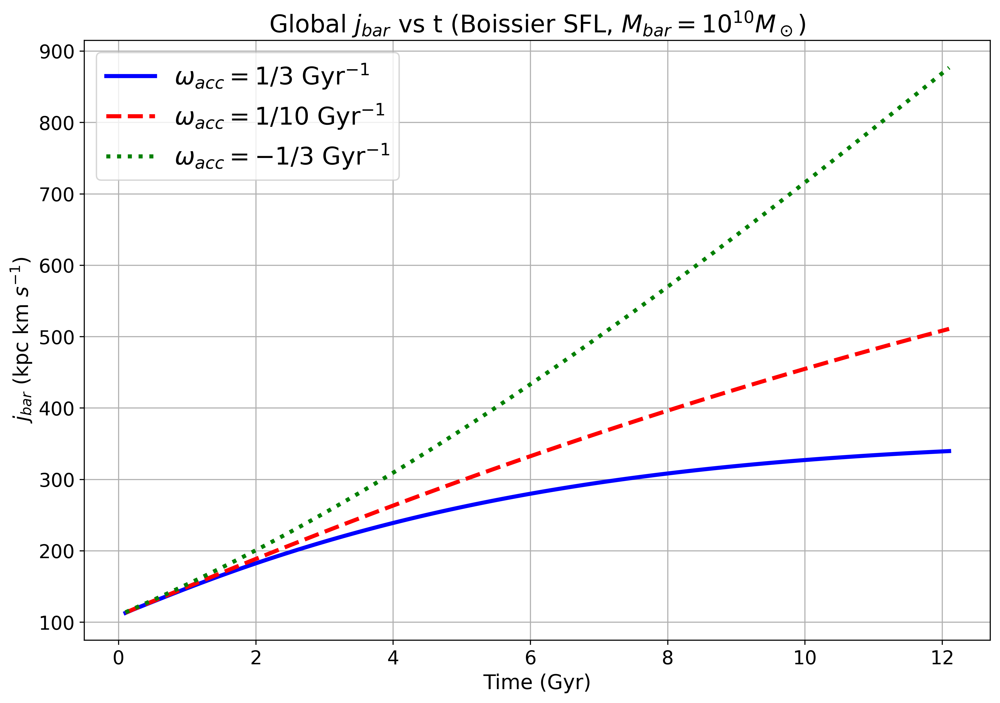

Execution time: 1.7839 seconds


In [49]:
SFL_type = "cutoff_ksl"

# if SFL_type == "old_ksl":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
# elif SFL_type == "new_ksl":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
# elif SFL_type == "boissier":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_star1 = dt*np.cumsum(sfr_r_squared1)
Nominator_star2 = dt*np.cumsum(sfr_r_squared2)
Nominator_star3 = dt*np.cumsum(sfr_r_squared3)

Nominator_bar1 = [np.sum(x) for x in zip(Nominator_star1, Nominator_gas1)]
Nominator_bar2 = [np.sum(x) for x in zip(Nominator_star2, Nominator_gas2)]
Nominator_bar3 = [np.sum(x) for x in zip(Nominator_star3, Nominator_gas3)]

j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)

np.savetxt('../data/data7/j_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar1)
np.savetxt('../data/data7/j_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar2)
np.savetxt('../data/data7/j_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar3)

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, j_bar1/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[0]))}$ Gyr$^{{-1}}$", color="blue", lw=3)
frame.plot(M_times1, j_bar2/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[1]))}$ Gyr$^{{-1}}$", linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, j_bar3/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[2]))}$ Gyr$^{{-1}}$", linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $j_{bar}$ vs t (Boissier SFL, $M_{bar}=10^{10}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global j_bar vs time (t_acc variation, k={ki}).png')

# Model Definer

In [50]:
def Full_final_definer(Mbar, t_acc_arr, star_formation_law, interpolator, res=120, Rmax=100.1, at_t0=True, ns=1, ks=1, atollerance=1e-8, rtollerance=1e-6):
    """
    Defines the global fraction of gas and baryonic specific angular momentum arrays.
    This function is self-contained; together with the Sigma_definer function, and the functions defining 
    the accretion radius and angular momentum, as well as the baryonic mass and rotational velocity, it 
    alone should give the arrays for the final FINAL graph.
    
    --------------
    Inputs:
        - Mbar (float)           --> Baryonic mass value for which you want to evaluate global gas fraction and 
                                     (specific) angular momentum.
        - t_acc_arr (np.array)   --> Array containing the accretion timescale values. This function now works 
                                     for any number of values within the array!
        - res (float)            --> (optional) Resolution of the radius array; gives the values of the radii at
                                     which values are evaluated. Default is 120 pc.
        - Rmax (float)           --> (optional) Maximum radius to evaluate. Default is 100.1 kpc. Together with
                                     res these defaults were chosen as to optimize run time and convergence of 
                                     specific angular momentum. 
        - at_t0 (bool)           --> (optional) Specifes whether to return just the values today (True), or the 
                                     entire evolution (False). Default is True.
        - ns (float)             --> (optional) Power parameter of the accreting angular momentum form. 
                                     Default is 1.
        - ks (float)             --> (optional) Slope parameter of the accreting angular momentum form. 
                                     Default is 1.
    
    Returns:
        - f_gas_array (np.array) --> Array containing, depending on at_t0, either the values of the global
                                     gas fraction today (t = 12Gyr), or in the entire evolution.
        - j_bar_array (np.array) --> Array containing, depending on at_t0, either the values of the specific
                                     angular momentum today (t = 12Gyr), or in the entire evolution.
    
    """
    
    r = np.arange(0,1000*Rmax,res)
    dr = res
    Mbar_full = np.full(M_times1.shape, Mbar)
    
    SD_gas = np.array([Sigma_definer(r, t_acc, Mbar, SFL_type=star_formation_law, interpolator=interpolator, n=ns, con=ks, atol=atollerance, rtol=rtollerance) for t_acc in t_acc_arr])
    if star_formation_law == "boissier":
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar_full) for i in range(len(SD_gas))])
    elif star_formation_law == "cutoff_ksl":
        SD_sfr = np.array([sfl_cutoff_array(SD_gas[i]) for i in range(len(SD_gas))])
    else:
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar) for i in range(len(SD_gas))])
    
    r = r.reshape(len(r),1)
    
    M_gas = np.array([2*np.pi*spint.simpson(r*SD_gas[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_sfr = np.array([2*np.pi*spint.simpson(r*SD_sfr[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_star = np.array([dt*np.cumsum(M_sfr[i]) for i in range(len(SD_gas))])
    M_bar = np.array([np.array([np.sum(x) for x in zip(M_star[i], M_gas[i])]) for i in range(len(SD_gas))])
    f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])

    #Mbar_allsame = np.full(len(M_bar[0]), M_bar[0][-1])
    #v_rot = v_btfr_def(Mbar_allsame[0])
    rv = rv_def(Mbar)
    
    nominator_gas = np.array([2*np.pi*spint.simpson(r**2*SD_gas[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_sfr = np.array([2*np.pi*spint.simpson(r**2*SD_sfr[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_star = np.array([dt*np.cumsum(nominator_sfr[i]) for i in range(len(SD_gas))])
    nominator_bar = np.array([np.array([np.sum(x) for x in zip(nominator_star[i], nominator_gas[i])]) for i in range(len(SD_gas))])
    j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
    j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
    j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
    
    M_star_t0 = M_star[:,-1]
    M_gas_t0  = M_gas[:,-1]
    
    if (at_t0==True):
        f_gas_array = f_gas_global[:,-1]
        j_bar_array = j_bar[:,-1]/1000
        j_gas_array = j_gas[:,-1]/1000
        j_star_array = j_star[:,-1]/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        f_gas_array = f_gas_global
        j_bar_array = j_bar/1000
        j_gas_array = j_gas/1000
        j_star_array = j_star/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star, M_gas

def simpson_uniform_jax(y, dx, axis=0):
    """
    Simpson integration with uniform spacing dx in JAX.
    Handles both even and odd number of samples like scipy.integrate.simpson:
      - if N points => N-1 intervals
      - if (N-1) is odd (N even): Simpson on first N-1 points, trapezoid for last interval.
    """
    y = jnp.asarray(y)
    # move integration axis to 0 for convenience
    y = jnp.moveaxis(y, axis, 0)

    N = y.shape[0]

    # if N < 2, integral is zero
    if N < 2:
        return jnp.zeros_like(y[0])

    def simpson_all(y_local):
        w = jnp.ones(N)
        w = w.at[1:N-1:2].set(4.0)
        w = w.at[2:N-1:2].set(2.0)
        return dx / 3.0 * jnp.tensordot(w, y_local, axes=(0, 0))

    def simpson_plus_trap(y_local):
        # use Simpson on first N-1 points, trap on last interval
        Nsim = N - 1
        y_s = y_local[:Nsim] # Simpson part
        w = jnp.ones(Nsim)
        w = w.at[1:Nsim-1:2].set(4.0)
        w = w.at[2:Nsim-1:2].set(2.0)
        simp = dx / 3.0 * jnp.tensordot(w, y_s, axes=(0, 0))
        trap = dx * 0.5 * (y_local[-2] + y_local[-1])
        return simp + trap

    result = jax.lax.cond(
        (N % 2 == 1),
        simpson_all,
        simpson_plus_trap,
        y
    )

    return jnp.moveaxis(result, 0, axis)

@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    # broadcast R just to satisfy the signature; it’s ignored for cutoff_ksl
    R_broad = r_col[None, :, :] # (1, n_r, 1) -> broadcasts to SD_gas
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  

    M_star = dt*jnp.cumsum(M_sfr, axis=-1)           
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    v_rot = exp_vrot_jax(r_pc, Mbar)[:, None]
    integrand_gas_j = r2_col[None,:,:]*SD_gas*v_rot[None, :, :]
    integrand_sfr_j = r2_col[None,:,:]*Sigma_sfr*v_rot[None, :, :]

    def integrate_radius_j(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    nom_gas  = jax.vmap(integrate_radius_j)(integrand_gas_j)
    nom_sfr  = jax.vmap(integrate_radius_j)(integrand_sfr_j)
    nom_star = dt * jnp.cumsum(nom_sfr, axis=-1)
    nom_bar  = nom_star + nom_gas

    j_bar  = nom_bar / jnp.where(M_bar_tot > 0, M_bar_tot, jnp.inf)
    j_gas  = nom_gas/ jnp.where(M_gas > 0, M_gas, jnp.inf)
    j_star = nom_star / jnp.where(M_star > 0, M_star, jnp.inf)

    if at_t0:
        f_gas_array  = f_gas_global[:, -1]
        j_bar_array  = j_bar[:, -1]/1000.0
        j_gas_array  = j_gas[:, -1]/1000.0
        j_star_array = j_star[:, -1]/1000.0
        M_star_t0    = M_star[:, -1]
        M_gas_t0     = M_gas[:, -1]
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        return (f_gas_global,
                j_bar  / 1000.0,
                j_gas  / 1000.0,
                j_star / 1000.0,
                M_star,
                M_gas)

def C_def_jax(M_bar, t_acc, t0=12.0):
    """
    JAX-friendly version of C_def.
    """
    t_acc = jnp.asarray(t_acc, dtype=jnp.float64)

    pos = t_acc > 0.0
    neg = t_acc < 0.0
    infmask = jnp.isinf(t_acc)

    # positive t_acc
    C_pos = M_bar / (t_acc * (1.0 - jnp.exp(-t0 / t_acc)))

    # negative t_acc
    abs_t = jnp.abs(t_acc)
    C_neg = M_bar / (abs_t * (jnp.exp(t0 / abs_t) - 1.0))

    # infinite t_acc
    C_inf = M_bar / t0

    C = jnp.where(pos, C_pos, C_neg)
    C = jnp.where(infmask, C_inf, C)

    return C

@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    # radius grid in pc (static because res, Rmax are static)
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    # precompute C(t_acc) for all t_acc
    C_vals = C_def_jax(Mbar, t_acc_arr)   # shape (n_tacc,)

    # vectorised call to Sigma_definer_jax over t_acc
    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    # post-process entirely in JAX
    return full_from_sigma_jax(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )

def process_mbar(M, t_acc_array, star_formation_law, interpolator, ns, ks):
    """
    Implements multiprocessing
    """
    return Full_final_definer(10**M, t_acc_array, star_formation_law, interpolator, ns=ns, ks=ks)


Execution time: 0.0158 seconds


In [51]:
@partial(jax.jit, static_argnames=("star_formation_law"))
def run_all_masses(Mbar_grid,
                   t_acc_arr,
                   r_acc_matrix_for_all_M_jax,
                   log_M_bar_array_jax,
                   star_formation_law):

    def per_mass(Mbar):
        return Full_final_definer_jax(
            Mbar,
            t_acc_arr,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            at_t0=True,
        )

    f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all = \
        jax.vmap(per_mass)(Mbar_grid)

    return f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all

Execution time: 0.0048 seconds


# New KSL with Cutoff

## Experiments for k and n

In [46]:
log_M_bar_array_testing = np.linspace(8, 11.5, 30)
t_acc_array_testing = np.array([1,3,10,25,-10,5,-3])

Execution time: 0.0011 seconds


n = 0.3, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

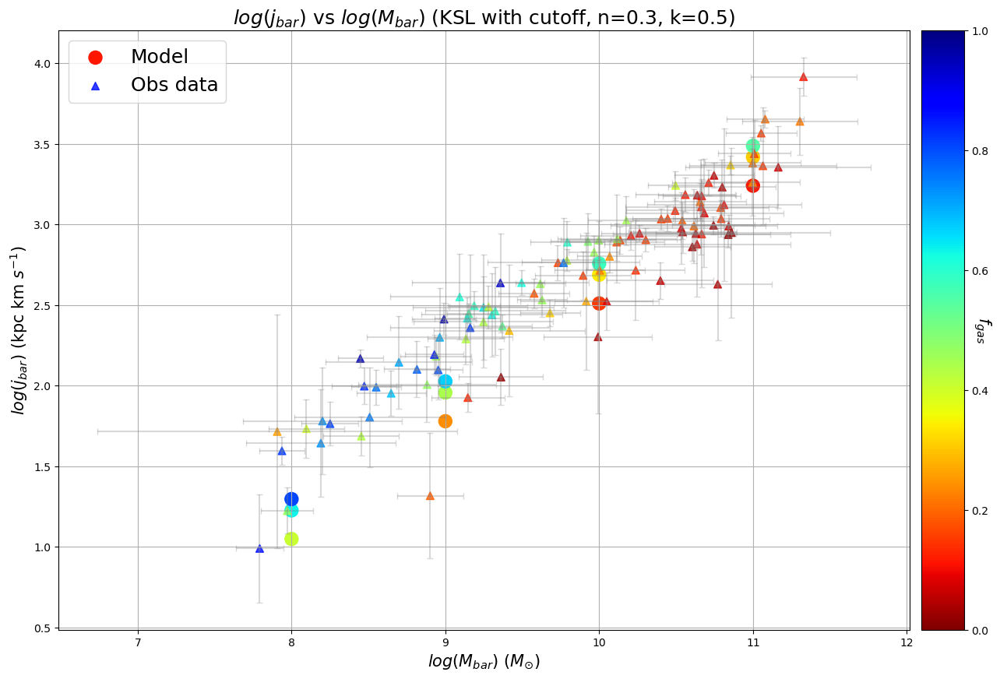

n = 0.3, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

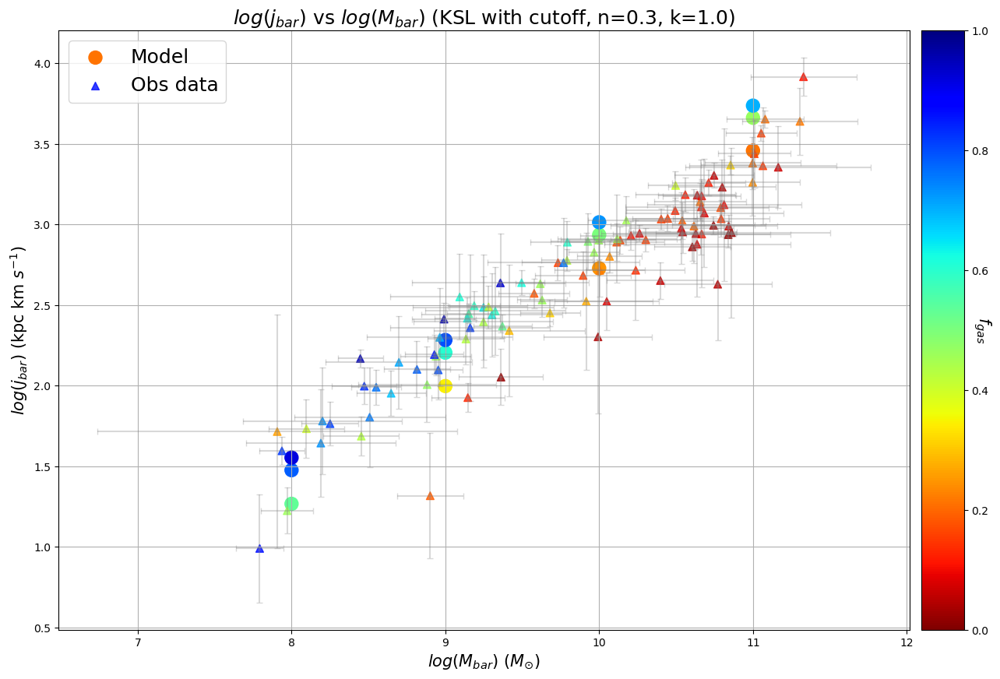

n = 0.3, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

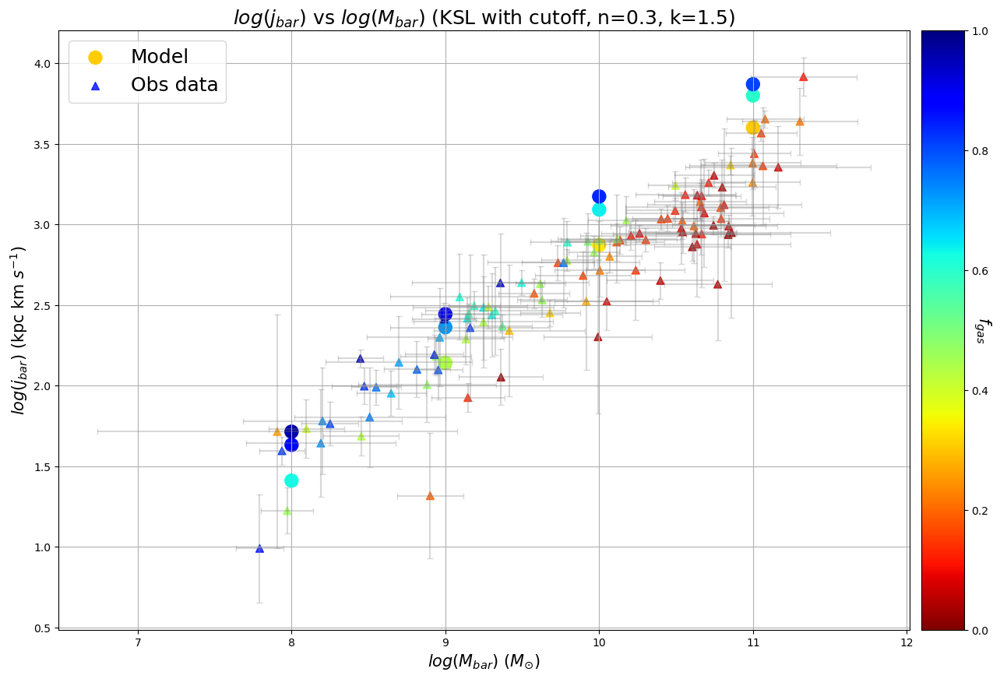

n = 0.3, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

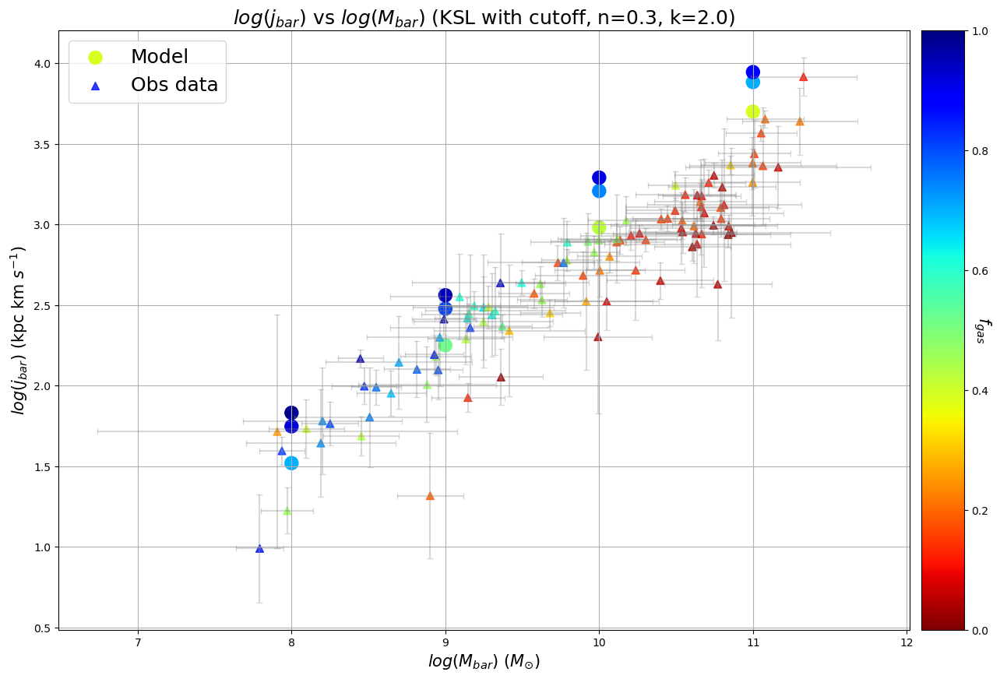

n = 0.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

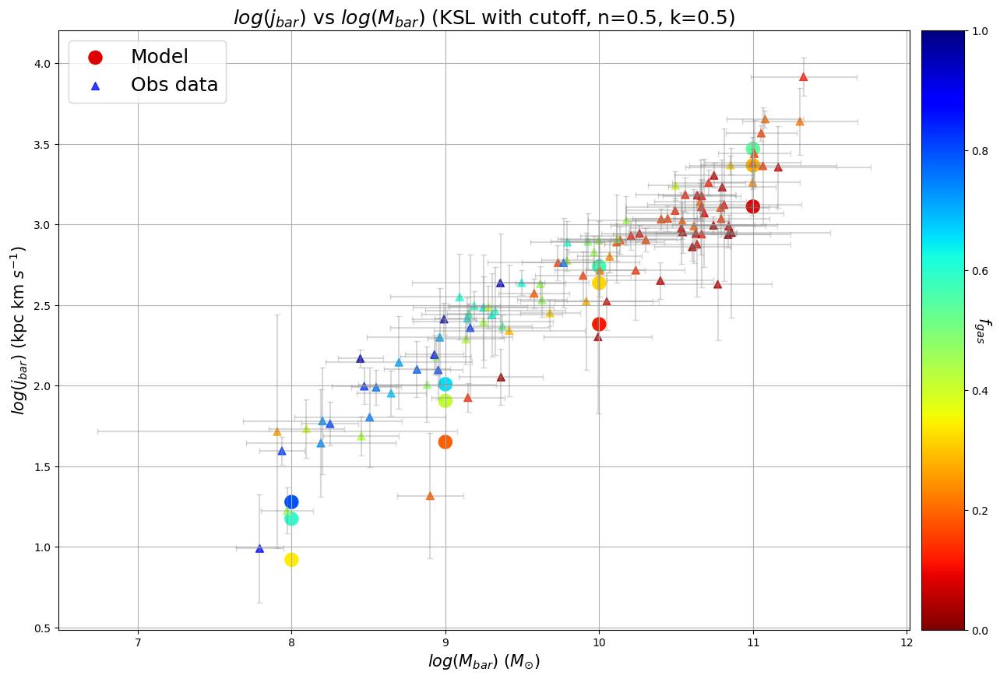

n = 0.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

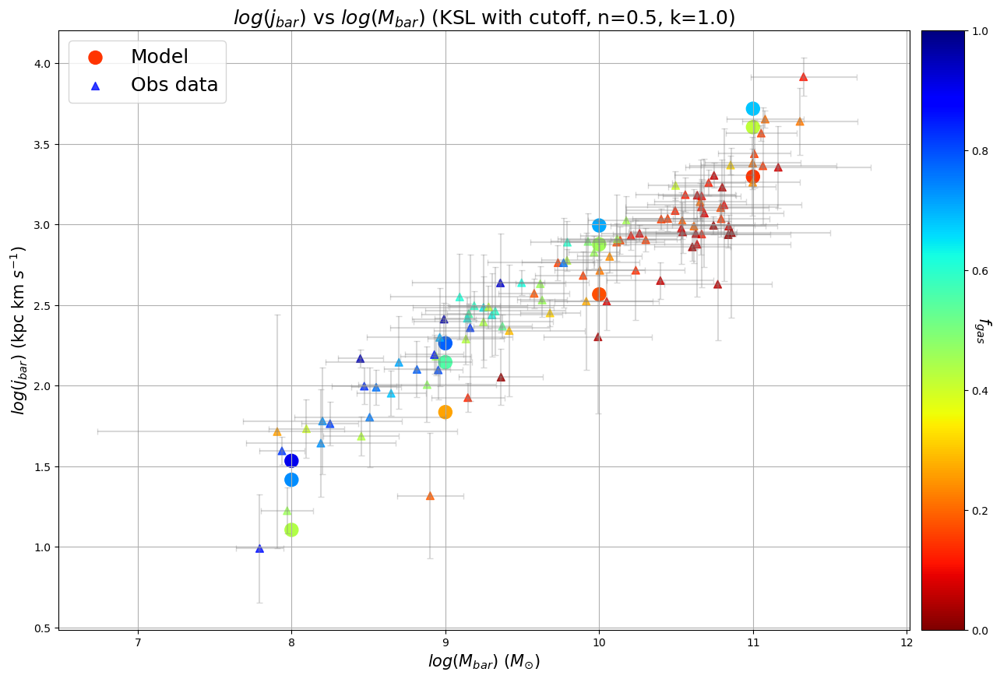

n = 0.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

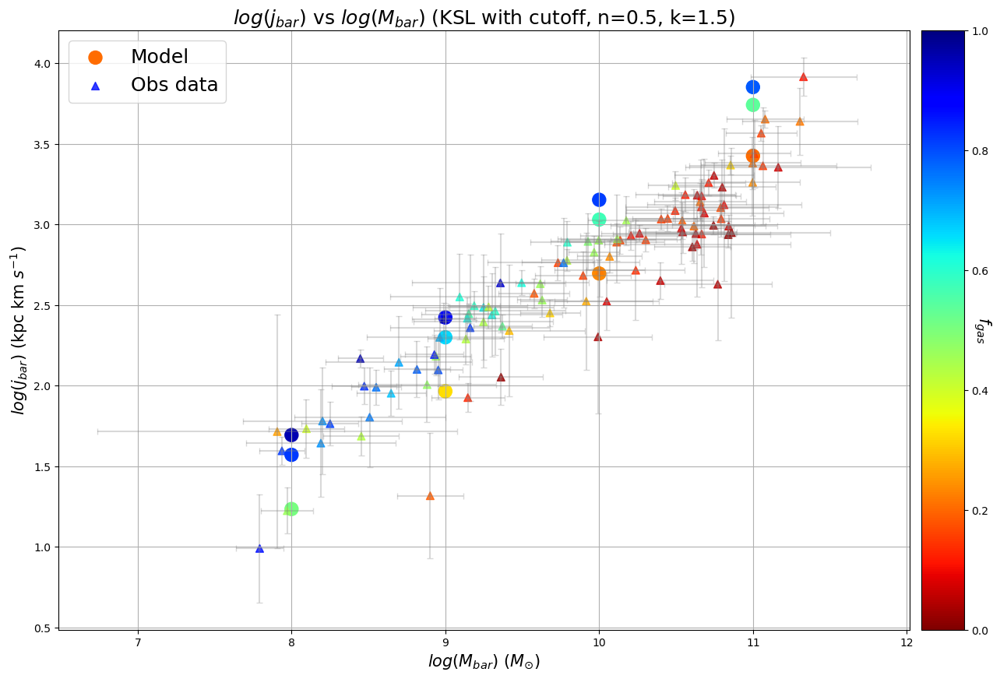

n = 0.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

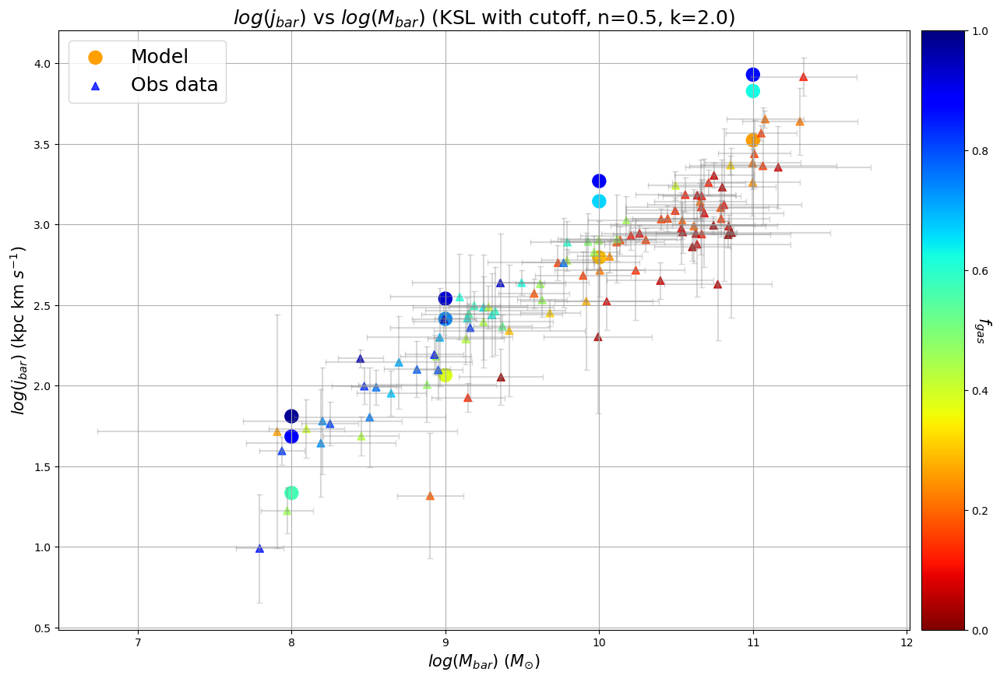

n = 1.0, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

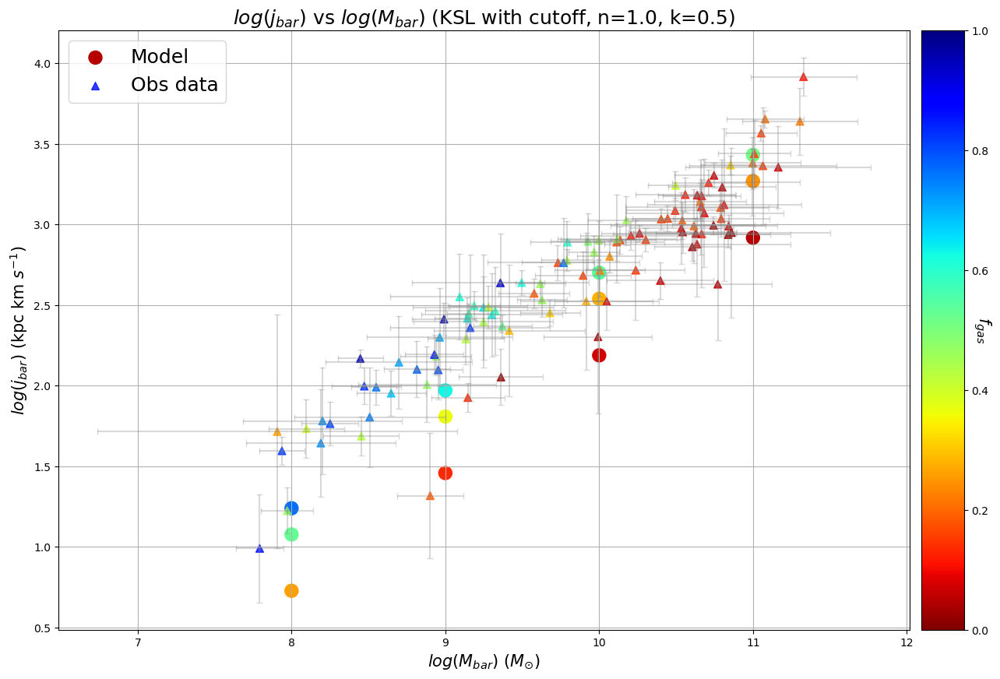

n = 1.0, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

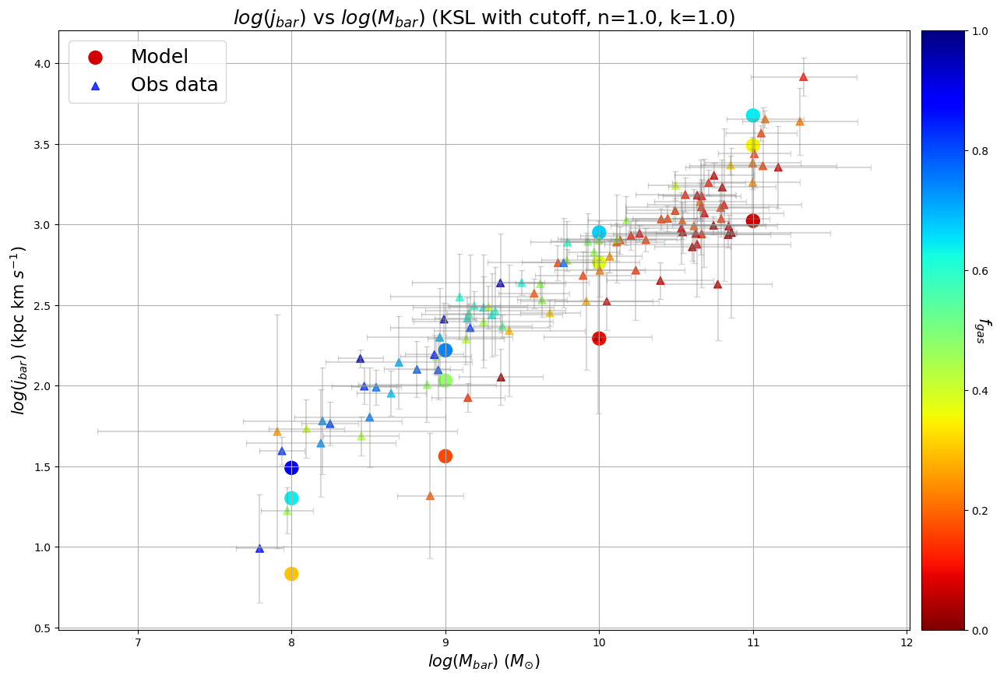

n = 1.0, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

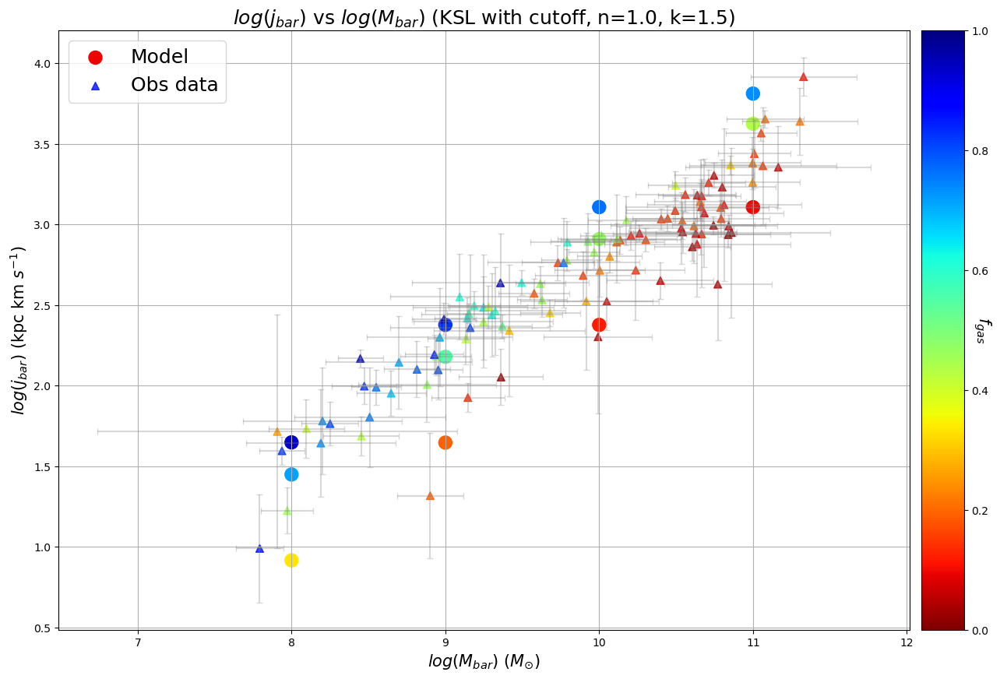

n = 1.0, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

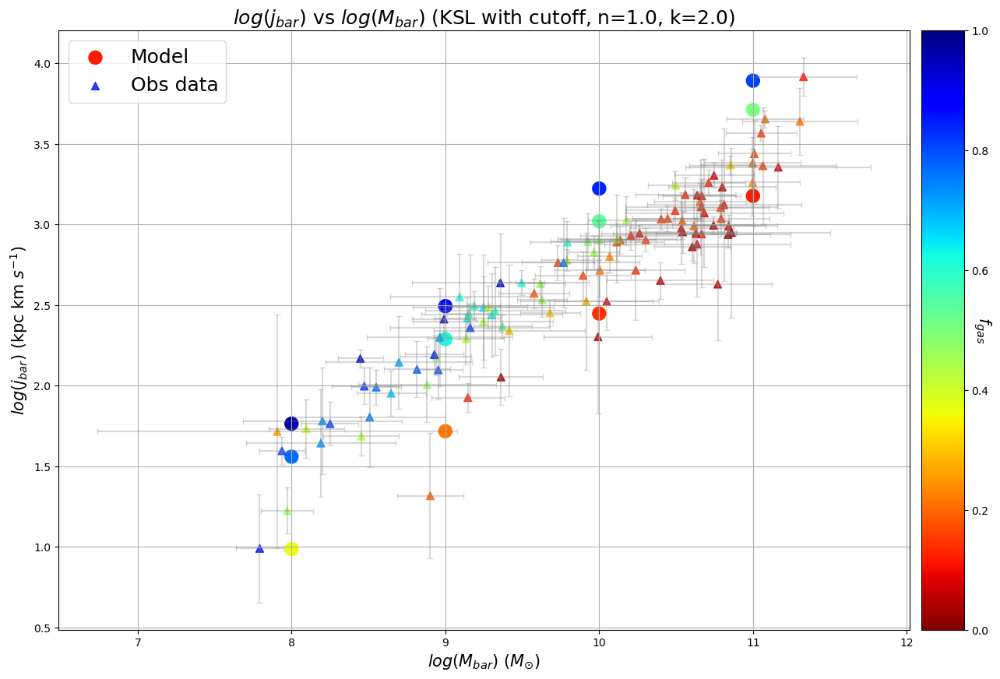

n = 1.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

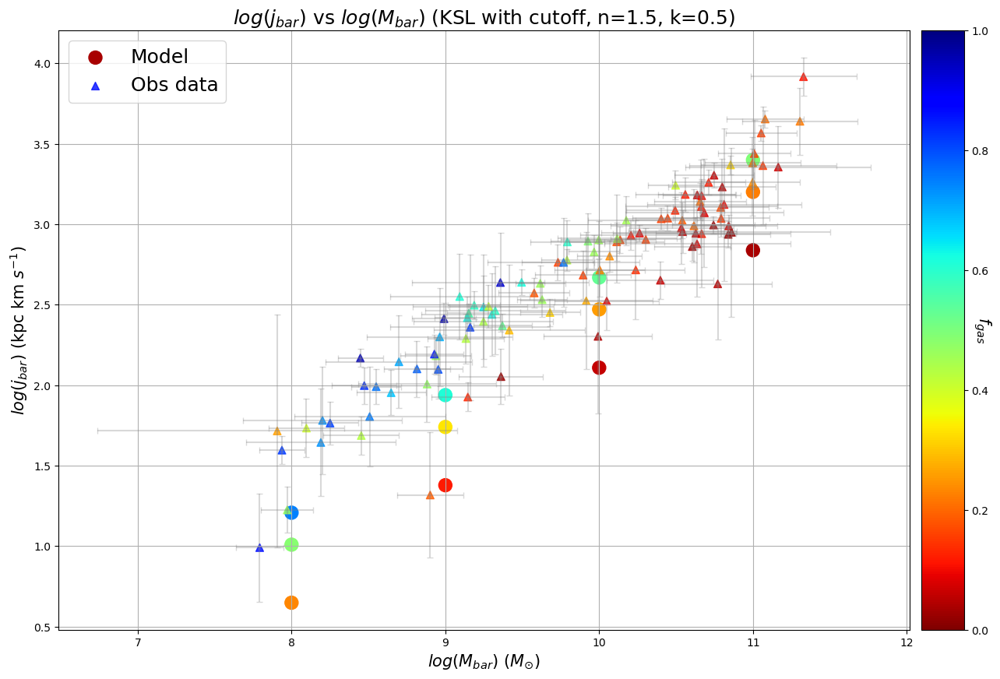

n = 1.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

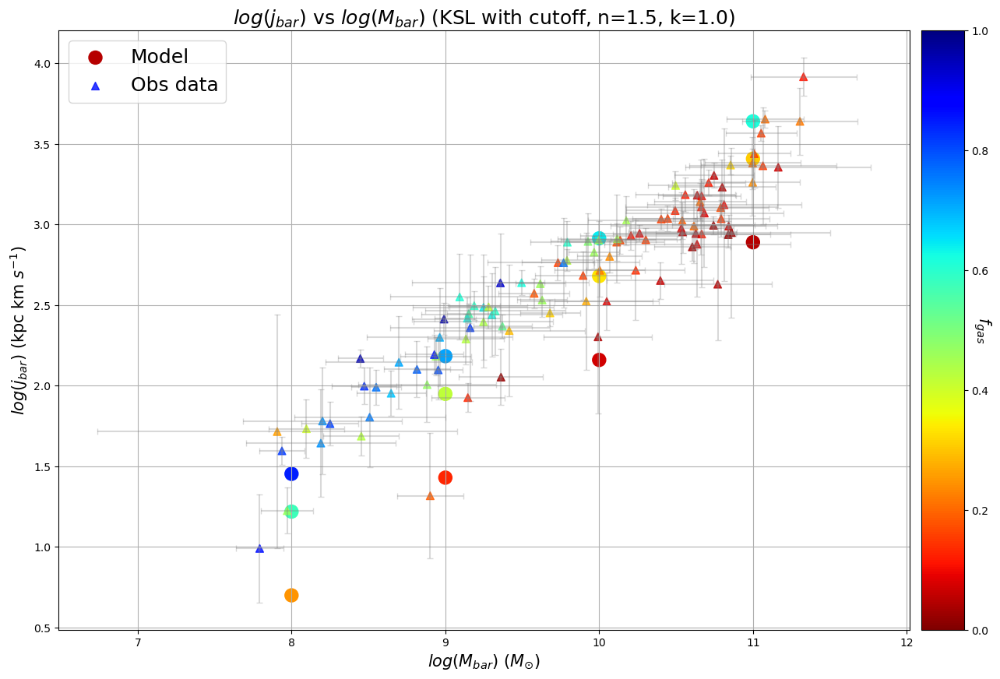

n = 1.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

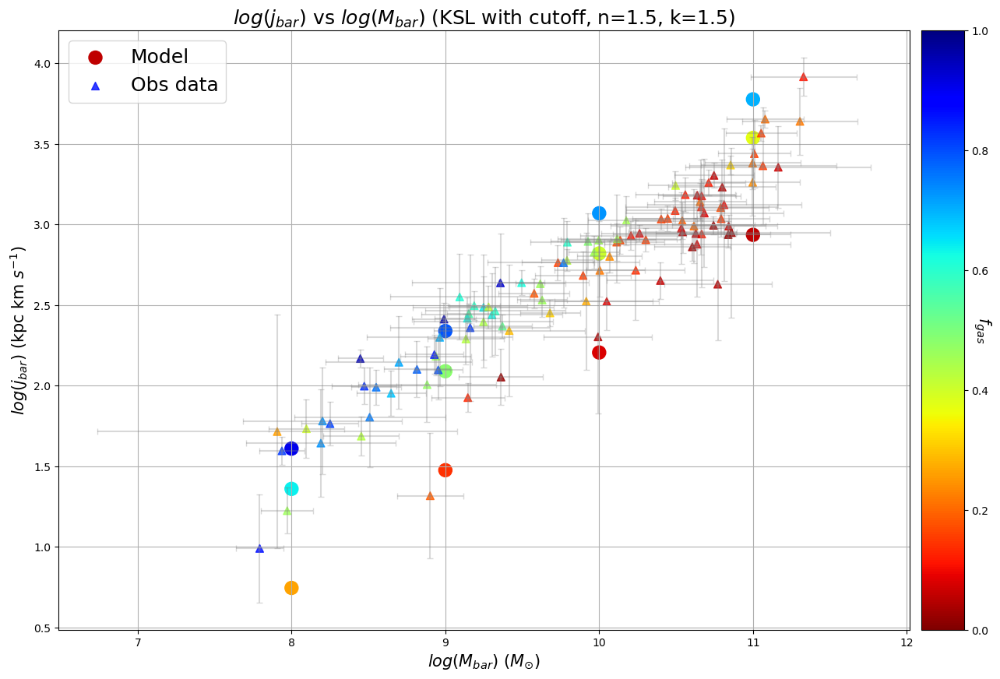

n = 1.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

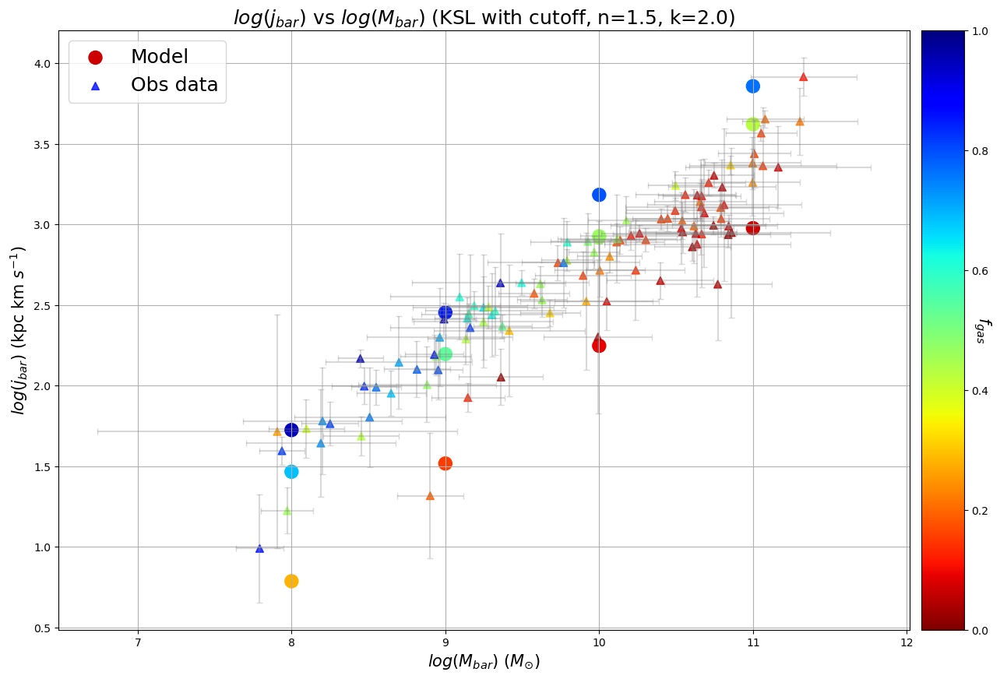

Execution time: 552.9589 seconds


In [ ]:
# for j, n, w, k in zip(range(len(n_values)), n_values, range(len(k_values)), k_values):

for j, n in enumerate(n_values):
    for w, k in enumerate(k_values):
        print(f"n = {n}, k = {k}")

        f_gas_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
        j_bar_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

        racc_interp = r_acc_interpolators_matrix[j, w]

        process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=racc_interp, ns=n, ks=k)

        print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
        with ProcessPoolExecutor() as executor:
            results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

        for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
            f_gas_array_temp_cutoff_ksl[i] = f_gas_temp
            j_bar_array_temp_cutoff_ksl[i] = j_bar_temp

        log_j_bar_array_temp = np.log10(j_bar_array_temp_cutoff_ksl)

        cmap = cm.jet_r
        mpl.rc("image", cmap="jet_r")
        fig = figure(figsize=(15,10),  facecolor='w')
        frame = fig.add_subplot(1,1,1)

        #Model
        divider = make_axes_locatable(frame)
        colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
        for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_temp, f_gas_array_temp_cutoff_ksl):
            mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
        mod.set_label("Model")
        cbar1 = fig.colorbar(mod, cax=colbarframe1)
        cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

        #Data
        frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
        frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

        frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={n}, k={k})", fontsize = 18)
        frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
        frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
        frame.legend(prop={'size': 18})
        frame.grid()
        show()

/tmp/ipykernel_2308481/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

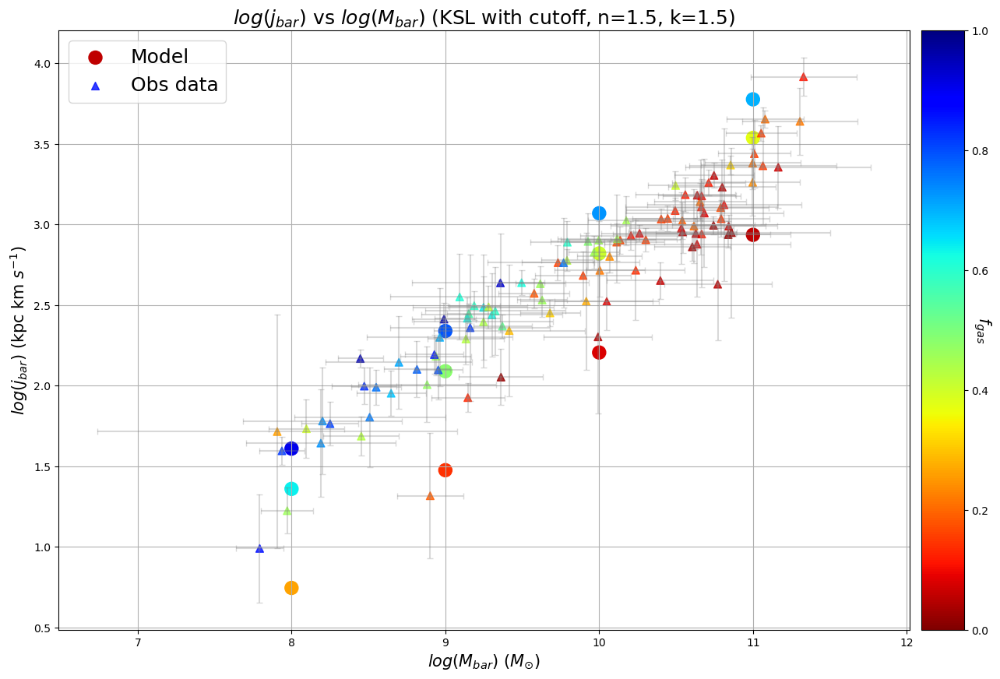

Execution time: 42.6380 seconds


In [ ]:
f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

racc_interp = r_acc_interpolators_matrix[3, 2]

process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=racc_interp, ns=1.5, ks=1.5)

print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
with ProcessPoolExecutor() as executor:
    results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
    f_gas_array_10_50_cutoff_ksl[i] = f_gas_temp
    j_bar_array_10_50_cutoff_ksl[i] = j_bar_temp

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={1.5}, k={1.5})", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()

/tmp/ipykernel_2308481/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2308481/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

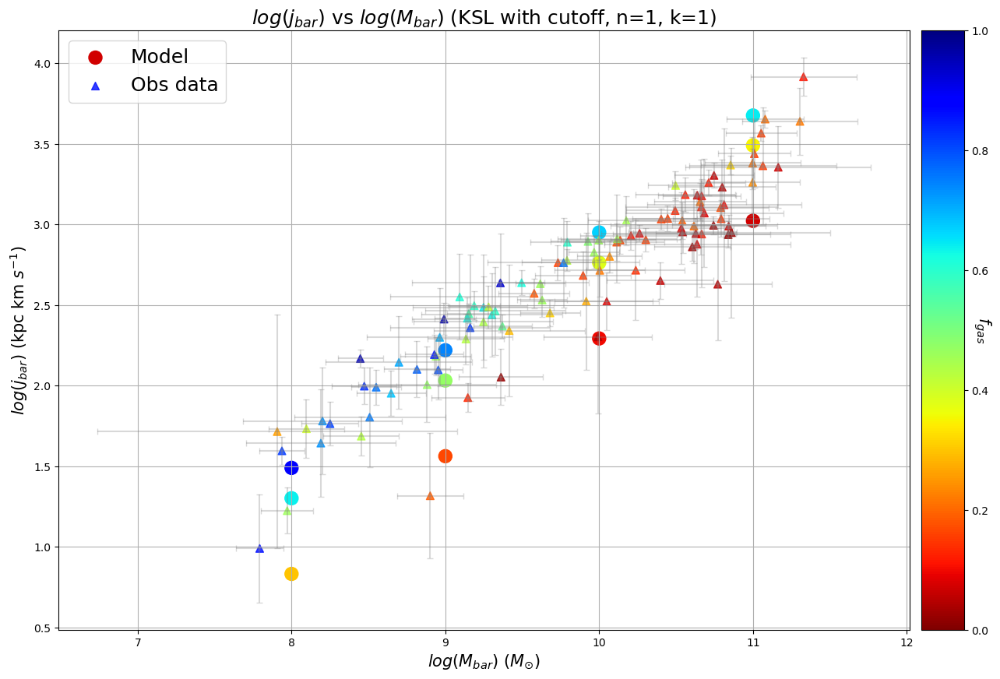

Execution time: 42.5001 seconds


In [ ]:
f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=r_acc_interpolators_matrix[2, 1], ns=1, ks=1)

print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
with ProcessPoolExecutor() as executor:
    results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
    f_gas_array_10_50_cutoff_ksl[i] = f_gas_temp
    j_bar_array_10_50_cutoff_ksl[i] = j_bar_temp

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={1}, k={1})", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()

Running multiprocessing for M_bar models with 192 CPUs...


/tmp/ipykernel_3144490/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_3144490/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_3144490/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_3144490/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_3144490/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_3144490/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

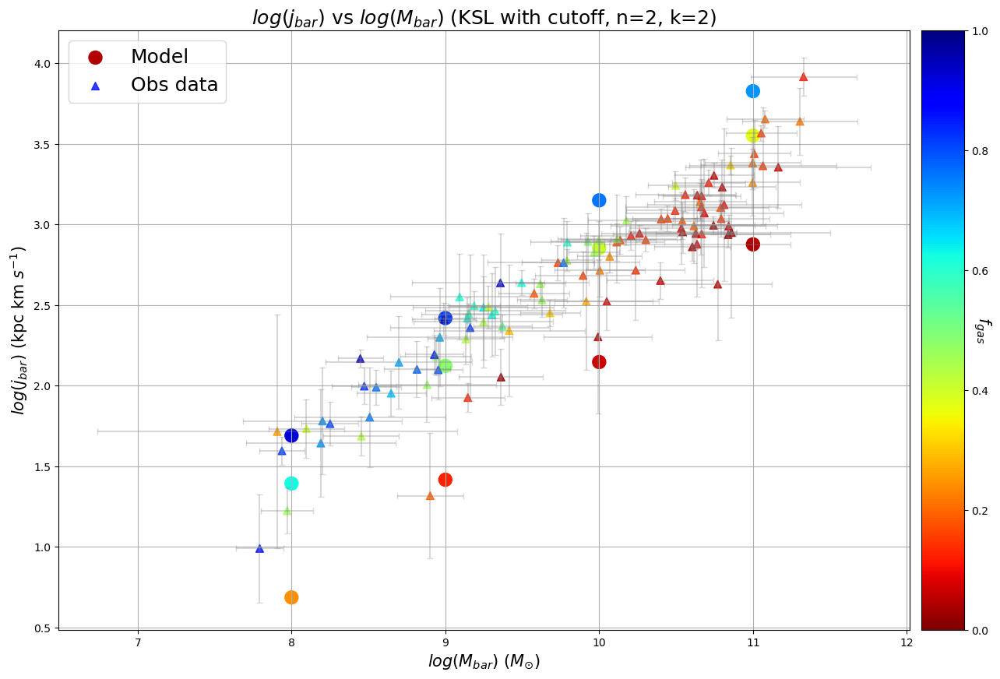

Execution time: 45.6652 seconds


In [ ]:
f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

racc_interp = r_acc_factory(M_times1, nl=2, kl=2)

process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=racc_interp, ns=2, ks=2)

print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
with ProcessPoolExecutor() as executor:
    results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
    f_gas_array_10_50_cutoff_ksl[i] = f_gas_temp
    j_bar_array_10_50_cutoff_ksl[i] = j_bar_temp

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={2}, k={2})", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()

# MCMC running

In [52]:
@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax_mcmc(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    R_broad = r_col[None, :, :]
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  
    M_star = dt*jnp.cumsum(M_sfr, axis=-1)
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    if at_t0:
        return f_gas_global[:, -1]
    else:
        return f_gas_global
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax_mcmc(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    C_vals = C_def_jax(Mbar, t_acc_arr)

    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    return full_from_sigma_jax_mcmc(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_and_jbar_for_galaxies_jax(Mbar_array,
                                   t_acc_array,
                                   star_formation_law,
                                   r_acc_matrix_for_all_M_jax,
                                   log_M_bar_array_jax,
                                   res=120,
                                   Rmax=100.1,
                                   at_t0=True):
    """
    For each galaxy (Mbar, t_acc) return (f_gas(t0), j_bar(t0)) from the full JAX model.
    """

    def per_gal(Mbar, t_acc):
        # length-1 t_acc array
        f_gas_arr, j_bar_arr, _, _, _, _ = Full_final_definer_jax(
            Mbar,
            jnp.array([t_acc], dtype=jnp.float64),
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            res=res,
            Rmax=Rmax,
            at_t0=at_t0,
        )
        # f_gas_arr, j_bar_arr have shape (1,) over t_acc; take element 0
        return f_gas_arr[0], j_bar_arr[0]

    # vmapped over galaxies
    fgas_mod, jbar_mod = jax.vmap(per_gal)(Mbar_array, t_acc_array)
    return fgas_mod, jbar_mod

Execution time: 0.0057 seconds


### Solve for $\omega_\mathrm{acc}$ from the analytical $j_\mathrm{bar}$

In [53]:
x_grid_jax = jnp.linspace(0.0, 1.0, 256, dtype=jnp.float64)
dx_x = x_grid_jax[1] - x_grid_jax[0]

Execution time: 0.1094 seconds


In [54]:
@jax.jit
def F_omega_jax(omega, n, t0):
    """
    Dimensionless function

        F(omega; n, t0) = ∫_0^1 x^n e^{-omega t0 x} dx  /  ∫_0^1 e^{-omega t0 x} dx

    computed numerically on a fixed x-grid. This works for both ω>0 and ω<0.

    - For ω → +∞: F → 0
    - For ω = 0 : F = 1/(n+1)
    - For ω → -∞: F → 1
    """
    omega = jnp.asarray(omega)

    exponent = -omega[..., None]*(t0*x_grid_jax[None, :])
    exp_term = jnp.exp(exponent)

    num = simpson_uniform_jax((x_grid_jax[None, :]**n)*exp_term, dx_x, axis=-1)
    den = simpson_uniform_jax(exp_term, dx_x, axis=-1)

    return num/den

@jax.jit
def solve_omega_bisect_jax(y_target, n, t0, omega_min=-1/3, omega_max=1.0, n_iter=40):
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, omega_min)
    hi = jnp.full_like(y_target, omega_max)

    def body_fun(i, state):
        lo, hi = state
        mid = 0.5*(lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        cond = F_mid > y_target

        lo_new = jnp.where(cond, mid, lo)
        hi_new = jnp.where(cond, hi, mid)
        return (lo_new, hi_new)

    lo_final, hi_final = lax.fori_loop(0, n_iter, body_fun, (lo, hi))
    omega = 0.5 * (lo_final + hi_final)
    return omega

@jax.jit
def solve_omega_bisect_autobracket_jax(
    y_target, n, t0,
    omega0=1.0,
    max_expand=40,
    n_iter=40,
):
    """
    Auto-bracket + bisection for monotone DECREASING F(omega).

    Starts with lo=-omega0, hi=+omega0 and expands:
      while F(lo) < y: lo *= 2  (more negative)
      while F(hi) > y: hi *= 2  (more positive)

    Returns:
      omega : array same shape as y_target (NaN where not bracketed)
      ok    : boolean mask where a valid bracket was found
    """
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, -omega0)
    hi = jnp.full_like(y_target,  omega0)

    def expand_step(i, state):
        lo, hi = state
        F_lo = F_omega_jax(lo, n, t0)
        F_hi = F_omega_jax(hi, n, t0)

        need_lo = F_lo < y_target   # F too small -> move lo more negative
        need_hi = F_hi > y_target   # F too large -> move hi more positive

        lo = jnp.where(need_lo, lo * 2.0, lo)
        hi = jnp.where(need_hi, hi * 2.0, hi)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, max_expand, expand_step, (lo, hi))

    F_lo = F_omega_jax(lo, n, t0)
    F_hi = F_omega_jax(hi, n, t0)

    ok = (jnp.isfinite(F_lo) & jnp.isfinite(F_hi) &
          (F_lo >= y_target) & (F_hi <= y_target))

    # If not bracketed, keep omega as NaN (so you can mask later)
    lo = jnp.where(ok, lo, jnp.nan)
    hi = jnp.where(ok, hi, jnp.nan)

    def bisect_step(i, state):
        lo, hi = state
        mid = 0.5 * (lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        # for decreasing F: F(mid) > y => root is to the right => lo = mid
        go_right = F_mid > y_target
        lo = jnp.where(go_right, mid, lo)
        hi = jnp.where(go_right, hi,  mid)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, n_iter, bisect_step, (lo, hi))
    omega = 0.5 * (lo + hi)

    return omega, ok


Execution time: 0.0041 seconds


### Get $f_\mathrm{gas}$ from model definer for all galaxies (masses)

In [55]:
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_for_galaxies_jax(Mbar_array,
                          t_acc_array,
                          star_formation_law,
                          r_acc_matrix_for_all_M_jax,
                          log_M_bar_array_jax,
                          res=120,
                          Rmax=100.1,
                          at_t0=True):

    def per_gal(Mbar, t_acc):
        # single t_acc, so we pass a length-1 array
        f_gas_arr = Full_final_definer_jax_mcmc(
                Mbar,
                jnp.array([t_acc], dtype=jnp.float64),
                star_formation_law,
                r_acc_matrix_for_all_M_jax,
                log_M_bar_array_jax,
                res=res,
                Rmax=Rmax,
                at_t0=at_t0,
            )
        return f_gas_arr

    return jax.vmap(per_gal)(Mbar_array, t_acc_array)

def j_minner(Mbar):
    jmax = j_maxer(Mbar)
    return jmax / 10.0

Execution time: 0.0054 seconds


### Log Likelihood

In [ ]:
# @jax.jit
# def logL_jax(theta,
#              logM_obs,
#              jbar_obs,
#              fgas_obs,
#              sigma_fgas,
#              r_acc_matrix_for_all_M_jax,
#              log_M_bar_array_jax,
#              t0=12.0):
#     """
#     theta = [n, k]
#     logM_obs      : (Ngal,) log10(Mbar_obs)
#     jbar_obs      : (Ngal,) observed j_bar (same units as j_maxer)
#     fgas_obs      : (Ngal,) observed gas fraction
#     sigma_fgas    : (Ngal,) 1σ uncertainties on f_gas (or effective scatter)
#     r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
#     log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
#     """

#     n = theta[0]
#     k = theta[1]

#     def invalid():
#         return -jnp.inf

#     def body():
#         Mbar_obs = 10.0**logM_obs
#         j_max = j_maxer(Mbar_obs)
#         j_min = j_max / 10.0
#         delta_j = j_max - j_min

#         rhs = (jbar_obs - j_min) / (k * delta_j)
#         #rhs = jnp.clip(rhs, 1e-6, 1.0 - 1e-6) # keep between 0 and 1

#         # Solve for omega_acc per galaxy
#         # print("Solving for omega...")
#         # t0 = time.time()
#         omega = solve_omega_bisect_jax(rhs, n, t0)
#         # t1 = time.time()
#         # print(f"Omega Done. Time taken: {t1 - t0} seconds.")
#         t_acc = 1.0/omega

#         # Get model f_gas at t0 for each galaxy
#         # print("Computing f_gas model...")
#         # t0 = time.time()
#         fgas_mod = fgas_for_galaxies_jax(
#             Mbar_obs,
#             t_acc,
#             "cutoff_ksl",
#             r_acc_matrix_for_all_M_jax,
#             log_M_bar_array_jax,
#             at_t0=True,
#         )
#         # t1 = time.time()
#         # print(f"f_gas model done. Time taken: {t1 - t0} seconds.")

#         # Gaussian log-likelihood in f_gas
#         # print("Computing logL...")
#         # t0 = time.time()
#         sig = jnp.maximum(sigma_fgas, 1e-2)
#         resid = (fgas_mod - fgas_obs) / sig
#         logL_gals = -0.5*resid**2 #-0.5*jnp.log(sig**2) - 0.5*resid**2
#         # t1 = time.time()
#         # print(f"LogL done. Time taken: {t1 - t0} seconds.")
#         return jnp.sum(logL_gals)

#     return lax.cond((n <= 0.0) | (k <= 0.0), invalid, body)

# @jax.jit
# def logL_jax(theta,
#              logM_obs,
#              jbar_obs,
#              fgas_obs,
#              sigma_fgas,
#              r_acc_matrix_for_all_M_jax,
#              log_M_bar_array_jax,
#              t0=12.0,
#              sigma_y=1e-3):
#     """
#     Joint log-likelihood in f_gas and j_bar, given model parameters theta = [n, k].

#     Inputs
#     ------
#     theta          : array-like [n, k]
#     logM_obs       : (Ngal,)  log10(Mbar_obs)
#     jbar_obs       : (Ngal,)  observed j_bar (same units as j_maxer)
#     fgas_obs       : (Ngal,)  observed gas fraction
#     sigma_fgas     : (Ngal,)  1-sigma uncertainties on f_gas
#     r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
#     log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
#     t0             : age of the Universe in Gyr used in F(omega)

#     Strategy
#     --------
#     1. Compute y_raw = (j_obs - j_min) / [k (j_max - j_min)].
#     2. For a physically allowed omega in [omega_min, omega_max], F(omega) can only
#        take values between F(omega_max) and F(omega_min), since F is decreasing.
#     3. Define y_for_root as y_raw clipped to [F(omega_max)+eps, F(omega_min)-eps].
#        This ensures the bisection solver always has a valid target.
#     4. The “j-likelihood” measures how much we had to move y_raw to get into the
#        allowed range: residual_y = (y_raw - y_for_root)/sigma_y.
#     5. Use y_for_root to solve for omega, then t_acc = 1/omega, and compute the
#        model f_gas via your JAX galaxy model.
#     6. Combine the Gaussian log-likelihoods in f_gas and y.
#     """

#     n = theta[0]
#     k = theta[1]

#     def invalid():
#         return -jnp.inf

#     def body():
#         Mbar_obs = 10.0**logM_obs

#         # j_min, j_max per galaxy
#         j_max   = j_maxer(Mbar_obs)
#         j_min   = j_max / 10.0
#         delta_j = j_max - j_min

#         y_raw = (jbar_obs - j_min) / (k * delta_j)

#         omega_min = -1.0/3.0
#         omega_max = 1.0

#         F_lo = F_omega_jax(omega_max, n, t0) # smallest F (largest omega)
#         F_hi = F_omega_jax(omega_min, n, t0) # largest  F (smallest omega)

#         y_for_root = jnp.clip(y_raw, F_lo, F_hi)

#         # j-likelihood: penalty for galaxies that lie outside the achievable F-range
#         resid_y = (y_raw - y_for_root) / sigma_y
#         logL_j  = -0.5 * jnp.sum(resid_y**2)

#         # Solve for omega in the physical bracket
#         omega = solve_omega_bisect_jax(y_for_root, n, t0,
#                                        omega_min=omega_min,
#                                        omega_max=omega_max)

#         # Avoid exactly omega = 0 (which would give |t_acc| -> ∞).
#         # This is a numerical safeguard; but it keeps C_def_jax in a safe regime.
#         omega_safe = jnp.where(jnp.abs(omega) < 1e-4,
#                                jnp.sign(omega) * 1e-4,
#                                omega)

#         t_acc = 1.0/omega_safe

#         fgas_mod = fgas_for_galaxies_jax(
#             Mbar_obs,
#             t_acc,
#             "cutoff_ksl",
#             r_acc_matrix_for_all_M_jax,
#             log_M_bar_array_jax,
#             at_t0=True,
#         )

#         sig_f = jnp.maximum(sigma_fgas, 1e-2)
#         resid_f = (fgas_mod - fgas_obs) / sig_f
#         logL_f  = -0.5 * jnp.sum(resid_f**2)

#         # Total log-likelihood: f_gas + j
#         return logL_f + logL_j

#     # Reject n <= 0 or k <= 0 outright
#     return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

@jax.jit
def logL_jax(theta,
             logM_obs,
             jbar_obs,
             fgas_obs,
             sigma_fgas_obs,
             sigma_j_obs,
             r_acc_matrix_for_all_M_jax,
             log_M_bar_array_jax,
             t0=12.0):
    """
    Joint log-likelihood in f_gas and j_bar.

    theta            : array-like [n, k]
    logM_obs         : (Ngal,) log10(Mbar_obs)
    jbar_obs         : (Ngal,) observed j_bar (same units as j_maxer)
    fgas_obs         : (Ngal,) observed gas fraction
    sigma_fgas_obs   : (Ngal,) 1-sigma errors on f_gas
    sigma_j_obs      : (Ngal,) 1-sigma errors on j_bar
    r_acc_matrix_for_all_M_jax : (n_M, n_t) accretion radii grid (kpc)
    log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
    """

    n = theta[0]
    k = theta[1]

    def invalid():
        return -jnp.inf

    def body():
        Mbar_obs = 10.0**logM_obs

        j_max = j_maxer(Mbar_obs)
        j_min = j_max/10.0
        delta_j = jnp.maximum(k*j_max - j_min, 1e-12)

        y_raw = (jbar_obs - j_min)/(delta_j)

        omega_min = -1.0/3.0
        omega_max = 1.0

        F_lo = F_omega_jax(omega_max, n, t0)
        F_hi = F_omega_jax(omega_min, n, t0)

        y_target = jnp.clip(y_raw, F_lo, F_hi)

        omega = solve_omega_bisect_jax(y_target, n, t0, omega_min=omega_min, omega_max=omega_max)

        omega_safe = jnp.where(jnp.abs(omega) < 1e-4, jnp.sign(omega)*1e-4, omega)

        t_acc = 1.0/omega_safe

        fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
            Mbar_obs,
            t_acc,
            "cutoff_ksl",
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            at_t0=True,
        )

        # f_gas likelihood
        sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
        resid_f = (fgas_mod - fgas_obs) / sig_f
        logL_f = -0.5 * jnp.sum(resid_f**2)

        # j_bar likelihood
        sig_j = jnp.maximum(sigma_j_obs, 1e-6)
        resid_j = (jbar_mod - jbar_obs) / sig_j
        logL_j = -0.5 * jnp.sum(resid_j**2)

        return logL_f + logL_j

    # reject unphysical n, k
    return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

Execution time: 0.0074 seconds


In [57]:
def make_log_probability(logM_obs_jax,
                         jbar_obs_jax,
                         fgas_obs_jax,
                         sigma_fgas_jax,
                         sigma_jbar_jax,
                         log_M_bar_array_jax):

    @jax.jit
    def logL_fixed_obs(theta_jax, r_acc_matrix_jax):
        return logL_jax(theta_jax,
                        logM_obs_jax,
                        jbar_obs_jax,
                        fgas_obs_jax,
                        sigma_fgas_jax,
                        sigma_jbar_jax,
                        r_acc_matrix_jax,
                        log_M_bar_array_jax,
                        t0=12.0)

    def log_prior(theta):
        n, k = theta
        if 0.5 < n < 2.5 and 1.0 < k < 3.0:
            return 0.0
        return -np.inf

    def log_probability(theta):
        """
        This is what emcee will call.
        theta is a numpy array [n, k].
        """
        lp = log_prior(theta)
        if not np.isfinite(lp):
            return lp

        n, k = theta

        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_fixed_obs(theta_jax, r_acc_matrix_jax))

        if not np.isfinite(ll):
            return -np.inf

        return lp + ll

    return log_probability

Execution time: 0.0043 seconds


In [ ]:
def make_log_probability_jax(logM_obs_jax,
                             jbar_obs_jax,
                             fgas_obs_jax,
                             sigma_fgas_jax,
                             sigma_jbar_jax,
                             log_M_bar_array_jax):

    @jax.jit
    def log_probability(theta):
        n, k = theta
        in_bounds = (n > 0.5) & (n < 2.5) & (k > 1.0) & (k < 3.0)

        def body(_):
            r_acc_matrix_jax = build_r_acc_matrix_for_all_M_jax(n, k)
            return logL_jax(theta,
                            logM_obs_jax,
                            jbar_obs_jax,
                            fgas_obs_jax,
                            sigma_fgas_jax,
                            sigma_jbar_jax,
                            r_acc_matrix_jax,
                            log_M_bar_array_jax,
                            t0=12.0)

        return jax.lax.cond(in_bounds, body, lambda _: -jnp.inf, operand=None)

    return log_probability


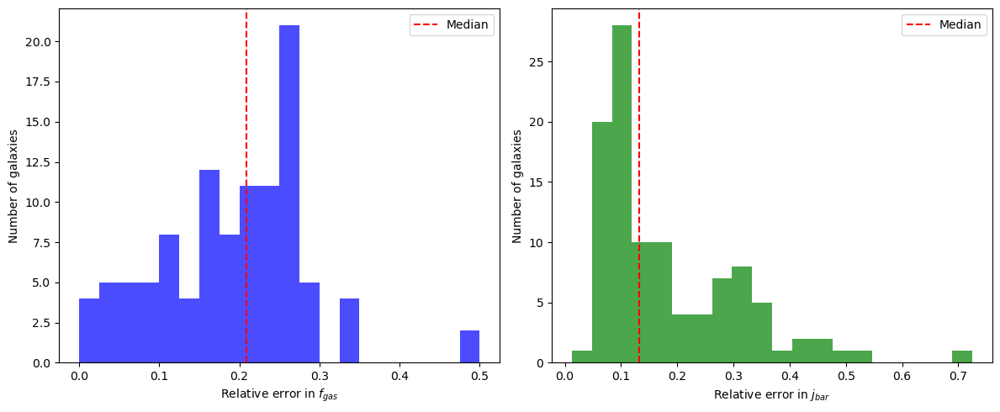

Execution time: 0.2399 seconds


In [58]:
# plot relative errors in f_gas and j_bar (in two separate histograms) and show the median values
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
rel_errors_fgas = BARY['e_fgas'] / BARY['fgas']
plt.hist(rel_errors_fgas, bins=20, color='blue', alpha=0.7)
plt.axvline(np.median(rel_errors_fgas), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $f_{gas}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.subplot(1,2,2)
rel_errors_jbar = BARY['e_j'] / BARY['j']
plt.hist(rel_errors_jbar, bins=20, color='green', alpha=0.7)
plt.axvline(np.median(rel_errors_jbar), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $j_{bar}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.tight_layout()
plt.show()

In [59]:
print(np.median(rel_errors_fgas), np.median(rel_errors_jbar))

0.20833333333333334 0.13209003215434084
Execution time: 0.0007 seconds


In [60]:
# load HIX data, and add them to the obs_data arrays
HIX_data = pd.read_csv('../data/compilation_AM_others/HIX.csv')

obs_log_Mbar_mcmc = np.log10(np.concatenate((BARY['Mass(Msun)'], 10**HIX_data['logMbar'].to_numpy())))
obs_jbar_mcmc = np.concatenate((BARY['j'], 10**HIX_data['logjbar'].to_numpy()))
obs_fgas_mcmc = np.concatenate((BARY['fgas'], HIX_data['fgas'].to_numpy()))
#for f_gas uncertainty, assume 0.1*fgas
obs_fgas_errors_mcmc = np.concatenate((BARY['e_fgas'], 0.21*HIX_data['fgas'].to_numpy()))
obs_jbar_errors_mcmc = np.concatenate((BARY['e_j'], 0.13*(10**HIX_data['logjbar'].to_numpy())))

Execution time: 0.0498 seconds


In [61]:
logM_obs_jax = jnp.array(obs_log_Mbar_mcmc, dtype=jnp.float64)
jbar_obs_jax = jnp.array(obs_jbar_mcmc, dtype=jnp.float64)
fgas_obs_jax = jnp.array(obs_fgas_mcmc, dtype=jnp.float64)
sigma_fgas_jax = jnp.array(obs_fgas_errors_mcmc, dtype=jnp.float64)
sigma_jbar_jax = jnp.array(obs_jbar_errors_mcmc, dtype=jnp.float64)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.0135 seconds


In [ ]:
t0 = 12.0
Ngal = obs_log_Mbar_mcmc.size

print(f"Testing omega inversion for {Ngal} galaxies")

n_grid = np.linspace(0.1, 2.0, 4)
k_grid = np.linspace(1.0, 3.0, 4)

for n_val in n_grid:
    for k_val in k_grid:
        Mbar_obs = 10.0**obs_log_Mbar_mcmc
        j_max = j_maxer(Mbar_obs)
        j_min = j_max / 10.0
        delta_j = k_val*j_max - j_min

        denom = delta_j
        denom = np.where(denom == 0.0, np.nan, denom)
        y_target_np = (obs_jbar_mcmc - j_min) / denom

        y_min = np.nanmin(y_target_np)
        y_max = np.nanmax(y_target_np)
        n_outside = np.sum((y_target_np < 0.0) | (y_target_np > 1.0) | ~np.isfinite(y_target_np))

        print(f"\n=== n = {n_val:.3f}, k = {k_val:.3f} ===")
        print(f"y_target range: min={y_min:.4f}, max={y_max:.4f}, "
              f"outside [0,1]: {n_outside}/{Ngal}")

        if n_outside == Ngal:
            print("All y_target outside [0,1] or non-finite --> inversion is ill-defined here.")
            continue

        y_target = jnp.array(y_target_np, dtype=jnp.float64)
        omega = solve_omega_bisect_jax(y_target, n_val, t0)

        F_val = F_omega_jax(omega, n_val, t0)
        jbar_rec = j_min + delta_j * np.array(F_val)#k_val * 

        diff = jbar_rec - obs_jbar_mcmc
        with np.errstate(divide='ignore', invalid='ignore'):
            rel_err = diff / obs_jbar_mcmc

        max_abs_diff = np.nanmax(np.abs(diff))
        max_rel_err  = np.nanmax(np.abs(rel_err))
        mean_rel_err = np.nanmean(np.abs(rel_err[np.isfinite(rel_err)]))

        print(f"max |j_rec - j_obs|      = {max_abs_diff:.6g}")
        print(f"max |(j_rec - j_obs)/j| = {max_rel_err:.6g}")
        print(f"mean |(j_rec - j_obs)/j|= {mean_rel_err:.6g}")

        sorted_indices = np.argsort(-np.abs(rel_err))
        print("Top 5 (index, j_obs, j_rec, rel_err, abs_err):")
        for rank in range(min(5, Ngal)):
            idx = sorted_indices[rank]
            print(f"  {idx:3d},  {obs_jbar_mcmc[idx]:.4e}, "
                  f"{jbar_rec[idx]:.4e}, "
                  f"{rel_err[idx]:+.3e}, "
                  f"{diff[idx]:+.3e}")
        # idx_examples = np.linspace(0, Ngal-1, min(5, Ngal), dtype=int)
        # print("Example galaxies (index, j_obs, j_rec, rel_err, abs_err):")
        # for idx in idx_examples:
        #     print(f"  {idx:3d}: {obs_jbar_mcmc[idx]:.4e}  {jbar_rec[idx]:.4e}  "
        #           f"{rel_err[idx]:+.3e}  {diff[idx]:+.3e}")

Testing omega inversion for 117 galaxies

=== n = 0.100, k = 1.000 ===
y_target range: min=0.0045, max=2.2220, outside [0,1]: 19/117


max |j_rec - j_obs|      = 3779.79
max |(j_rec - j_obs)/j| = 6.31628
mean |(j_rec - j_obs)/j|= 0.723031
Top 5 (index, j_obs, j_rec, rel_err, abs_err):
   58,  4.2670e+02, 3.1219e+03, +6.316e+00, +2.695e+03
   24,  2.0800e+01, 1.3482e+02, +5.482e+00, +1.140e+02
   60,  2.0130e+02, 8.4383e+02, +3.192e+00, +6.425e+02
  102,  8.9170e+02, 3.6286e+03, +3.069e+00, +2.737e+03
   61,  8.6600e+02, 3.4999e+03, +3.041e+00, +2.634e+03

=== n = 0.100, k = 1.667 ===
y_target range: min=0.0027, max=1.3332, outside [0,1]: 2/117
max |j_rec - j_obs|      = 7739.36
max |(j_rec - j_obs)/j| = 10.5533
mean |(j_rec - j_obs)/j|= 1.54868
Top 5 (index, j_obs, j_rec, rel_err, abs_err):
   58,  4.2670e+02, 4.9298e+03, +1.055e+01, +4.503e+03
   24,  2.0800e+01, 2.1290e+02, +9.235e+00, +1.921e+02
   60,  2.0130e+02, 1.3325e+03, +5.620e+00, +1.131e+03
  102,  8.9170e+02, 5.7300e+03, +5.426e+00, +4.838e+03
   61,  8.6600e+02, 5.5267e+03, +5.382e+00, +4.661e+03

=== n = 0.100, k = 2.333 ===
y_target range: min=0.0019, 

In [ ]:
def compute_y_target(logM_obs_jax, jbar_obs_jax, k_val):
    """
    y_target = (j_obs - j_min) / (k * (j_max - j_min))
    """
    Mbar_obs = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar_obs)
    j_min = j_max / 10.0
    delta_j = k_val*j_max - j_min
    y = (jbar_obs_jax - j_min) / (delta_j)
    return y

t0 = 12.0

n_vals = [0.1, 0.5, 0.75, 1.0, 1.5, 2.0]
k_vals = [1.0, 1.5, 2.0, 2.5]

omega_min = -1/3.
omega_max = 1.0

print(f"Testing bracket [{omega_min}, {omega_max}] for F_omega_jax\n")

for n in n_vals:
    F_lo = float(F_omega_jax(omega_max, n, t0).item())
    F_hi = float(F_omega_jax(omega_min, n, t0).item())

    print(f"=== n = {n:.3f} ===")
    print(f"  F(omega_max={omega_max}) = {F_lo:.6e}")
    print(f"  F(omega_min={omega_min}) = {F_hi:.6e}")
    print("  (allowed y_target in this bracket: [{:.3e}, {:.3e}])".format(F_lo, F_hi))

    for k in k_vals:
        y = compute_y_target(logM_obs_jax, jbar_obs_jax, k)
        y_np = jnp.array(y)

        y_min = float(jnp.min(y_np))
        y_max = float(jnp.max(y_np))

        outside_low  = jnp.sum(y_np < F_lo)
        outside_high = jnp.sum(y_np > F_hi)
        total = y_np.size

        print(f"    k = {k:.3f}: y_target in [{y_min:.3e}, {y_max:.3e}]")
        print(f"       below F(omega_max): {int(outside_low)}/{total}")
        print(f"       above F(omega_min): {int(outside_high)}/{total}")

    print()

Testing bracket [-0.3333333333333333, 1.0] for F_omega_jax

=== n = 0.100 ===
  F(omega_max=1.0) = 7.350407e-01
  F(omega_min=-0.3333333333333333) = 9.684739e-01
  (allowed y_target in this bracket: [7.350e-01, 9.685e-01])
    k = 1.000: y_target in [4.542e-03, 2.222e+00]
       below F(omega_max): 73/117
       above F(omega_min): 24/117
    k = 1.500: y_target in [3.028e-03, 1.481e+00]
       below F(omega_max): 101/117
       above F(omega_min): 4/117
    k = 2.000: y_target in [2.271e-03, 1.111e+00]
       below F(omega_max): 113/117
       above F(omega_min): 1/117
    k = 2.500: y_target in [1.817e-03, 8.888e-01]
       below F(omega_max): 115/117
       above F(omega_min): 0/117

=== n = 0.500 ===
  F(omega_max=1.0) = 2.555856e-01
  F(omega_min=-0.3333333333333333) = 8.651747e-01
  (allowed y_target in this bracket: [2.556e-01, 8.652e-01])
    k = 1.000: y_target in [4.542e-03, 2.222e+00]
       below F(omega_max): 23/117
       above F(omega_min): 28/117
    k = 1.500: y_target

Solved omega for 117 galaxies in 0.00015 seconds.
N galaxies           : 117
Solved (ok)          : 117   (1.000)
Unsolved             : 0
omega range (solved) : [-3.637, 6.403]
frac omega<0         : 0.214
y_raw range          : [0.001975, 0.9661]


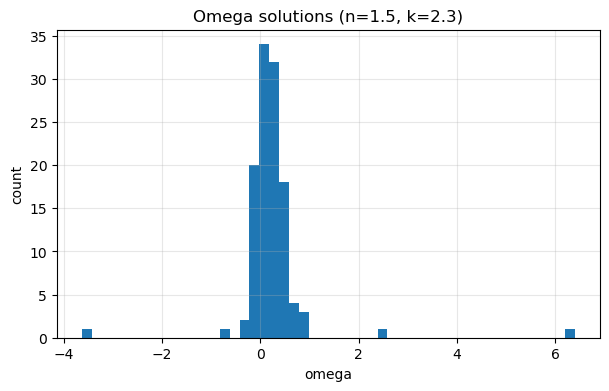

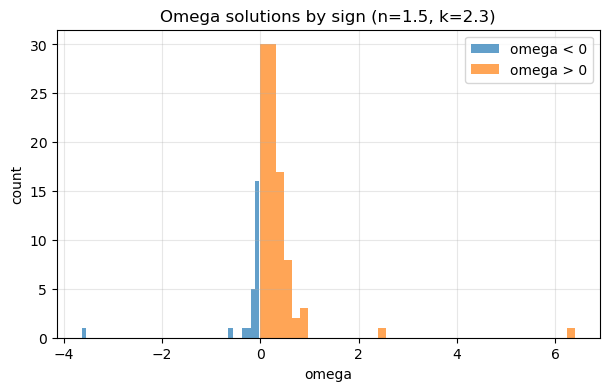

Execution time: 0.3176 seconds


In [ ]:
n_test = 1.5
k_test = 2.3
t0 = 12.0

Mbar_obs = 10.0**logM_obs_jax
j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0
delta_j = k_test*j_max - j_min

y_raw = (jbar_obs_jax - j_min) / (delta_j)

time_0 = time.time()
omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
time_1 = time.time()
print(f"Solved omega for {y_raw.size} galaxies in {time_1 - time_0:.5f} seconds.")

omega_np = np.asarray(jax.device_get(omega))
ok_np = np.asarray(jax.device_get(ok))
y_np = np.asarray(jax.device_get(y_raw))

mask = ok_np & np.isfinite(omega_np)

print(f"N galaxies           : {len(y_np)}")
print(f"Solved (ok)          : {mask.sum()}   ({mask.sum()/len(y_np):.3f})")
print(f"Unsolved             : {(~mask).sum()}")
if mask.any():
    print(f"omega range (solved) : [{omega_np[mask].min():.4g}, {omega_np[mask].max():.4g}]")
    print(f"frac omega<0         : {(omega_np[mask] < 0).mean():.3f}")
    print(f"y_raw range          : [{np.nanmin(y_np):.4g}, {np.nanmax(y_np):.4g}]")

plt.figure(figsize=(7,4))
plt.hist(omega_np[mask], bins=50)
plt.xlabel("omega")
plt.ylabel("count")
plt.title(f"Omega solutions (n={n_test}, k={k_test})")
plt.grid(True, alpha=0.3)
plt.show()

# Optional: split by sign (often helpful)
plt.figure(figsize=(7,4))
plt.hist(omega_np[mask & (omega_np < 0)], bins=40, label="omega < 0", alpha=0.7)
plt.hist(omega_np[mask & (omega_np > 0)], bins=40, label="omega > 0", alpha=0.7)
plt.xlabel("omega")
plt.ylabel("count")
plt.title(f"Omega solutions by sign (n={n_test}, k={k_test})")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


In [68]:
unsolved = (~ok_np) | (~np.isfinite(omega_np)) | (~np.isfinite(y_np))
idx_uns = np.where(unsolved)[0]

print(f"Unsolved galaxies: {len(idx_uns)}")
print("Indices:", idx_uns.tolist())

names = np.asarray(BARY["Name"].to_list() + ['HIX_galaxy']*len(HIX_data))

for i in idx_uns:
    nm = names[i]
    print(f"\n{nm}")
    print(f"  idx      = {i}")
    print(f"  y_raw    = {y_np[i]}")
    print(f"  omega    = {omega_np[i]}")
    print(f"  j_obs    = {np.asarray(jax.device_get(jbar_obs_jax))[i]}")
    print(f"  logM_obs = {np.asarray(jax.device_get(logM_obs_jax))[i]}")
    print(f"  fgas_obs = {np.asarray(jax.device_get(fgas_obs_jax))[i]}")

Unsolved galaxies: 1
Indices: [114]

HIX_galaxy
  idx      = 114
  y_raw    = 1.1109764032168208
  omega    = nan
  j_obs    = 6377.799997397691
  logM_obs = 10.59246815
  fgas_obs = 0.6782401482
Execution time: 0.0031 seconds


In [62]:
# Initial positions of walkers
ndim = 2
nwalkers = 4
nsteps = 100
initial = np.array([1.5, 2.]) # (n, k)
pos = initial + .2*np.random.randn(nwalkers, ndim)

Execution time: 0.0008 seconds


In [68]:
log_prob = make_log_probability(logM_obs_jax, jbar_obs_jax, fgas_obs_jax, sigma_fgas_jax, sigma_jbar_jax, logM_grid_jax)

Execution time: 0.0006 seconds


In [69]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob)
sampler.run_mcmc(pos, nsteps, progress=True)

100%|██████████| 100/100 [2:48:02<00:00, 100.82s/it] 


State([[1.08368392 1.10957131]
 [1.05570864 1.01817203]
 [1.08272138 1.10552225]
 [1.08549255 1.1192004 ]], log_prob=[-2.06204685e+09 -2.05113540e+09 -2.06205051e+09 -2.06103121e+09], blobs=None, random_state=('MT19937', array([2525815880, 2142846578, 2636678316, 1073298595, 2409096328,
       4278556776, 3644545403, 1002842667, 3346705312, 3311402288,
       3287842343, 1505103037, 1546079452, 3465328012, 3531566706,
        827632828, 2050411977, 3343815335, 1999477048, 3860090956,
       2768588807, 3454600914, 4104330926,  547410017, 2027091327,
       2664081969, 2068632715, 3513725456, 1131088252, 2243457707,
       1824841096, 2575979658,  230318918, 3118428069, 2273543164,
       3279960685, 1380831038, 1583287826, 3831576322,  754738279,
        844498421, 1256969006, 2111107772, 2939994660, 3665246130,
       2184516313, 3502127506, 3476310206, 3720704034, 3284999045,
       4152754752, 3978917184,    4101555,  648189687, 2356992472,
        230981362,  811173798, 2087131966,

Execution time: 10192.4230 seconds


In [70]:
flat_samples = sampler.get_chain(flat=True)
flat_logp = sampler.get_log_prob(flat=True) # discard=burn_in, thin=thin, 

print("Acceptance fractions per walker:")
print(sampler.acceptance_fraction)

print("Mean acceptance fraction:", np.mean(sampler.acceptance_fraction))

imax = np.argmax(flat_logp)
best_sample = flat_samples[imax]
best_n, best_k = best_sample

print(f"Best sample from this run: n = {best_n:.4f}, k = {best_k:.4f}")

Acceptance fractions per walker:
[0.38 0.52 0.36 0.29]
Mean acceptance fraction: 0.3875
Best sample from this run: n = 1.0557, k = 1.0182
Execution time: 0.0013 seconds


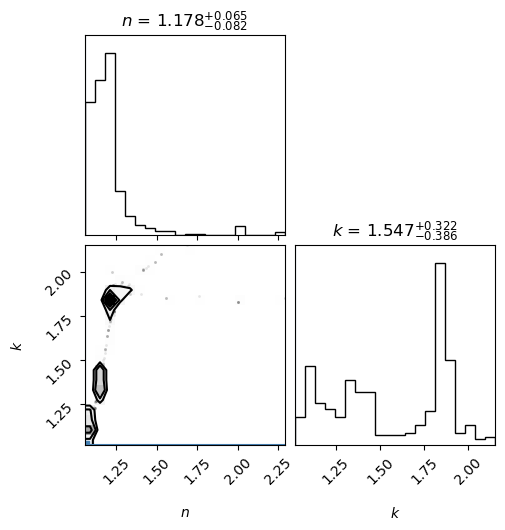

Execution time: 0.4218 seconds


In [71]:
# samples = sampler.get_chain()
# log_probs = sampler.get_log_prob()

# burn_in = min(20, nsteps//2)
# thin = 1

labels = [r"$n$", r"$k$"]

fig = corner.corner(flat_samples, labels=labels, truths=[best_n, best_k], show_titles=True, title_fmt=".3f")

plt.show()
fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_corner_plot.png")

### BlackJAX MCMC (alternative to emcee)


In [ ]:
# Requires: pip install blackjax
import blackjax


In [ ]:
# BlackJAX uses JAX arrays and PRNG keys.
# This path is fully JAX-friendly, so we can vmap + shard_map across devices.
from jax.sharding import Mesh, PartitionSpec as P
from jax.experimental.shard_map import shard_map

log_prob_bj = make_log_probability_jax(
    logM_obs_jax, jbar_obs_jax, fgas_obs_jax,
    sigma_fgas_jax, sigma_jbar_jax, logM_grid_jax
)

ndim = 2
nchains = 12
nsteps = 100
step_size = 0.1
pos_sigma = 0.5
initial = np.array([1.5, 2.])
pos = initial + pos_sigma*np.random.randn(nchains, ndim)

if hasattr(blackjax, "rmh"):
    kernel = blackjax.rmh(log_prob_bj, step_size)
elif hasattr(blackjax, "mcmc") and hasattr(blackjax.mcmc, "random_walk"):
    kernel = blackjax.mcmc.random_walk(log_prob_bj, step_size)
else:
    raise RuntimeError("Unsupported blackjax version: expected rmh or mcmc.random_walk")

def run_chain(rng_key, initial_position):
    state = kernel.init(initial_position)
    keys = jax.random.split(rng_key, nsteps)

    def step_fn(state, key):
        state, info = kernel.step(key, state)
        return state, (state.position, state.logprob, info.is_accepted)

    _, (positions, logps, accepted) = jax.lax.scan(step_fn, state, keys)
    return positions, logps, accepted

def run_chains_local(rng_keys, init_positions):
    return jax.vmap(run_chain)(rng_keys, init_positions)

devices = jax.devices()
if len(devices) < 12:
    raise RuntimeError(f"Expected at least 12 devices, found {len(devices)}")
devices = devices[:12]
num_devices = len(devices)
if nchains % num_devices != 0:
    raise RuntimeError("nchains must be divisible by num_devices for shard_map")
chains_per_device = nchains // num_devices

rng_key = jax.random.PRNGKey(0)
chain_keys = jax.random.split(rng_key, nchains)

pos_jax = jnp.array(pos, dtype=jnp.float64)
keys_jax = jnp.array(chain_keys)

pos_sharded = pos_jax.reshape(num_devices, chains_per_device, ndim)
keys_sharded = keys_jax.reshape(num_devices, chains_per_device, 2)

mesh = Mesh(np.array(devices), ("d",))
run_chains_sharded = shard_map(
    run_chains_local,
    mesh=mesh,
    in_specs=(P("d", None, None), P("d", None, None)),
    out_specs=(P("d", None, None, None), P("d", None, None), P("d", None, None)),
)

with mesh:
    samples_bj, log_probs_bj, accepted_bj = run_chains_sharded(keys_sharded, pos_sharded)

samples_bj = jnp.reshape(samples_bj, (nchains, nsteps, ndim))
log_probs_bj = jnp.reshape(log_probs_bj, (nchains, nsteps))
accepted_bj = jnp.reshape(accepted_bj, (nchains, nsteps))

flat_samples_bj = np.asarray(jax.device_get(samples_bj)).reshape(-1, ndim)
flat_logp_bj = np.asarray(jax.device_get(log_probs_bj)).reshape(-1)
acceptance_fraction_bj = np.mean(np.asarray(jax.device_get(accepted_bj)), axis=1)

print("Acceptance fractions per chain (blackjax):")
print(acceptance_fraction_bj)
print("Mean acceptance fraction (blackjax):", np.mean(acceptance_fraction_bj))

imax = np.argmax(flat_logp_bj)
best_sample_bj = flat_samples_bj[imax]
best_n_bj, best_k_bj = best_sample_bj

print(f"Best sample from this run (blackjax): n = {best_n_bj:.4f}, k = {best_k_bj:.4f}")


In [ ]:
labels = [r"$n$", r"$k$"]
fig_bj = corner.corner(
    flat_samples_bj,
    labels=labels,
    truths=[best_n_bj, best_k_bj],
    show_titles=True,
    title_fmt=".3f",
)

plt.show()
fig_bj.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_corner_plot_blackjax.png")


In [112]:
n_grid = np.linspace(0.5, 2., 4)
k_grid = np.array([1.5, 2.0, 2.3, 2.5])

logL_grid = np.zeros((len(n_grid), len(k_grid)))
for i, n_val in enumerate(n_grid):
    for j, k_val in enumerate(k_grid):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_grid[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_grid[i, j]}")

Computed logL at n=0.5, k=1.5: -4314.551017981466
Computed logL at n=0.5, k=2.0: -7582.667591550194
Computed logL at n=0.5, k=2.3: -10221.48769227176
Computed logL at n=0.5, k=2.5: -12226.056011650793
Computed logL at n=1.0, k=1.5: -1831.7316483658299
Computed logL at n=1.0, k=2.0: -1942.5084984738455
Computed logL at n=1.0, k=2.3: -2147.4555333219755
Computed logL at n=1.0, k=2.5: -2315.821642788363
Computed logL at n=1.5, k=1.5: -2160.63571925231
Computed logL at n=1.5, k=2.0: -1861.3266669958932
Computed logL at n=1.5, k=2.3: -1830.5778856037496
Computed logL at n=1.5, k=2.5: -1831.2646595827189
Computed logL at n=2.0, k=1.5: -2559.0603776843795
Computed logL at n=2.0, k=2.0: -2077.7346217735735
Computed logL at n=2.0, k=2.3: -1986.2004876724995
Computed logL at n=2.0, k=2.5: -1962.3447486627617
Execution time: 412.1469 seconds


1.5 2.3


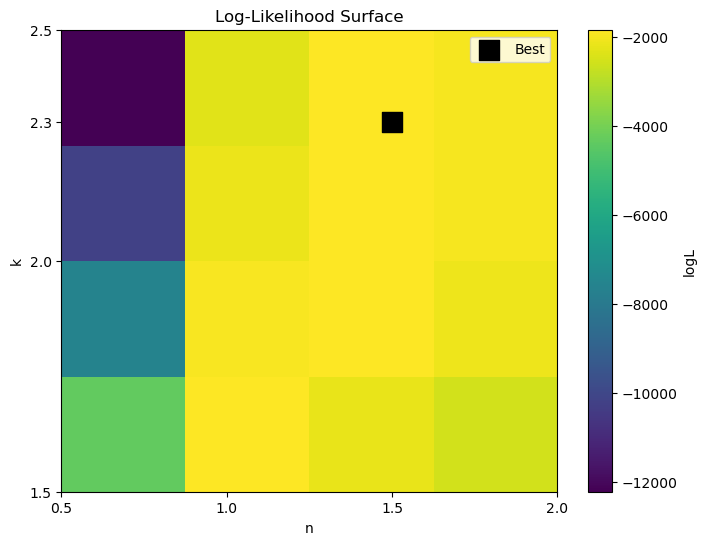

Execution time: 0.1298 seconds


In [113]:
N_grid, K_grid = np.meshgrid(n_grid, k_grid, indexing='ij')

imax = np.unravel_index(np.argmax(logL_grid), logL_grid.shape)
n_best, k_best = n_grid[imax[0]], k_grid[imax[1]]
print(n_best, k_best)

plt.figure(figsize=(8,6))
axl = plt.imshow(logL_grid.T, extent=[n_grid.min(), n_grid.max(), k_grid.min(), k_grid.max()], origin='lower', aspect='auto', cmap='viridis')
plt.scatter([n_best], [k_best], color='k', marker='s', s=200, label='Best')
plt.colorbar(axl, label='logL')
plt.xlabel('n')
plt.ylabel('k')
plt.xticks(n_grid)
plt.yticks(k_grid)
plt.title('Log-Likelihood Surface')
plt.legend()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png")
plt.show()

In [95]:
Mbar_obs = 10.0**obs_log_Mbar_mcmc

j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0
delta_j = j_max - j_min

# y_raw is y_target for k = 1
y_raw = (obs_jbar_mcmc - j_min)/delta_j

mask = obs_jbar_mcmc > j_min

if np.any(mask):
    k_min_sample = np.max(y_raw[mask])
    k_min = max(1.0, k_min_sample)
else:
    # All galaxies have j_obs <= j_min, so k >= 1 already makes them solvable
    k_min = 1.0

print(f"Suggested k_min from j_obs <= j_min + k Δj: {k_min:.3f}")


Suggested k_min from j_obs <= j_min + k Δj: 2.222


In [ ]:
names_comp = np.concatenate((BARY['Name'], ['HIX_galaxy']*len(HIX_data)))

idx_sorted = np.argsort(y_raw[mask])[::-1]
for i in idx_sorted[:5]:
    print(i, names_comp[i], obs_log_Mbar_mcmc[i], obs_jbar_mcmc[i], j_max[i], y_raw[i])
    
for i in idx_sorted[:5]:    
    print(f"{y_raw[i]:.3f}")
    
print([names_comp[i] for i in idx_sorted[:5]])

114 HIX_galaxy 10.59246815 6377.799997397691 3037.3983276937197 2.2219528064336416
5 DDO154     8.44715803134222 147.6 82.49456995133419 1.8768985251200747
2 DDO101     7.90687353472207 52.0 33.267309630764835 1.6256622684935391
85 UGC06446   9.093421685162236 355.8 244.45438396696355 1.5060958578044477
12 LVHIS030   8.991226075692495 259.3 205.87093419554282 1.2883633326073691
2.222
1.877
1.626
1.506
1.288
['HIX_galaxy', 'DDO154    ', 'DDO101    ', 'UGC06446  ', 'LVHIS030  ']


In [110]:
obs_log_Mbar_mcmc

array([ 7.7930916 ,  8.50785587,  7.90687353,  8.25042   ,  8.20139712,
        8.44715803,  8.55022835,  8.95375969,  8.1903317 ,  8.81557775,
        9.37106786,  8.47275645,  8.99122608,  8.09691001,  8.93851973,
        8.45331834,  8.64738297,  9.6294096 ,  9.79098848, 10.74350976,
        9.61700034, 10.8419848 , 10.06818586, 11.00860017,  8.90145832,
        8.92839585,  9.96707973,  9.5774918 , 11.05307844, 10.6364879 ,
        9.14612804, 10.99782308, 10.63748973, 10.49692965,  9.73239376,
       10.4456042 , 10.30319606, 10.66651798, 10.62838893, 10.6560982 ,
       10.17609126, 10.54282543, 10.54032947, 10.11394335, 10.2380461 ,
       10.80002936,  9.89542255, 11.07918125, 10.00432137, 10.55990663,
       10.53402611, 10.04921802, 10.7930916 , 10.49415459, 10.20682588,
       10.78958071,  9.99738638,  7.97173959, 10.77085201, 10.71180723,
        9.99255352, 10.83884909, 10.66651798, 10.40312052,  9.36172784,
       10.26245109, 10.7466342 , 10.13672057, 10.61595005, 10.85

In [114]:
# zoom in around best n, k
n_zoom = np.linspace(n_best - 0.4, n_best + 0.4, 4)
k_zoom = np.linspace(k_best - 0.4, k_best + 0.4, 4)

logL_zoom = np.zeros((len(n_zoom), len(k_zoom)))
for i, n_val in enumerate(n_zoom):
    for j, k_val in enumerate(k_zoom):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_zoom[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_zoom[i, j]}")

Computed logL at n=1.1, k=1.9: -1800.275081721793
Computed logL at n=1.1, k=2.1666666666666665: -1889.84170226882
Computed logL at n=1.1, k=2.433333333333333: -2022.1457715831116
Computed logL at n=1.1, k=2.6999999999999997: -2190.5071871877117
Computed logL at n=1.3666666666666667, k=1.9: -1816.794439516644
Computed logL at n=1.3666666666666667, k=2.1666666666666665: -1784.3517126079535
Computed logL at n=1.3666666666666667, k=2.433333333333333: -1797.3778938517587
Computed logL at n=1.3666666666666667, k=2.6999999999999997: -1862.7103807423898
Computed logL at n=1.6333333333333333, k=1.9: -1954.6074904023883
Computed logL at n=1.6333333333333333, k=2.1666666666666665: -1888.719695255086
Computed logL at n=1.6333333333333333, k=2.433333333333333: -1870.5534263551663
Computed logL at n=1.6333333333333333, k=2.6999999999999997: -1876.50779286534
Computed logL at n=1.9, k=1.9: -2090.52016588728
Computed logL at n=1.9, k=2.1666666666666665: -1982.8895965913887
Computed logL at n=1.9, k=2.

1.3666666666666667 2.1666666666666665


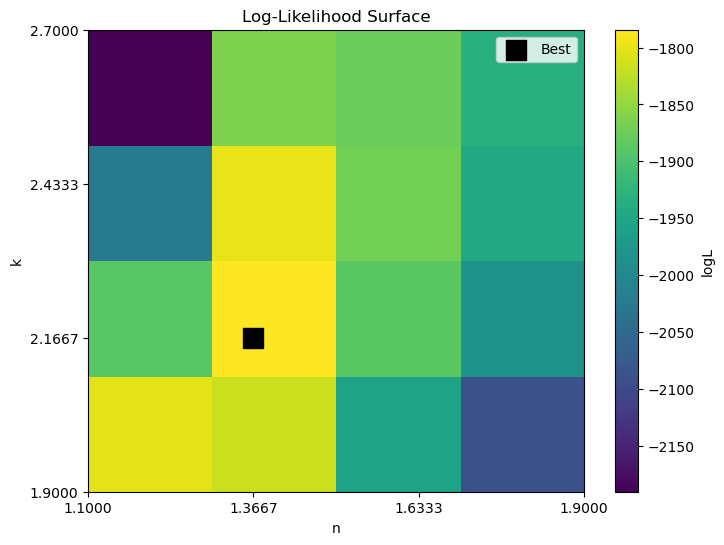

Execution time: 0.1293 seconds


In [115]:
# show logL surface as heatmap
N_zoom, K_zoom = np.meshgrid(n_zoom, k_zoom, indexing='ij')

#best n and k from logL_zoom
imax = np.unravel_index(np.argmax(logL_zoom), logL_zoom.shape)
n_best_zoom, k_best_zoom = n_zoom[imax[0]], k_zoom[imax[1]]
print(n_best_zoom, k_best_zoom)

plt.figure(figsize=(8,6))
axl = plt.imshow(logL_zoom.T, extent=[n_zoom.min(), n_zoom.max(), k_zoom.min(), k_zoom.max()], origin='lower', aspect='auto', cmap='viridis')
plt.scatter([n_best_zoom], [k_best_zoom], color='k', marker='s', s=200, label='Best')
plt.colorbar(axl, label='logL')
plt.xlabel('n')
plt.ylabel('k')
plt.xticks(n_zoom)
plt.yticks(k_zoom)
plt.title('Log-Likelihood Surface')
plt.legend()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png")
plt.show()

In [116]:
# zoom in around best n, k
n_zoom = np.linspace(1.1, 1.6333, 4)
k_zoom = np.linspace(1.9, 2.4333, 4)

logL_zoom = np.zeros((len(n_zoom), len(k_zoom)))
for i, n_val in enumerate(n_zoom):
    for j, k_val in enumerate(k_zoom):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_zoom[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_zoom[i, j]}")

Computed logL at n=1.1, k=1.9: -1800.275081721793
Computed logL at n=1.1, k=2.0777666666666668: -1854.715133926655
Computed logL at n=1.1, k=2.255533333333333: -1929.5302257697938
Computed logL at n=1.1, k=2.4333: -2022.1271108442686
Computed logL at n=1.2777666666666667, k=1.9: -1769.4433834980716
Computed logL at n=1.2777666666666667, k=2.0777666666666668: -1763.6174913144228
Computed logL at n=1.2777666666666667, k=2.255533333333333: -1794.011729864522
Computed logL at n=1.2777666666666667, k=2.4333: -1835.8353495386552
Computed logL at n=1.4555333333333333, k=1.9: -1863.764681306296
Computed logL at n=1.4555333333333333, k=2.0777666666666668: -1828.6397788858226
Computed logL at n=1.4555333333333333, k=2.255533333333333: -1815.7776633976332
Computed logL at n=1.4555333333333333, k=2.4333: -1815.5869056668503
Computed logL at n=1.6333, k=1.9: -1954.589681668464
Computed logL at n=1.6333, k=2.0777666666666668: -1903.5659540952727
Computed logL at n=1.6333, k=2.255533333333333: -1878.

1.2777666666666667 2.0777666666666668


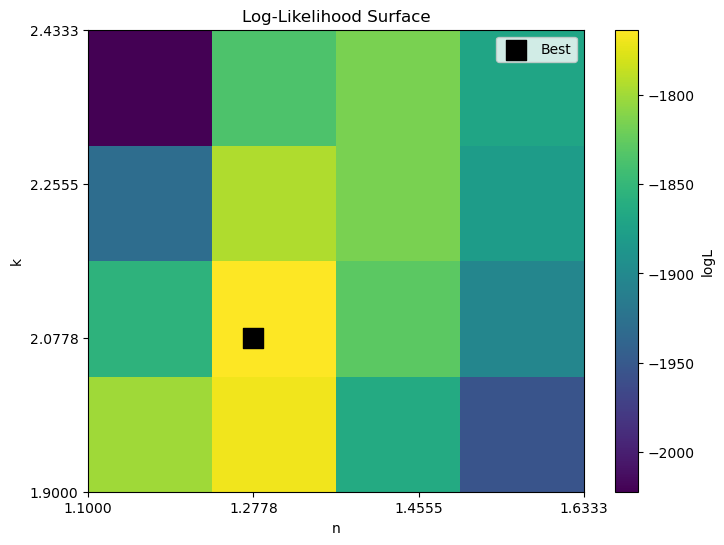

Execution time: 0.1200 seconds


In [117]:
# show logL surface as heatmap
N_zoom, K_zoom = np.meshgrid(n_zoom, k_zoom, indexing='ij')

#best n and k from logL_zoom
imax = np.unravel_index(np.argmax(logL_zoom), logL_zoom.shape)
n_best_zoom, k_best_zoom = n_zoom[imax[0]], k_zoom[imax[1]]
print(n_best_zoom, k_best_zoom)

plt.figure(figsize=(8,6))
axl = plt.imshow(logL_zoom.T, extent=[n_zoom.min(), n_zoom.max(), k_zoom.min(), k_zoom.max()], origin='lower', aspect='auto', cmap='viridis')
plt.scatter([n_best_zoom], [k_best_zoom], color='k', marker='s', s=200, label='Best')
plt.colorbar(axl, label='logL')
plt.xlabel('n')
plt.ylabel('k')
plt.xticks(n_zoom)
plt.yticks(k_zoom)
plt.title('Log-Likelihood Surface')
plt.legend()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png")
plt.show()

# Final Plots

## Final Plot (10 $t_{acc}$ and 50 $M_{bar}$)

In [ ]:
ns = 2.
ks = 2.3

r_acc_matrix_np  = build_r_acc_matrix_for_all_M(ns, ks)
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

log_M_bar_array = np.linspace(8,11.5,50)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

t_acc_array = np.array([1, 2, 3, 10, 25, -25, -10, -3], dtype=float)
t_acc_jax = jnp.array(t_acc_array, dtype=jnp.float64)

Mbar_grid = 10.0**log_M_bar_array
Mbar_grid_jax = jnp.array(Mbar_grid, dtype=jnp.float64)

f_gas_j, j_bar_j, j_gas_j, j_star_j, Ms_j, Mg_j = run_all_masses(
    Mbar_grid_jax,
    t_acc_jax,
    r_acc_matrix_jax,
    logM_grid_jax,
    star_formation_law="cutoff_ksl"
)

f_gas_array_10_50_cutoff_ksl = np.array(f_gas_j)
j_bar_array_10_50_cutoff_ksl = np.array(j_bar_j)
j_gas_array_10_50_cutoff_ksl = np.array(j_gas_j)
j_star_array_10_50_cutoff_ksl = np.array(j_star_j)
Mstar_grid = np.array(Ms_j)
Mgas_grid = np.array(Mg_j)
np.savetxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt', f_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt', j_bar_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt', j_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt', j_star_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt', Mstar_grid)
np.savetxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt', Mgas_grid)

Execution time: 40.3352 seconds


### Plot

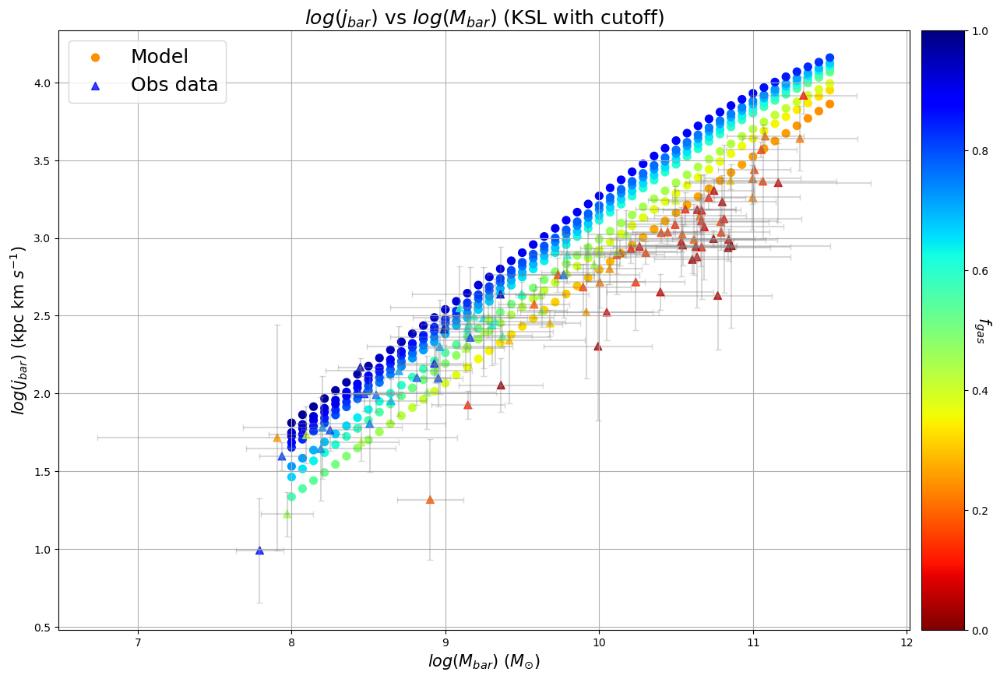

Execution time: 0.4952 seconds


In [61]:
f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_bar_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt'))
log_M_bar_array = np.linspace(8,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=50)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (50 masses, cutoff KSL, k{ks}, n{ns}).png')

# Interpolate at constant $M_{bar}$

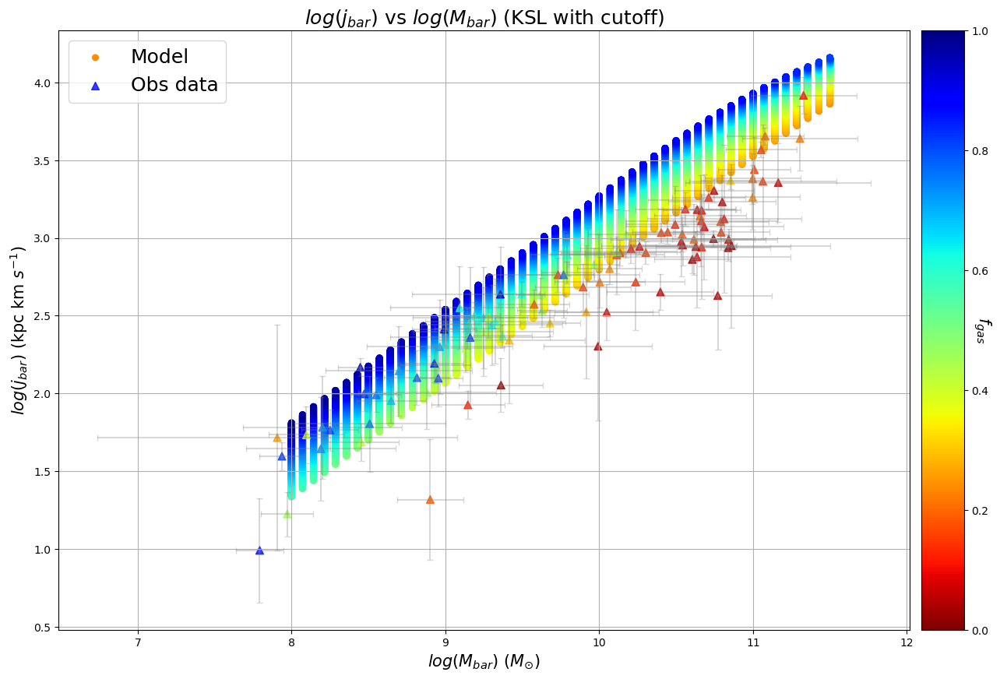

Execution time: 2.1094 seconds


In [62]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10), facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

n=1000
interp_f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    interp_f_gas_array_10_50_cutoff_ksl[i] = np.linspace(f_gas_array_10_50_cutoff_ksl[i].min(),f_gas_array_10_50_cutoff_ksl[i].max(),n)

interp_j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    ipl_10_50 = spl.interp1d(f_gas_array_10_50_cutoff_ksl[i], log_j_bar_array_10_50[i], kind='linear')
    interp_j_bar_array_10_50_cutoff_ksl[i] = ipl_10_50(interp_f_gas_array_10_50_cutoff_ksl[i])

for x, y, z in zip(log_M_bar_array, interp_j_bar_array_10_50_cutoff_ksl, interp_f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=30)
mod.set_label("Model")
cbar = fig.colorbar(mod, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (cutoff KSL).png')

## Interpolator

In [63]:
def modelled_j_bar2(f_gas_array, j_bar_array, f_gas_value, kind=1):
    """
    The function takes as input the arrays for f_gas and j_bar (possibly already interpolated), 
    together with a wanted value of f_gas for which to slice out the 1D array. 
    
    ------------
    Inputs:
    - f_gas_array = interpolated 2D array of f_gas
    - j_bar_array = interpolated 2D array of j_bar
    - f_gas_value = value of f_gas for which to slice the f_gas/j_bar arrays
    - kind = Inerpolation type (default is 1 - linear)
    
    The function does the following
    - Creates a list 'index_array', which has the indexes of constant f_gas_value chosen as elements.
    - Then, it iteratively takes from the j_bar_array the values corresponding to the indexes from index_array
    - Finally it interpolates the indexed j_bar_array through the M_bar_array, to get a plottable linear function.
    
    Returns:
    - indexed_M_array_lin = A simple linspace with the initial and final values of the original log_M_bar_array
    """
    indexed_j_array = []
    index_array = []
    true_list = []
    
    for i in range(len(log_M_bar_array)):
        if f_gas_value>np.min(f_gas_array[i]) and f_gas_value<np.max(f_gas_array[i]):
            index_array.append(np.argwhere(f_gas_array[i] == min(f_gas_array[i], key=lambda x:abs(x-f_gas_value))))
            true_list.append(1)
        else:
            index_array.append(0)
            true_list.append(0)
    
    j = 0
    while (j<50):
        if (true_list[j]==1):
            indexed_j_array.append(j_bar_array[j][index_array[j]])
        j += 1
    
    if len(indexed_j_array)>kind:
        index = np.argwhere(np.array(true_list) == 1)
        indexed_M_array = log_M_bar_array[index]
        indexed_M_array_lin = np.linspace(indexed_M_array[0], indexed_M_array[-1], 1000)
        interpolation = spl.InterpolatedUnivariateSpline(indexed_M_array.reshape(len(indexed_M_array),), indexed_j_array, k=kind)
        interpolated_j_array = interpolation(indexed_M_array_lin).reshape(len(indexed_M_array_lin),)
    else:
        indexed_M_array_lin = []
        interpolated_j_array = []
    
    return indexed_M_array_lin, interpolated_j_array

Execution time: 0.0024 seconds


## Final Graph -- interpolation at constant $f_{gas}$

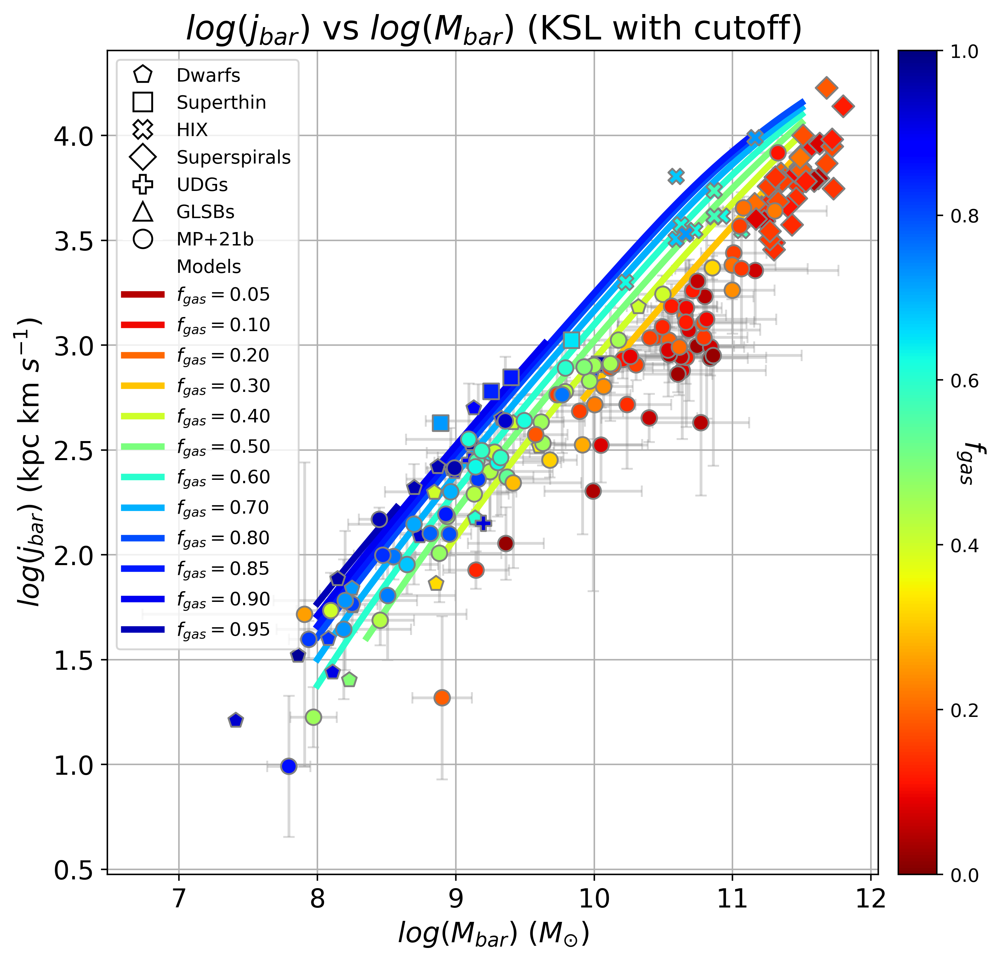

Execution time: 1.6061 seconds


In [64]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

mods = frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05, 0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9,0.95]
colors = cmap(f_gas_values)
ax1s = []
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)
    ax1s.append(ax1[0])

#Data
ax2 = frame.scatter(obs_log_Mbar, obs_log_jbar, label="MP+21b", marker="o", facecolors=cmap(BARY['fgas']), edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

markers = itertools.cycle(('p', 's', 'X', 'D', 'P', '^'))
names = itertools.cycle(('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))
scatter_legends = []
for (idx, df), i in zip(pavel_data.items(), range(3,8)):
    marker = next(markers)
    name = next(names)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=name, marker=marker, facecolors=cmap(df['fgas']), edgecolors="grey", s=70, zorder=i)
    scatter_legends.append(scatter)
    
scatter_legend_elements = [
    plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for marker, name in zip(('p', 's', 'X', 'D', 'P', '^'), ('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))
]
    
legend_elements = scatter_legend_elements + [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")] + mods + ax1s

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(handles=legend_elements)
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL).png')

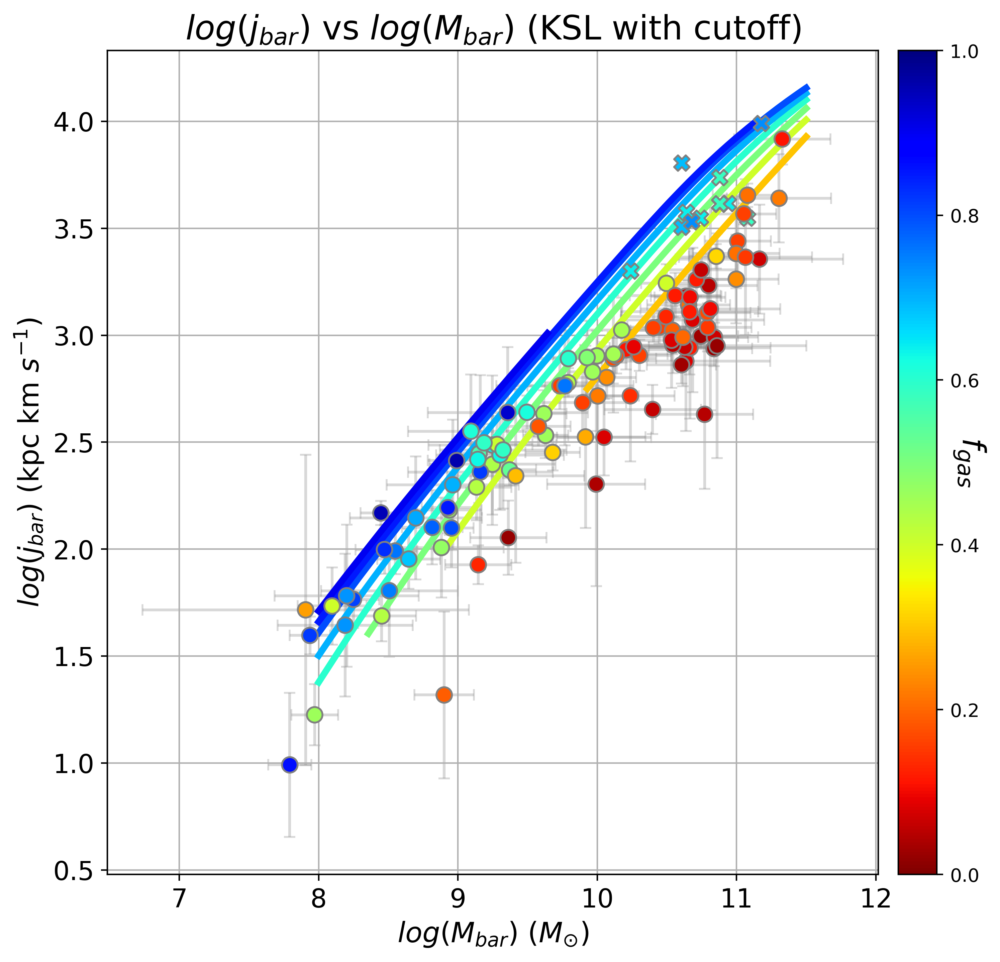

Execution time: 1.3006 seconds


In [65]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400)#, facecolor='w'
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
colors = cmap(f_gas_values)
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)

#frame.plot(log_M_bar_array, np.log10(j_maxer(10**log_M_bar_array)), color='k', lw=3.5, linestyle='dashed', alpha=0.6, label=r"$j_{max}$")

#Data
ax2 = frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="o", facecolors=cmap(BARY['fgas']), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

ax3 = frame.scatter(np.log10(10**HIX_logMstar + 10**HIX_logMHI), np.log10(HIX_jbar), label="HIX", marker="X", facecolors=cmap(10**HIX_logMHI/(10**HIX_logMstar + 10**HIX_logMHI)), edgecolors="grey", s=70, zorder=3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 12})
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL, no legend).png')

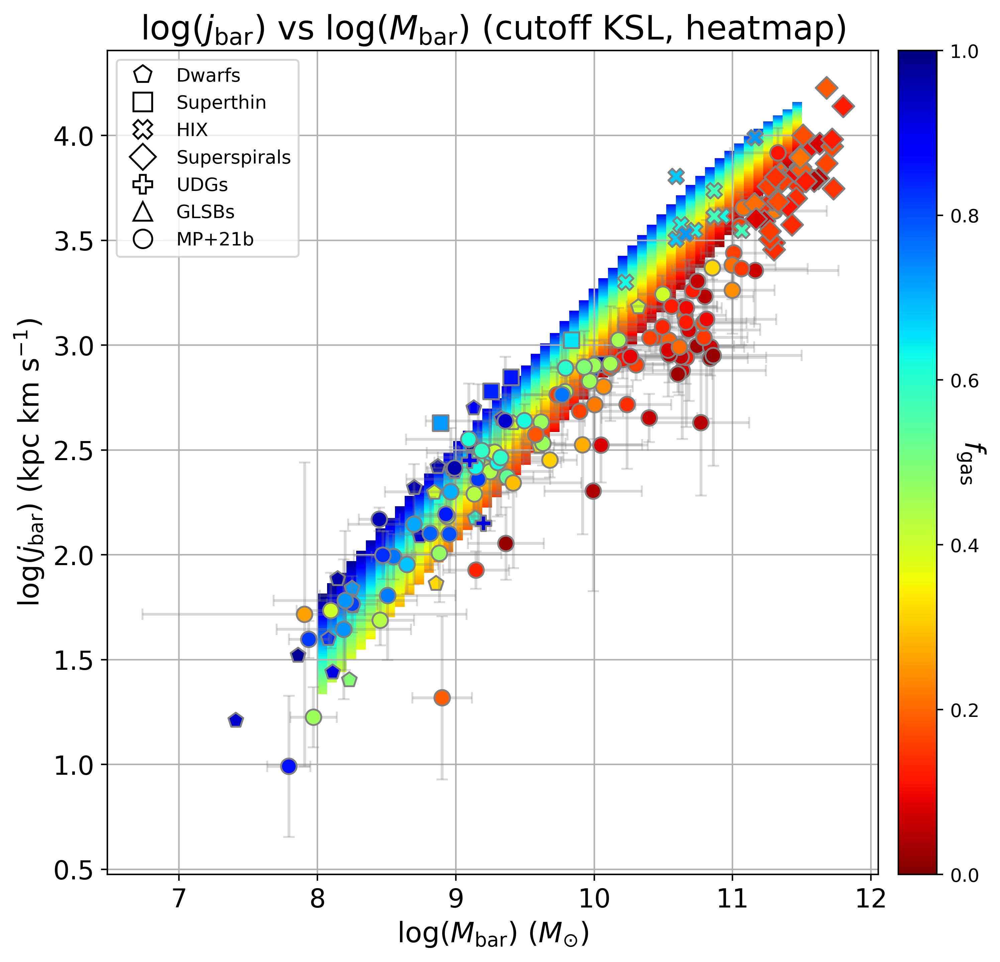

Execution time: 1.4869 seconds


In [66]:
logj_min = np.nanmin(interp_j_bar_array_10_50_cutoff_ksl)
logj_max = np.nanmax(interp_j_bar_array_10_50_cutoff_ksl)

n_j = 400 # number of j grid points
logj_grid = np.linspace(logj_min, logj_max, n_j)

n_M = len(log_M_bar_array)
F_grid = np.full((n_M, n_j), np.nan)  # F_grid[i_M, i_j] = f_gas at (logM[i_M], logj_grid[i_j])

for iM in range(n_M):
    logj_i = interp_j_bar_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)
    f_i    = interp_f_gas_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)

    mask = np.isfinite(logj_i) & np.isfinite(f_i)
    if mask.sum() < 2:
        continue

    logj_i = logj_i[mask]
    f_i    = f_i[mask]

    # sort by log j so interpolation is well-defined
    order = np.argsort(logj_i)
    logj_i = logj_i[order]
    f_i    = f_i[order]

    # f_gas as a function of log j for this mass
    f_interp = spl.interp1d(
        logj_i, f_i,
        kind='linear',
        bounds_error=False,
        fill_value=np.nan
    )

    F_grid[iM, :] = f_interp(logj_grid)

# --- 2. Plot heatmap + data ---

cmap = cm.jet_r
plt.rc("image", cmap="jet_r")

fig = plt.figure(figsize=(8, 8), dpi=400, facecolor='w')
frame = fig.add_subplot(1, 1, 1)

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

# imshow wants (Ny, Nx); our F_grid is (n_M, n_j),
# so transpose and map x -> log M, y -> log j
F_im = np.ma.masked_invalid(F_grid.T)  # shape (n_j, n_M)

im = frame.imshow(
    F_im,
    origin='lower',
    aspect='auto',
    extent=[
        log_M_bar_array.min(), log_M_bar_array.max(),
        logj_min, logj_max
    ],
    cmap=cmap,
    interpolation='nearest',
    vmin=np.nanmin(F_grid),
    vmax=np.nanmax(F_grid),
)

# --- overlay observational points (same as before) ---

# main MP+21 sample
ax2 = frame.scatter(
    obs_log_Mbar,
    obs_log_jbar,
    label="MP+21b",
    marker="o",
    facecolors=cmap(BARY['fgas']),
    edgecolors="grey",
    s=70,
    zorder=5,
)
frame.errorbar(
    obs_log_Mbar,
    obs_log_jbar,
    xerr=obs_log_Mbar_errors,
    yerr=obs_log_jbar_errors,
    fmt=' ',
    ecolor='grey',
    capsize=3,
    alpha=0.3,
    zorder=4,
)

cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15)

# extra Pavel subsamples, same as in your last plot
markers = itertools.cycle(('p', 's', 'X', 'D', 'P', '^'))
names   = itertools.cycle(('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))

for (idx, df), i in zip(pavel_data.items(), range(3, 8)):
    marker = next(markers)
    name   = next(names)
    frame.scatter(
        df['logMbar'],
        df['logjbar'],
        label=name,
        marker=marker,
        facecolors=cmap(df['fgas']),
        edgecolors="grey",
        s=70,
        zorder=i,
    )
 
scatter_legend_elements = [
    plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for marker, name in zip(('p', 's', 'X', 'D', 'P', '^'), ('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))
]   
legend_elements = scatter_legend_elements + [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")]

frame.set_title(r"$\log(j_{\rm bar})$ vs $\log(M_{\rm bar})$ (cutoff KSL, heatmap)", fontsize=18)
frame.set_xlabel(r"$\log(M_{\rm bar})\ (M_{\odot})$", fontsize=15)
frame.set_ylabel(r"$\log(j_{\rm bar})$ (kpc km s$^{-1}$)", fontsize=15)
frame.tick_params(labelsize=14)
frame.legend(handles=legend_elements)
frame.grid(zorder=1)
plt.show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log_jbar_vs_logMbar_heatmap_cutoffKSL.png')

In [125]:
pavel_data

{'dwarfs_elson':         UGC     v0    rpe   100a   M2L   mbar      Jb      jb     D    Mr  \
 0    2034.0   29.1   12.3    6.2  1.04   13.8    20.6   149.6  10.1 -17.2   
 1    3371.0   99.1   66.0   -2.8  1.87   26.0   111.0   426.2  12.8 -17.7   
 2    3711.0   92.2   12.0    0.3  0.46    7.0    14.0   198.3   8.6 -17.8   
 3    3966.0   42.7   10.2    2.1  0.08    1.4     1.1    76.8   6.0 -14.9   
 4    4173.0   27.9   20.3   14.0  2.88   40.1   132.0   329.0  16.8 -17.8   
 5    4543.0   56.5    2.4    0.3  0.56   96.1   708.5   736.5  30.3 -19.2   
 6    5272.0    9.2    9.1   58.8  0.20    1.8     1.0    57.0   6.1 -15.1   
 7    7047.0    5.9    2.3   13.8  0.25    1.2     0.5    39.8   3.5 -15.2   
 8    7232.0   11.7   10.0   46.0  0.95    1.7     0.4    25.3   3.5 -15.3   
 9    7971.0  571.1  535.0 -281.9  1.02    7.2     5.2    72.9   8.4 -17.1   
 10   9211.0   91.0   42.4   -8.0  0.52    9.8    24.5   249.3  12.6 -16.2   
 11  11861.0  206.9   58.2   -7.7  0.86  208.8  

Execution time: 0.0266 seconds


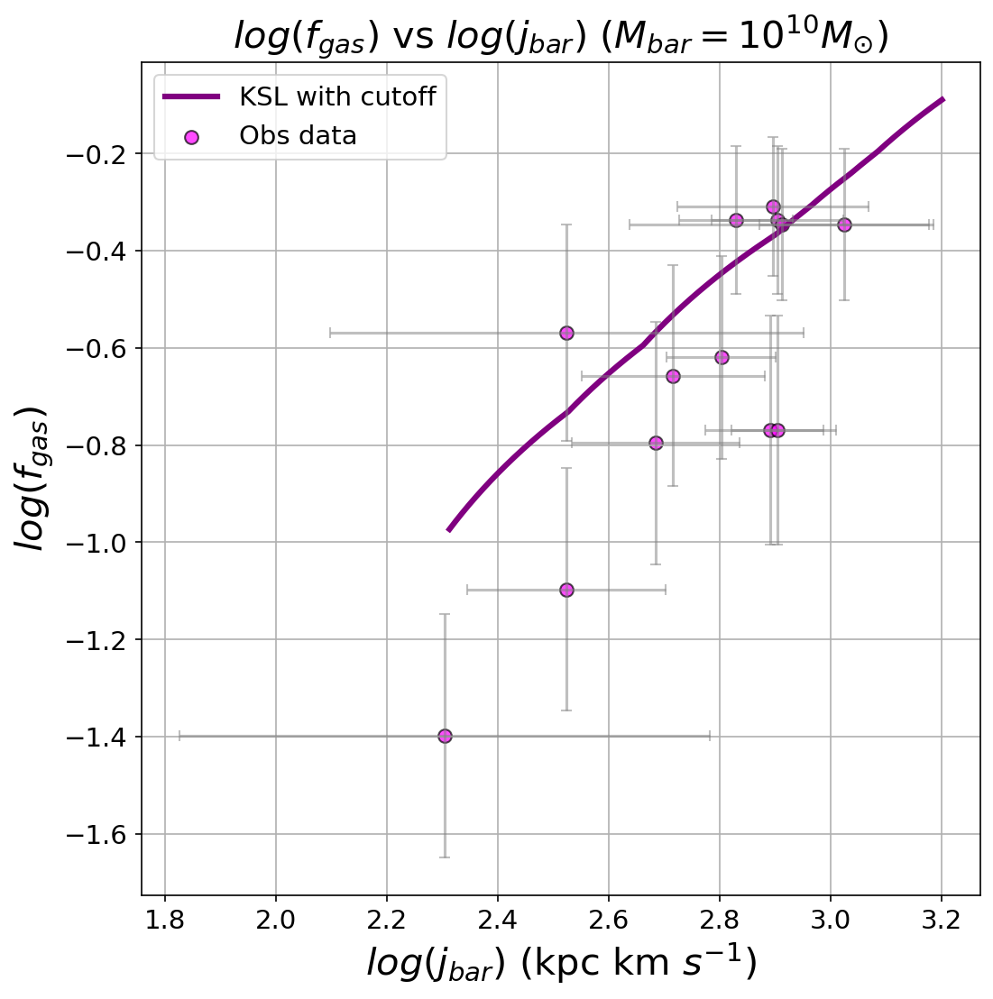

Execution time: 0.2232 seconds


In [126]:
BARY_10 = pd.read_csv('../data/baryons_10.csv')

BARY_10['j'] =  pd.to_numeric(BARY_10['j'], errors='coerce')
BARY_10['e_j'] =  pd.to_numeric(BARY_10['e_j'], errors='coerce')
BARY_10['fgas'] =  pd.to_numeric(BARY_10['fgas'], errors='coerce')
BARY_10['e_fgas'] =  pd.to_numeric(BARY_10['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_10['fgas'])
obs_fgas_errors_10 = BARY_10['e_fgas']/BARY_10['fgas']
obs_jbar_10 = np.log10(BARY_10['j'])
obs_jbar_errors_10 = BARY_10['e_j']/BARY_10['j']

M_bar_index_10 = np.argwhere(log_M_bar_array == 10)[0][0]

HIX_indices_10 = np.where((HIX_logMbar >= 9.8) & (HIX_logMbar <= 10.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_10]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_10]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_10], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_10]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_10]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
#frame.scatter(np.log10(HIX_fgas[HIX_indices_10]), np.log10(HIX_jbar[HIX_indices_10]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{10} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1.75,0)
frame.grid()
show()

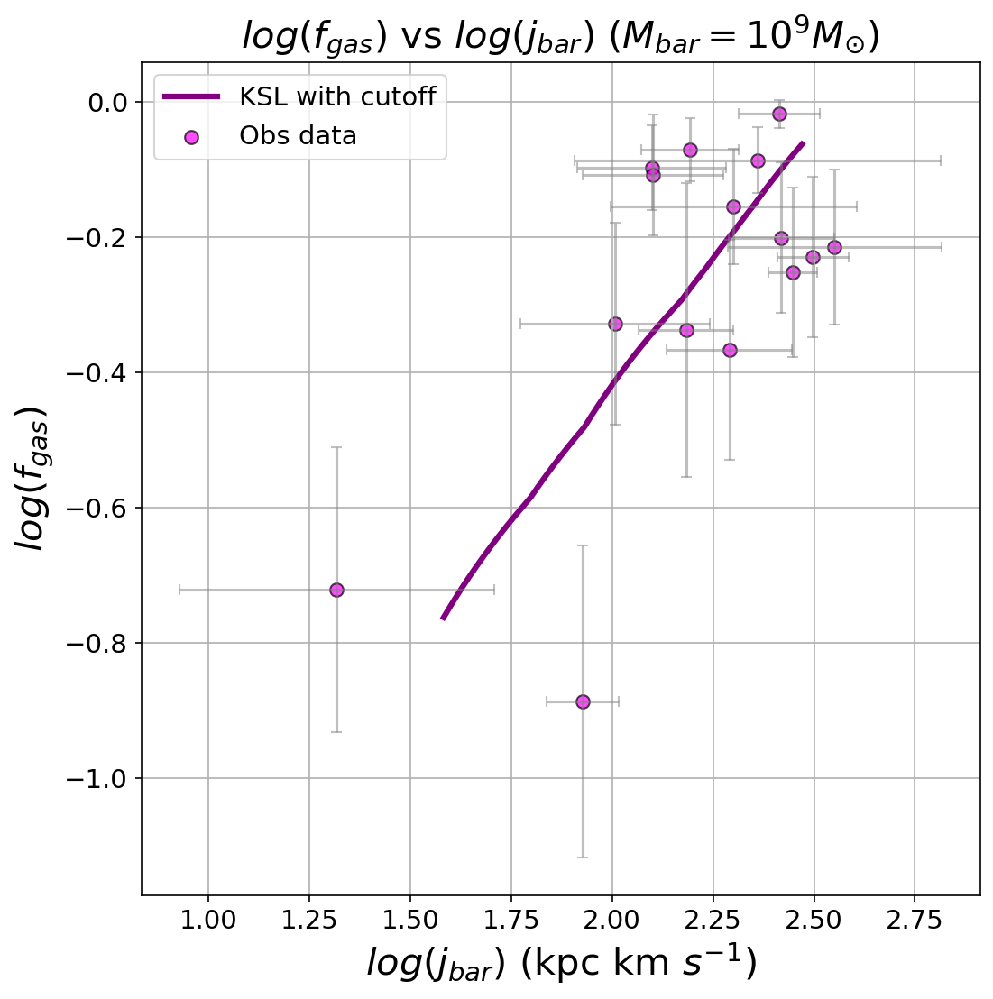

Execution time: 0.2137 seconds


In [127]:
BARY_9 = pd.read_csv('../data/baryons_9.csv')

BARY_9['j'] =  pd.to_numeric(BARY_9['j'], errors='coerce')
BARY_9['e_j'] =  pd.to_numeric(BARY_9['e_j'], errors='coerce')
BARY_9['fgas'] =  pd.to_numeric(BARY_9['fgas'], errors='coerce')
BARY_9['e_fgas'] =  pd.to_numeric(BARY_9['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_9['fgas'])
obs_fgas_errors_10 = BARY_9['e_fgas']/BARY_9['fgas']
obs_jbar_10 = np.log10(BARY_9['j'])
obs_jbar_errors_10 = BARY_9['e_j']/BARY_9['j']

M_bar_index_9 = np.argwhere(log_M_bar_array == 9)[0][0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_9]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_9]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_9], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_9]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_9]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{9} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

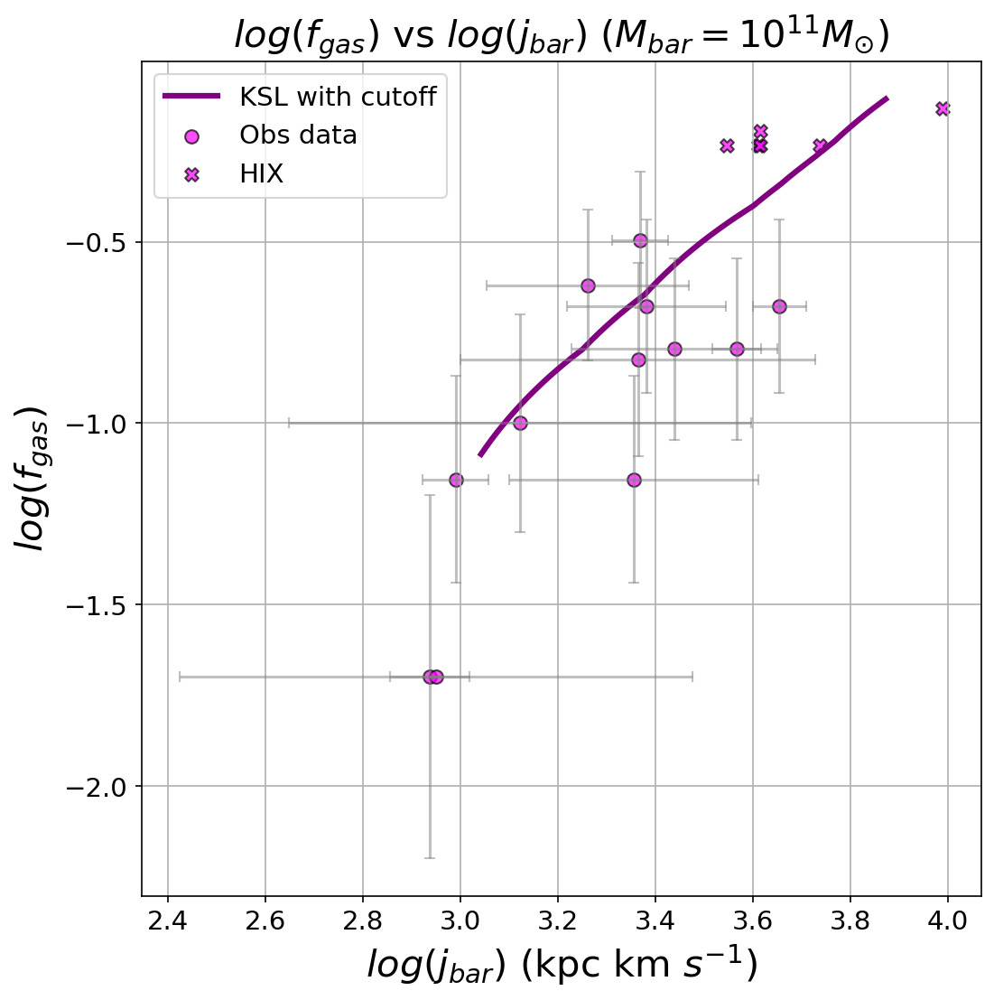

Execution time: 0.2114 seconds


In [128]:
BARY_11 = pd.read_csv('../data/baryons_11.csv')

BARY_11['j'] =  pd.to_numeric(BARY_11['j'], errors='coerce')
BARY_11['e_j'] =  pd.to_numeric(BARY_11['e_j'], errors='coerce')
BARY_11['fgas'] =  pd.to_numeric(BARY_11['fgas'], errors='coerce')
BARY_11['e_fgas'] =  pd.to_numeric(BARY_11['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_11['fgas'])
obs_fgas_errors_10 = BARY_11['e_fgas']/BARY_11['fgas']
obs_jbar_10 = np.log10(BARY_11['j'])
obs_jbar_errors_10 = BARY_11['e_j']/BARY_11['j']

M_bar_index_11 = np.argwhere(log_M_bar_array == 11)[0][0]

HIX_indices_11 = np.where((HIX_logMbar >= 10.8) & (HIX_logMbar <= 11.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_11]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_11]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_11], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_11]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_11]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.scatter(np.log10(HIX_jbar[HIX_indices_11]), np.log10(HIX_fgas[HIX_indices_11]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{11} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

### Stellar Relation

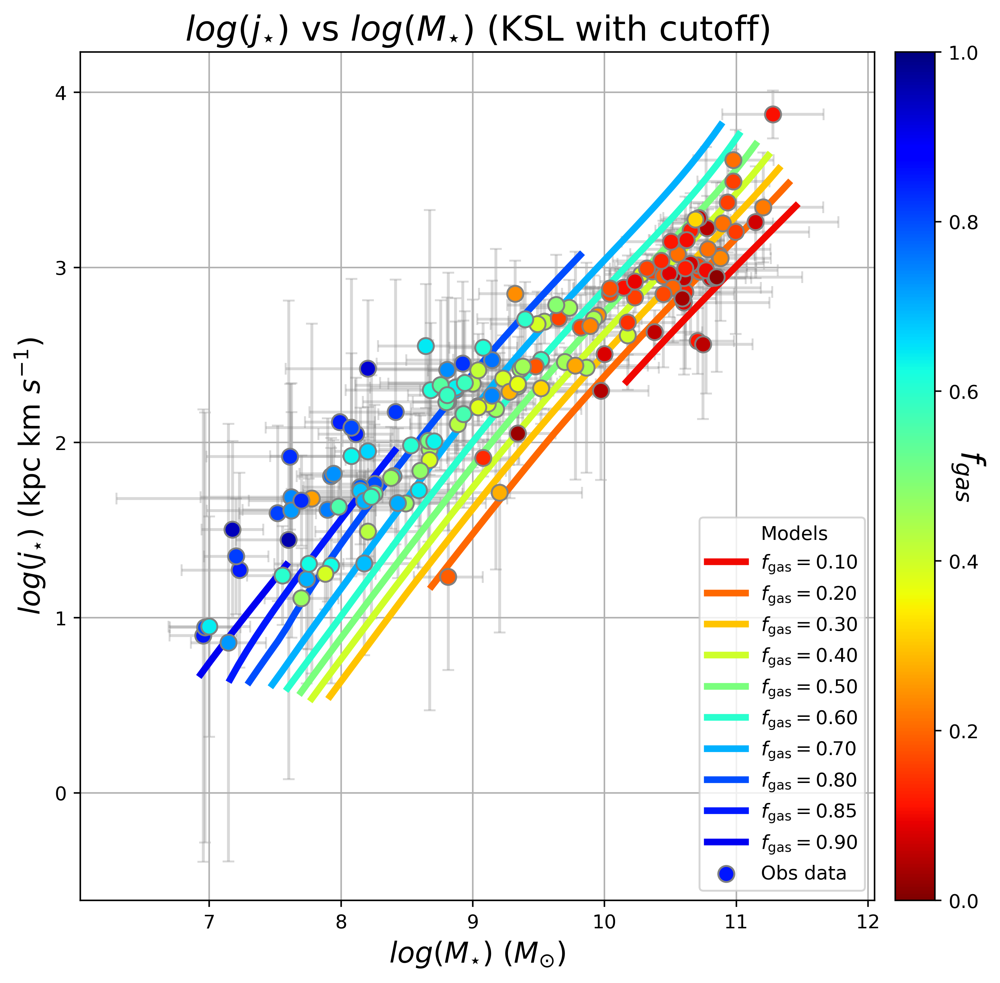

Execution time: 1.4736 seconds


In [129]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_star_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt'))
M_star_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt'))
log_M_star_array = np.linspace(7,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_star_array_10_50 = np.log10(
    j_star_array_10_50_cutoff_ksl,
    where=(j_star_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_star_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMstar = []
f_to_logjstar = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_star_array_cutoff_ksl[i]) & (M_star_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_star_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMstar.append(None); f_to_logjstar.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_star_array_cutoff_ksl[i, m][order])
    yJ = log_j_star_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMstar.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjstar.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400,  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMstar])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjstar])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mstar, obs_log_jstar, label="Obs data", marker="o",
                    facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mstar, obs_log_jstar, xerr=obs_log_Mstar_errors, yerr=obs_log_jstar_errors,
               fmt=' ', ecolor='grey', capsize=3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{\star})$ vs $log(M_{\star})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{\star})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{\star})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend()
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_star vs log_M_star with Pavel (interpolated, cutoff KSL, no legend).png')


### Gas Relation

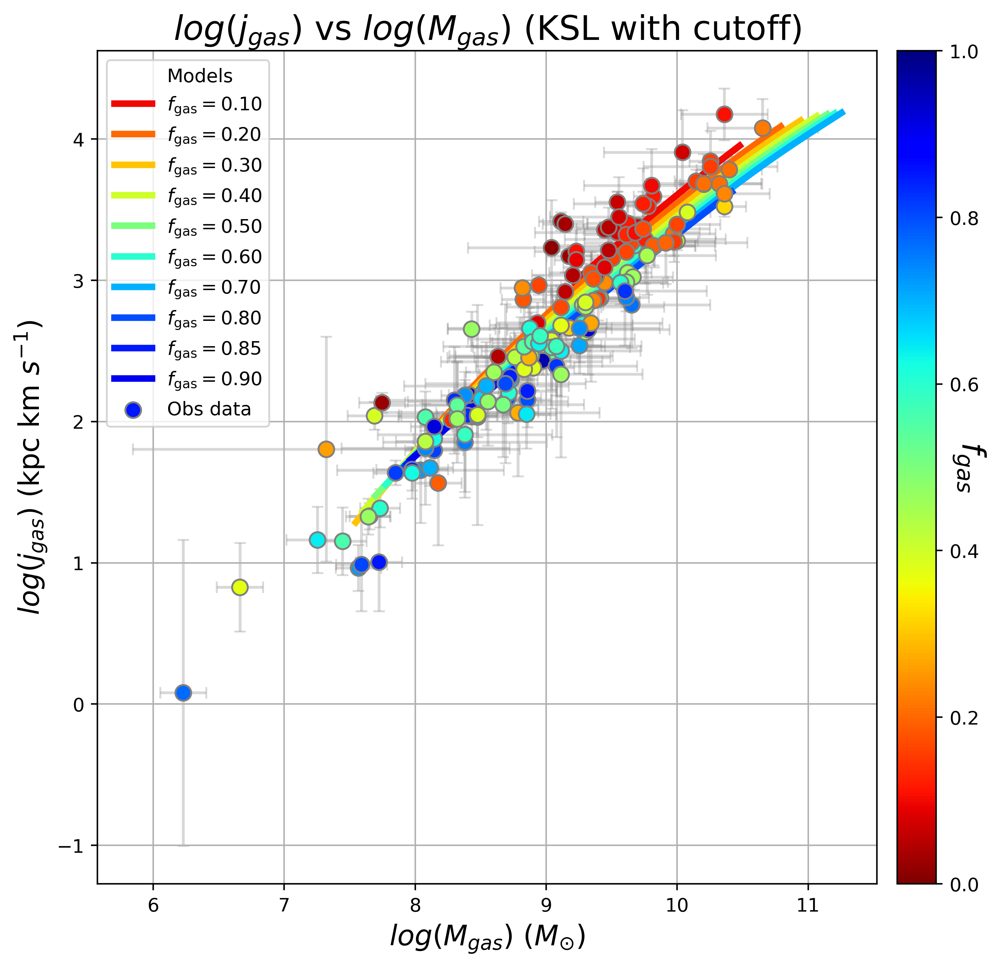

Execution time: 1.8747 seconds


In [130]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt'))
M_gas_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt'))
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_gas_array_10_50 = np.log10(
    j_gas_array_10_50_cutoff_ksl,
    where=(j_gas_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_gas_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMgas = []
f_to_logjgas = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_gas_array_cutoff_ksl[i]) & (M_gas_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_gas_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMgas.append(None); f_to_logjgas.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_gas_array_cutoff_ksl[i, m][order])
    yJ = log_j_gas_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMgas.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjgas.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMgas])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjgas])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mgas, obs_log_jgas, label="Obs data", marker="o", facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mgas, obs_log_jgas, xerr=obs_log_Mgas_errors, yerr=obs_log_jgas_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{gas})$ vs $log(M_{gas})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{gas})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{gas})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend()
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_gas vs log_M_gas with Pavel (interpolated, cutoff KSL, no legend).png')